# Final Project Notebook

**Authors:** Adriana Pinto 20221921 | David Duarte 20221899 | Maria Teresa Silva 20221821 | Marta Alves 20221899 | Miguel Nascimento 20221876  

**Year:** 2024/2025

**Deep Learning**

---
## Table of Contents

- <span style="font-size:14px;">[Imports](#1-imports)</span>
- <span style="font-size:14px;">[CSV Preprocessing](#2-csv-preprocessing)</span>
   - <span style="font-size:14px;">[Importing and Changing the folders path](#21-importing-and-changing-the-folders-path)</span>
   - <span style="font-size:14px;">[Treating Missing Values](#22-treating-missing-values)</span>
   - <span style="font-size:14px;">[Apply Stratified Train Test Split](#23-apply-stratified-train-test-split)</span>
   - <span style="font-size:14px;">[Moving images to their final directory](#24-moving-images-to-their-final-directory)</span>

- <span style="font-size:14px;">[Binary Problem](#3-binary-problem)</span>
   - <span style="font-size:14px;">[First Image Exploration and Tests](#31-first-image-exploration-and-tests)</span>
     - <span style="font-size:14px;">[Image Resizing vs Image Resizing with Padding](#311-image-resizing-vs-image-resizing-with-padding)</span>
     - <span style="font-size:14px;">[Checking for Duplicated Images](#312-checking-for-duplicated-images)</span>
     - <span style="font-size:14px;">[Arrays Checkpoint](#313-arrays-checkpoint)</span>
   - <span style="font-size:14px;">[Modelling Binary Problem](#32-modelling-binary-problem)</span>
     - <span style="font-size:14px;">[First Experiments](#321-first-experiments)</span>
     - <span style="font-size:14px;">[Testing Image Enhancement Techniques](#322-testing-image-enhancement-techniques)</span>
       - <span style="font-size:14px;">[Histogram Equalization on Grayscale Images](#3221-histogram-equalization-on-grayscale-images)</span>
       - <span style="font-size:14px;">[Contrast Limited Adaptive Histogram Equalization](#3222-contrast-limited-adaptive-histogram-equalization)</span>
     - <span style="font-size:14px;">[Testing Variations of the Middlepoint Architecture](#323-testing-variations-of-the-middlepoint-architecture)</span>
     - <span style="font-size:14px;">[Building a final model](#324-building-a-final-model)</span>
       - <span style="font-size:14px;">[1st Approach](#3241-1st-approach)</span>
       - <span style="font-size:14px;">[2nd Approach](#3242-2nd-approach)</span>
       - <span style="font-size:14px;">[Implementing Data Augmentation](#3243-implementing-data-augmentation)</span>
         - <span style="font-size:14px;">[Image Data Generator](#32431-image-data-generator)</span>
         - <span style="font-size:14px;">[Synthetic Minority Over-sampling TEchnique](#32432-synthetic-minority-over-sampling-technique)</span>
       - <span style="font-size:14px;">[Transfer Learning](#3244-transfer-learning)</span>
- <span style="font-size:14px;">[Multiclass Problem](#4-multiclass-problem)</span>
   - <span style="font-size:14px;">[First Image Exploration and Tests](#41-first-image-exploration-and-tests)</span>
     - <span style="font-size:14px;">[Image Resizing vs Image Resizing with Padding](#411-image-resizing-vs-image-resizing-with-padding)</span>
     - <span style="font-size:14px;">[Removing Duplicated Images - 128x128](#412-removing-duplicate-images---128x128)</span>
   - <span style="font-size:14px;">[Modelling Multiclass Problem](#42-modelling-multiclass-problem)</span>
     - <span style="font-size:14px;">[First Experiments](#421-first-experiments)</span>
     - <span style="font-size:14px;">[Testing Image Enhancement Techniques](#422-testing-image-enhancement-techniques)</span>
       - <span style="font-size:14px;">[Histogram Equalization on Grayscale Images](#4221-histogram-equalization-on-grayscale-images)</span>
       - <span style="font-size:14px;">[Contrast Limited Adaptive Histogram Equalization](#4222-contrast-limited-adaptive-histogram-equalization)</span>
     - <span style="font-size:14px;">[Implementing Data Augmentation](#423-implementing-data-augmentation)</span>
       - <span style="font-size:14px;">[Downsampling](#4231-downsampling-majority-class)</span>
       - <span style="font-size:14px;">[SMOTE on Minority Classes](#4232-smote-data-augmentation-on-minority-classes)</span>
       - <span style="font-size:14px;">[SMOTE on 128x128 Images](#4233-smote-data-augmentation-on-128x128-images)</span>
     - <span style="font-size:14px;">[Multi Input Model](#424-multi-input-model)</span>
       - <span style="font-size:14px;">[1st Approach - Using Binary Labels](#4241-1st-approach---using-binary-label)</span>
       - <span style="font-size:14px;">[2nd Approach - Using Binary Labels and Magnification](#4242-2nd-approach---using-binary-label-and-magnification)</span>
       - <span style="font-size:14px;">[Transfer Learning](#4243-transfer-learning)
       - <span style="font-size:14px;">[Giving just the image as Input](#4244-giving-just-the-image-as-input)
- <span style="font-size:14px;">[Conclusion about the Project](#5-conclusion-about-the-project)</span>
  - <span style="font-size:14px;">[Final Results](#51-final-results)</span>
    - <span style="font-size:14px;">[Binary Classification Results](#511-binary-classification-results)</span>
    - <span style="font-size:14px;">[Binary Classification Model Summary](#512-binary-classification-model-summary)</span>
    - <span style="font-size:14px;">[Multiclass Classification Results](#513-multiclass-classification-results)</span>
    - <span style="font-size:14px;">[Multiclass Classification Model Summary](#514-multiclass-classification-model-summary)</span>
---

# 1. Imports

In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# Basic Libraries
import os
import shutil
import datetime
from collections import Counter
from itertools import product

# Numerical and Data Manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Machine Learning
from sklearn.metrics import (
    recall_score, precision_score, f1_score, classification_report, confusion_matrix
)
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils import resample, shuffle
from imblearn.over_sampling import SMOTE
from sklearn.utils.class_weight import compute_class_weight

# TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import DenseNet121, ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dense,
    concatenate, Dropout, BatchNormalization, Lambda
)
from tensorflow.keras.callbacks import (
    EarlyStopping, ModelCheckpoint, CSVLogger, ReduceLROnPlateau
)
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras.utils import to_categorical

# Keras Tuner
import keras_tuner as kt

# Utilities
from tqdm import tqdm

# Custom Modules
from graphs import *
from functions import *

# 2. CSV Preprocessing

This section must be only executed for the first time using the data.

## 2.1. Importing and Changing the folders path

In [10]:
image_data = pd.read_csv('images/image_data_original.csv')
image_data['path_to_image'] = image_data['path_to_image'].str.replace('BreaKHis_v1/histology_slides/breast/','images/')
image_data['path_to_image'] = image_data['path_to_image'].str.replace('SOB/','')    

In [11]:
image_data

,path_to_image,Benign or Malignant,Cancer Type,Magnification
0,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X
1,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X
2,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X
3,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X
4,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X
...,...,...,...,...
7904,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X
7905,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X
7906,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X
7907,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X


## 2.2. Treating Missing Values

In [12]:
image_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7909 entries, 0 to 7908
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   path_to_image        7909 non-null   object
 1   Benign or Malignant  7906 non-null   object
 2   Cancer Type          7905 non-null   object
 3   Magnification        7905 non-null   object
dtypes: object(4)
memory usage: 247.3+ KB


In [13]:
image_data[image_data.isna().any(axis=1)]

,path_to_image,Benign or Malignant,Cancer Type,Magnification
2871,images/malignant/mucinous_carcinoma/SOB_M_MC_1...,NaN,NaN,NaN
3093,images/malignant/mucinous_carcinoma/SOB_M_MC_1...,Malignant,NaN,NaN
3228,images/malignant/mucinous_carcinoma/SOB_M_MC_1...,NaN,NaN,NaN
4536,images/malignant/ductal_carcinoma/SOB_M_DC_14-...,NaN,NaN,NaN


In [15]:
image_data = image_data.apply(fill_missing_values, axis=1)

In [16]:
image_data['Benign or Malignant'].value_counts()

Benign or Malignant
Malignant    5429
Benign       2480
Name: count, dtype: int64

In [67]:
image_data['Cancer Type'].value_counts()

Cancer Type
Ductal Carcinoma       3451
Fibroadenoma           1014
Mucinous Carcinoma      792
Lobular Carcinoma       626
Tubular Adenoma         569
Papillary Carcinoma     560
Phyllodes Tumor         453
Adenosis                444
Name: count, dtype: int64

We are dealing with an imbalanced problem. This means that the dataset splits must be stratified and the metrics used for evaluating the models must have in consideration this factor.

## 2.3. Apply Stratified Train Test Split

The split is not applied in the data images, instead it is done on the csv file, stratifying by the Cancer Type.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(image_data['path_to_image'], image_data['Cancer Type'], stratify=image_data['Cancer Type'], test_size=0.2)

In [69]:
y_train.value_counts()

Cancer Type
Ductal Carcinoma       2588
Fibroadenoma            760
Mucinous Carcinoma      594
Lobular Carcinoma       469
Tubular Adenoma         427
Papillary Carcinoma     420
Phyllodes Tumor         340
Adenosis                333
Name: count, dtype: int64

In [70]:
y_test.value_counts()

Cancer Type
Ductal Carcinoma       863
Fibroadenoma           254
Mucinous Carcinoma     198
Lobular Carcinoma      157
Tubular Adenoma        142
Papillary Carcinoma    140
Phyllodes Tumor        113
Adenosis               111
Name: count, dtype: int64

## 2.4. Moving images to their final directory

In [ ]:
# Creating a column where each observation is classified as part of the train or test set
image_data['train_test'] = image_data['path_to_image'].apply(lambda x: 'train' if x in X_train.tolist() else 'test')
# Creating a column for the final path where the image will be placed according to the set it belongs
image_data['final_path'] = image_data['path_to_image'].apply(lambda x: '/'.join(x.split('/')[:1] + 
                       ['train' if x in X_train.tolist() else 'test'] + 
                       x.split('/')[1:]))

In [ ]:
image_data

,path_to_image,Benign or Malignant,Cancer Type,Magnification,train_test,final_path
0,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X,train,images/train/benign/adenosis/SOB_B_A_14-22549A...
1,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X,test,images/test/benign/adenosis/SOB_B_A_14-22549AB...
2,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X,train,images/train/benign/adenosis/SOB_B_A_14-22549A...
3,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X,train,images/train/benign/adenosis/SOB_B_A_14-22549A...
4,images/benign/adenosis/SOB_B_A_14-22549AB/100X...,Benign,Adenosis,100X,train,images/train/benign/adenosis/SOB_B_A_14-22549A...
...,...,...,...,...,...,...
7904,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X,train,images/train/malignant/lobular_carcinoma/SOB_M...
7905,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X,train,images/train/malignant/lobular_carcinoma/SOB_M...
7906,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X,train,images/train/malignant/lobular_carcinoma/SOB_M...
7907,images/malignant/lobular_carcinoma/SOB_M_LC_14...,Malignant,Lobular Carcinoma,200X,train,images/train/malignant/lobular_carcinoma/SOB_M...


In [ ]:
# Checkpoint
image_data.to_csv('images/image_data.csv', index=False)

In [ ]:
# Copies the images to the destination paths defined, creating the folders necessary
for _, row in image_data.iterrows():
    target_dir = os.path.dirname(row['final_path'][:-1])  
    os.makedirs(target_dir, exist_ok=True)  
    shutil.copy(row['path_to_image'], row['final_path'])

# 3. Binary Problem

As we are working with imbalanced target classes, the main metric used to assess our models will be F1 Score. However, as missing a malignant cancer diagnosis (false negatives) can have severe consequences, it is important to focus on recall alongside the F1 score to ensure that the model not only predicts correctly benign and malignant cells, but minimizes the risk of overlooking actual cancer cases.

**Note**: When we fit models a second time after plotting the results for a differente number of epochs, the kernel was restarted in order to reset the weights of the model, while we keep printed the previous trials.

## 3.1. First Image Exploration and Tests

### 3.1.1 Image Resizing vs Image Resizing with Padding

Since we are working with cancer images, image quality is critical. A key consideration is how we import the images. As the original resolution of the images are rectangles, should we downscale to squares, accepting some distortion since CNNs tend to perform better with square images? Or should we preserve the original aspect ratio to avoid more distortion? <br>
To address this, we tested two methods: resizing directly to squares and resizing while maintaining the aspect ratio, then padding the remaining space to form a square.<br>
The models tested in this section will follow a simple architecture to serve as a good baseline to test the different approaches.

In [17]:
image_data = pd.read_csv('images/image_data.csv')

In [18]:
X_train=[]
X_test=[]
Y_binary_train=[]
Y_binary_test=[]
Y_multiclass_train=[]
Y_multiclass_test=[]

#### Image Resizing with Padding

In [ ]:
# Processing training images
for i in tqdm(image_data[image_data['train_test']=='train'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = resize_and_pad_pil(img, target_size=(224, 224))  # Resize and pad
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_train.append(np.array(img))  
    Y_binary_train.append(1 if label1 == 'Malignant' else 0) 
    Y_multiclass_train.append(label2)  

# Processing testing images
for i in tqdm(image_data[image_data['train_test']=='test'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = resize_and_pad_pil(img, target_size=(224, 224))  # Resize and pad
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_test.append(np.array(img))  
    Y_binary_test.append(1 if label1 == 'Malignant' else 0) 
    Y_multiclass_test.append(label2)  

100%|██████████| 1978/1978 [00:41<00:00, 47.21it/s]


In [19]:
X_train = np.asarray(X_train, dtype='float16') / 255
X_test = np.asarray(X_test, dtype='float16') / 255
Y_binary_train = np.asarray(Y_binary_train)
Y_binary_test = np.asarray(Y_binary_test)
Y_multiclass_train = np.asarray(Y_multiclass_train)
Y_multiclass_test = np.asarray(Y_multiclass_test)

##### Processing the Images

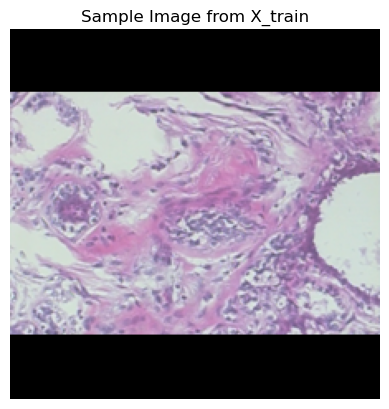

In [ ]:
#Example of an image with paddding
image = X_train[0].astype((np.float32))
plt.imshow(image)

plt.title('Sample Image from X_train')
plt.axis('off')  
plt.show()

In [ ]:
X_train.shape

(5931, 224, 224, 3)

##### Testing Resizing with Padding Approach

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [ ]:
history = model.fit(X_train, Y_binary_train, validation_split=0.3, epochs=10, batch_size=16, verbose=1)

Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 106s 377ms/step - loss: 0.7455 - precision: 0.6346 - recall: 0.6811 - val_loss: 0.3032 - val_precision: 1.0000 - val_recall: 0.9219
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 85s 327ms/step - loss: 0.5153 - precision: 0.7605 - recall: 0.8391 - val_loss: 0.3449 - val_precision: 1.0000 - val_recall: 0.9376
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 78s 302ms/step - loss: 0.5060 - precision: 0.7710 - recall: 0.8266 - val_loss: 0.3230 - val_precision: 1.0000 - val_recall: 0.9140
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 79s 304ms/step - loss: 0.5014 - precision: 0.7645 - recall: 0.8339 - val_loss: 0.1961 - val_precision: 1.0000 - val_recall: 0.9601
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 80s 307ms/step - loss: 0.4620 - precision: 0.7898 - recall: 0.8523 - val_loss: 0.4338 - val_precision: 1.0000 - val_recall: 0.8494
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 94s 361ms/step - loss: 0.4523 - precision: 0.7915 - recall: 0.8440 - val_loss: 0.3916 - val_precision: 1

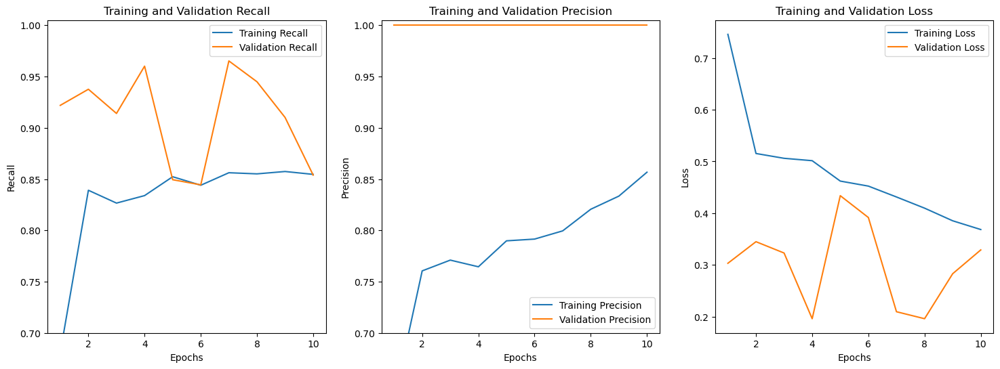

In [36]:
plot_training_history(history, y_max=1.005)

#### Image Resizing without Padding 224x224

##### Processing the Images

In [19]:
for i in tqdm(image_data[image_data['train_test']=='train'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (224,224))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_train.append(np.array(img))  
    Y_binary_train.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_train.append(label2)  

for i in tqdm(image_data[image_data['train_test']=='test'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (224,224))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_test.append(np.array(img))  
    Y_binary_test.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_test.append(label2)  

100%|██████████| 1978/1978 [00:16<00:00, 119.42it/s]


In [105]:
X_train = np.asarray(X_train, dtype='float16') / 255
X_test = np.asarray(X_test, dtype='float16') / 255
Y_binary_train = np.asarray(Y_binary_train)
Y_binary_test = np.asarray(Y_binary_test)
Y_multiclass_train = np.asarray(Y_multiclass_train)
Y_multiclass_test = np.asarray(Y_multiclass_test)

##### Testing Resizing without Padding 224x244 Approach

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:

model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])


In [ ]:
history = model.fit(X_train, Y_binary_train, validation_split=0.3, epochs=10, batch_size=16, verbose=1)

Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 102s 366ms/step - loss: 0.7067 - precision: 0.6505 - recall: 0.6906 - val_loss: 0.5914 - val_precision: 1.0000 - val_recall: 0.6860
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 83s 318ms/step - loss: 0.5477 - precision: 0.7434 - recall: 0.7966 - val_loss: 0.2321 - val_precision: 1.0000 - val_recall: 0.9466
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 81s 311ms/step - loss: 0.4962 - precision: 0.7742 - recall: 0.8611 - val_loss: 0.2748 - val_precision: 1.0000 - val_recall: 0.9736
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 88s 337ms/step - loss: 0.4972 - precision: 0.7639 - recall: 0.8425 - val_loss: 0.4128 - val_precision: 1.0000 - val_recall: 0.8433
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 80s 307ms/step - loss: 0.5114 - precision: 0.7715 - recall: 0.8234 - val_loss: 0.4929 - val_precision: 1.0000 - val_recall: 0.8652
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 79s 305ms/step - loss: 0.4435 - precision: 0.8034 - recall: 0.8751 - val_loss: 0.1798 - val_precision: 1

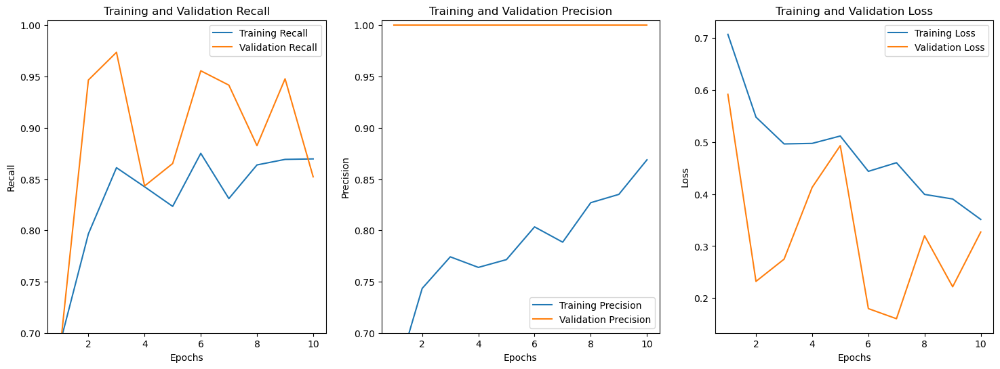

In [38]:
plot_training_history(history, y_max=1.005)

#### Image Resizing without Padding 128x128

##### Preprocessing the Images

In [ ]:
for i in tqdm(image_data[image_data['train_test']=='train'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (128,128))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_train.append(np.array(img))  
    Y_binary_train.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_train.append(label2)  

for i in tqdm(image_data[image_data['train_test']=='test'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (128,128))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_test.append(np.array(img))  
    Y_binary_test.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_test.append(label2)  

100%|██████████| 1978/1978 [00:16<00:00, 117.78it/s]


In [ ]:
X_train = np.asarray(X_train, dtype='float16') / 255
X_test = np.asarray(X_test, dtype='float16') / 255
Y_binary_train = np.asarray(Y_binary_train)
Y_binary_test = np.asarray(Y_binary_test)
Y_multiclass_train = np.asarray(Y_multiclass_train)
Y_multiclass_test = np.asarray(Y_multiclass_test)

##### Testing Resizing without Padding 128x128

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [ ]:
history = model.fit(X_train, Y_binary_train, validation_split=0.3, epochs=10, batch_size=16, verbose=1)

Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 38s 127ms/step - loss: 0.6468 - precision: 0.6745 - recall: 0.7359 - val_loss: 0.4049 - val_precision: 1.0000 - val_recall: 0.8444
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 33s 128ms/step - loss: 0.5170 - precision: 0.7612 - recall: 0.8346 - val_loss: 0.4983 - val_precision: 1.0000 - val_recall: 0.7798
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 32s 123ms/step - loss: 0.4986 - precision: 0.7813 - recall: 0.8598 - val_loss: 0.2355 - val_precision: 1.0000 - val_recall: 0.9534
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 34s 130ms/step - loss: 0.4920 - precision: 0.7822 - recall: 0.8651 - val_loss: 0.5177 - val_precision: 1.0000 - val_recall: 0.8713
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 33s 125ms/step - loss: 0.4595 - precision: 0.8030 - recall: 0.8600 - val_loss: 0.2966 - val_precision: 1.0000 - val_recall: 0.9360
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 34s 131ms/step - loss: 0.4470 - precision: 0.8016 - recall: 0.8598 - val_loss: 0.3450 - val_precision: 1.

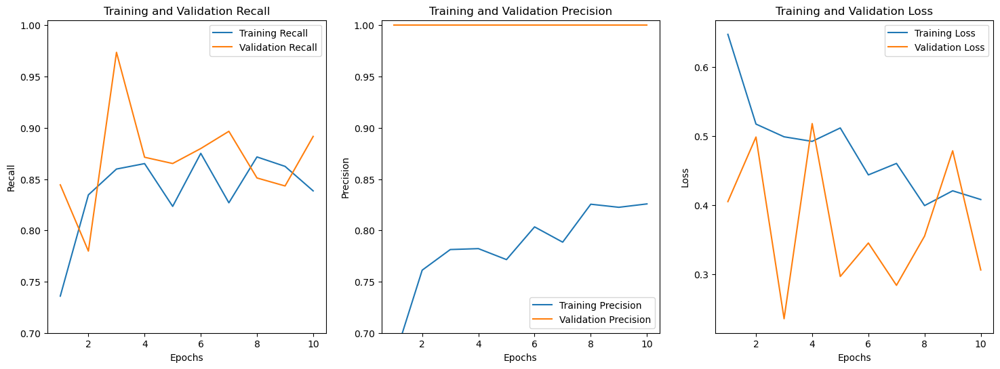

In [40]:
plot_training_history(history, y_max=1.005)

#### Conclusion 

After conducting some tests, we concluded that the results are similar for 224x224 and 128x128 images. Therefore, we opted to resize to 224x224, as this is consistent with what we have been doing in class. Additionally, since we are working with cancer detection, we aim for better scores, which can be achieved using more complex models that benefit from higher-resolution images

### 3.1.2. Checking for Duplicated Images

In this section we will check if there are duplicate images, which can lead to data leakage and contaminate the validation and test sets with images that were already used to train the models.

In [106]:
all_dataset = np.concatenate((X_test, X_train), axis=0)
all_labels_binary = np.concatenate((Y_binary_test, Y_binary_train), axis=0)
all_labels_multiclass = np.concatenate((Y_multiclass_test, Y_multiclass_train), axis=0)

In [7]:
all_dataset.shape

(7909, 224, 224, 3)

##### Removing duplicates

In [107]:
# Identifying the unique images and their corresponding indices in the dataset
unique_rows, unique_indices = np.unique(all_dataset, axis=0, return_index=True)

unique_indices = np.sort(unique_indices) # Sort the indices to maintain the original order
all_dataset_unique = all_dataset[unique_indices]

# Extract the corresponding labels for the unique images
all_labels_binary = all_labels_binary[unique_indices]
all_labels_multiclass = all_labels_multiclass[unique_indices]

print(f"Original number of rows: {all_dataset.shape[0]}")
print(f"Number of unique rows: {all_dataset_unique.shape[0]}")

Original number of rows: 7909
Number of unique rows: 7784


##### Repeating Stratified Train Test Split

As the dataset included duplicated image, a stratified train test split must be conducted again, to create new unique stratified sets.

In [ ]:
# Combining binary and multiclass labels to create a stratification variable
combined_labels = np.array([f"{binary}_{multiclass}" for binary, multiclass in zip(all_labels_binary, all_labels_multiclass)])

X_train, X_test, Y_train_binary, Y_test_binary, Y_train_multiclass, Y_test_multiclass = train_test_split(
    all_dataset_unique,
    all_labels_binary,
    all_labels_multiclass,
    test_size=0.2,
    random_state=42,
    stratify=combined_labels,  
    shuffle=True)

In [ ]:
Counter(Y_test_binary) 

Counter({1: 1060, 0: 497})

In [11]:
Counter(Y_train_binary) 

Counter({1: 4244, 0: 1983})

In [12]:
Counter(Y_test_multiclass)  

Counter({'Ductal Carcinoma': 684,
         'Fibroadenoma': 203,
         'Mucinous Carcinoma': 158,
         'Tubular Adenoma': 114,
         'Papillary Carcinoma': 112,
         'Lobular Carcinoma': 106,
         'Phyllodes Tumor': 91,
         'Adenosis': 89})

In [13]:
Counter(Y_train_multiclass)

Counter({'Ductal Carcinoma': 2737,
         'Fibroadenoma': 811,
         'Mucinous Carcinoma': 634,
         'Tubular Adenoma': 455,
         'Papillary Carcinoma': 448,
         'Lobular Carcinoma': 425,
         'Phyllodes Tumor': 362,
         'Adenosis': 355})

### 3.1.3. Arrays Checkpoint

In [14]:
np.savez('images/data_arrays.npz', arr_0=X_train, arr_1=X_test, arr_2=Y_train_binary, arr_3=Y_test_binary, arr_4=Y_train_multiclass, arr_5=Y_test_multiclass)

In [15]:
X_train.shape

(6227, 224, 224, 3)

## 3.2. Modelling Binary Problem

Importing Checkpoint

In [2]:
arrays = np.load('images/data_arrays.npz')
X_train_full = arrays['arr_0']
X_test = arrays['arr_1']
Y_binary_train = arrays['arr_2']
Y_binary_test = arrays['arr_3']
Y_multiclass_train = arrays['arr_4']
Y_multiclass_test = arrays['arr_5']

In [17]:
X_train_full.shape

(6227, 224, 224, 3)

As the first tests with image resizing and padding led to an abnormal high validation score on precision, another train_test_split will be conducted to generate a validation set from the previously created train set.

In [3]:
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_full, Y_binary_train, test_size=0.3, random_state=42, stratify=Y_binary_train, shuffle=True
)

In [ ]:
Counter(Y_binary_train)

Counter({1: 4244, 0: 1983})

In [20]:
Counter(Y_train)

Counter({1: 2970, 0: 1388})

In [4]:
Counter(Y_val)

Counter({1: 1274, 0: 595})

### 3.2.1. First Experiments

This first experimentations are crucial to gauge which type of architeture we should use, try diferent things and identify architectures' top and lower limits.

#### Extreme Maximum Architecture

In [4]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [5]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [6]:
history= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=7, batch_size=32, verbose=1)

Epoch 1/7
139/139 ━━━━━━━━━━━━━━━━━━━━ 243s 2s/step - loss: 0.6035 - precision: 0.7560 - recall: 0.8911 - val_loss: 0.4425 - val_precision: 0.8629 - val_recall: 0.8926
Epoch 2/7
139/139 ━━━━━━━━━━━━━━━━━━━━ 229s 2s/step - loss: 0.4307 - precision: 0.8475 - recall: 0.9161 - val_loss: 0.4133 - val_precision: 0.8570 - val_recall: 0.9149
Epoch 3/7
139/139 ━━━━━━━━━━━━━━━━━━━━ 228s 2s/step - loss: 0.3829 - precision: 0.8652 - recall: 0.9274 - val_loss: 0.4333 - val_precision: 0.8152 - val_recall: 0.9609
Epoch 4/7
139/139 ━━━━━━━━━━━━━━━━━━━━ 276s 2s/step - loss: 0.3915 - precision: 0.8562 - recall: 0.9135 - val_loss: 0.4048 - val_precision: 0.8303 - val_recall: 0.9571
Epoch 5/7
139/139 ━━━━━━━━━━━━━━━━━━━━ 232s 2s/step - loss: 0.3583 - precision: 0.8690 - recall: 0.9186 - val_loss: 0.3597 - val_precision: 0.8750 - val_recall: 0.9179
Epoch 6/7
139/139 ━━━━━━━━━━━━━━━━━━━━ 224s 2s/step - loss: 0.3405 - precision: 0.8775 - recall: 0.9312 - val_loss: 0.3425 - val_precision: 0.8561 - val_recall:

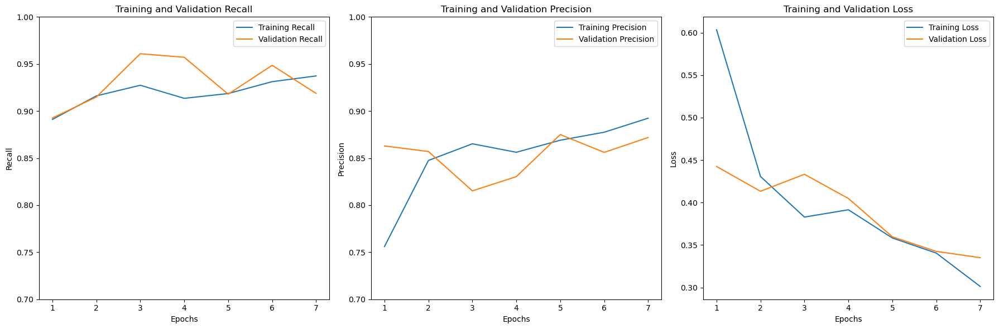

In [ ]:
plot_training_history(history)

After some runs we concluded, this architeture would probably need more epochs or more dense layers to converge to a good solution. But it takes a long time running.

#### Extreme Minimum Architecture

In [4]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [5]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [6]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=32, verbose=1)

Epoch 1/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 80s 541ms/step - loss: 0.6041 - precision: 0.6814 - recall: 0.9556 - val_loss: 0.4729 - val_precision: 0.8475 - val_recall: 0.8940
Epoch 2/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 66s 479ms/step - loss: 0.4500 - precision: 0.8450 - recall: 0.9143 - val_loss: 0.4947 - val_precision: 0.7718 - val_recall: 0.9662
Epoch 3/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 61s 441ms/step - loss: 0.4588 - precision: 0.8177 - recall: 0.9254 - val_loss: 0.4579 - val_precision: 0.8060 - val_recall: 0.9490
Epoch 4/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 60s 440ms/step - loss: 0.4347 - precision: 0.8483 - recall: 0.9227 - val_loss: 0.4423 - val_precision: 0.8212 - val_recall: 0.9411
Epoch 5/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 62s 453ms/step - loss: 0.4123 - precision: 0.8468 - recall: 0.9287 - val_loss: 0.4357 - val_precision: 0.8329 - val_recall: 0.9309
Epoch 6/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 58s 424ms/step - loss: 0.4309 - precision: 0.8486 - recall: 0.9232 - val_loss: 0.4410 - val_precision: 0.

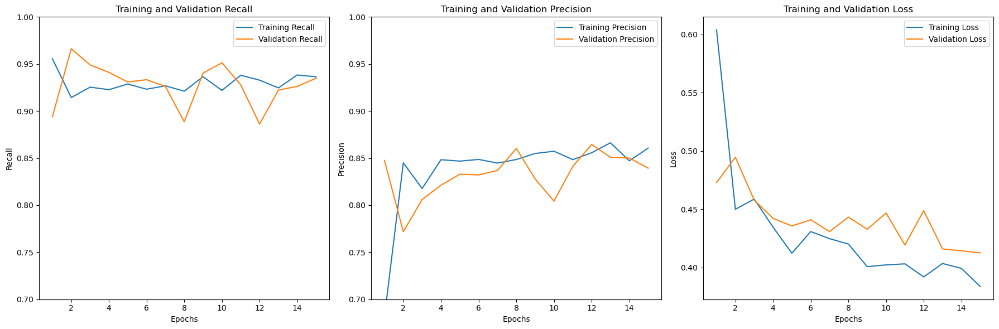

In [ ]:
plot_training_history(history)

After some runs we concluded this architeture is much faster, and can converge to similar scores than the extreme maximum approach.

#### Middlepoint Architecture

Let's try and find an architeture in the midlle that combines the advantages of the 2 so it can perform well without being too computational expensive.

In [21]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [22]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [23]:
history= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=32, verbose=1)

Epoch 1/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 105s 723ms/step - loss: 0.6309 - precision: 0.7526 - recall: 0.8852 - val_loss: 0.5017 - val_precision: 0.7488 - val_recall: 0.9733
Epoch 2/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 97s 705ms/step - loss: 0.4689 - precision: 0.8041 - recall: 0.8961 - val_loss: 0.4733 - val_precision: 0.8828 - val_recall: 0.8038
Epoch 3/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 93s 675ms/step - loss: 0.4190 - precision: 0.8436 - recall: 0.8977 - val_loss: 0.4112 - val_precision: 0.8418 - val_recall: 0.9317
Epoch 4/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 93s 680ms/step - loss: 0.4148 - precision: 0.8374 - recall: 0.9309 - val_loss: 0.3934 - val_precision: 0.8532 - val_recall: 0.9168
Epoch 5/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 89s 646ms/step - loss: 0.3938 - precision: 0.8474 - recall: 0.9225 - val_loss: 0.4472 - val_precision: 0.8890 - val_recall: 0.8234
Epoch 6/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 86s 625ms/step - loss: 0.3709 - precision: 0.8604 - recall: 0.9169 - val_loss: 0.3731 - val_precision: 0

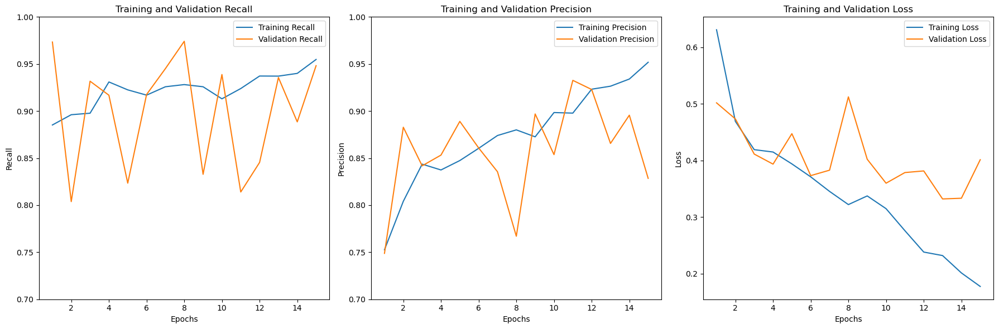

In [ ]:
plot_training_history(history)

#### Conclusion

After some runs, we can argue that this architeture is a mixture of the good results of previous models, as it runs faster and also has a higher values of recal_val and precision. The only disadvantage is the spikes often seen in validation scores and the overfit. Later we will try to deal with these 2 problems.

### 3.2.2. Testing Image Enhancement Techniques

In this section, two image enhancement techniques will be tested focusing on improving the visual quality and clarity of images, aiming to make easier for the model to detect and learn meaningful patterns, resulting in a better performance. These techniques will be tested in the Middlepoint Architecture model from before.

#### 3.2.2.1. Histogram Equalization on Grayscale Images

The histogram equalization process is an image enhancement method that adjusts the contrast of an image by modifying the image’s histogram. <br>
The intuition behind this process is that histograms with large peaks correspond to images with low contrast where the background and the foreground are both dark or both light. Hence histogram equalization stretches the peak across the whole range of values leading to an improvement in the global contrast of an image. <br>
It is usually applied to gray-scale images and it tends to produce unrealistic effects, but it is highly used where a high contrast is needed such as in medical or satellite images. <br>
https://github.com/vishallprasad/Enhancement-of-Image-using-Histogram-Manipulation

Let's test this transformation on a example image.

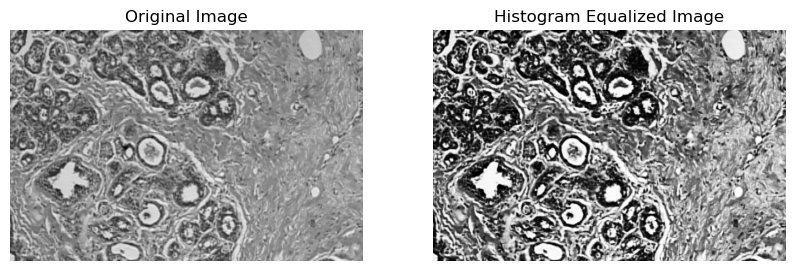

In [26]:
image = cv2.imread(r'images\benign\adenosis\SOB_B_A_14-22549AB\40X\SOB_B_A-14-22549AB-40-016.png', cv2.IMREAD_GRAYSCALE) 

# Apply Histogram Equalization
equalized_image = cv2.equalizeHist(image)

# Display the original and equalized images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[1].imshow(equalized_image, cmap='gray')
axes[1].set_title('Histogram Equalized Image')
for ax in axes:
    ax.axis('off')
plt.show()

In [ ]:
# Apply histogram equalization to all images 
equalized_X_train = np.array([equalize_grayscale_image(img) for img in X_train])
equalized_X_val = np.array([equalize_grayscale_image(img) for img in X_val])

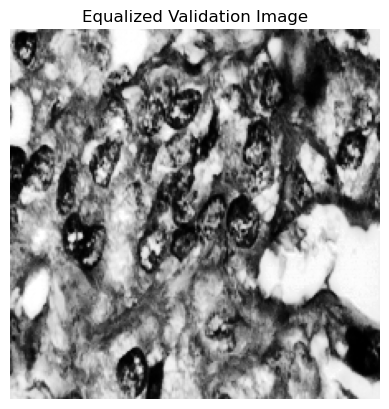

In [7]:
image = equalized_X_val[2]

plt.imshow(image , cmap='gray')
plt.title('Equalized Validation Image')
plt.axis('off')  # Hide axis
plt.show()

In [ ]:
equalized_X_train=np.asarray(equalized_X_train, dtype='float16') / 255
equalized_X_val=np.asarray(equalized_X_val, dtype='float16') / 255

In [5]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [6]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [7]:
history= model.fit(equalized_X_train, Y_train, validation_data=(equalized_X_val, Y_val), epochs=16, batch_size=32, verbose=1)

Epoch 1/16
139/139 ━━━━━━━━━━━━━━━━━━━━ 66s 418ms/step - loss: 9.2724 - precision: 0.6837 - recall: 0.7012 - val_loss: 0.8107 - val_precision: 0.7188 - val_recall: 0.3528
Epoch 2/16
139/139 ━━━━━━━━━━━━━━━━━━━━ 61s 436ms/step - loss: 0.6780 - precision: 0.7114 - recall: 0.8430 - val_loss: 0.7671 - val_precision: 0.7482 - val_recall: 0.4011
Epoch 3/16
139/139 ━━━━━━━━━━━━━━━━━━━━ 57s 411ms/step - loss: 0.7746 - precision: 0.7117 - recall: 0.7474 - val_loss: 0.6995 - val_precision: 0.7265 - val_recall: 0.6173
Epoch 4/16
139/139 ━━━━━━━━━━━━━━━━━━━━ 57s 412ms/step - loss: 0.6704 - precision: 0.7201 - recall: 0.8044 - val_loss: 0.6324 - val_precision: 0.7095 - val_recall: 0.8466
Epoch 5/16
139/139 ━━━━━━━━━━━━━━━━━━━━ 55s 398ms/step - loss: 0.6207 - precision: 0.7193 - recall: 0.8759 - val_loss: 0.7255 - val_precision: 0.6884 - val_recall: 0.9962
Epoch 6/16
139/139 ━━━━━━━━━━━━━━━━━━━━ 58s 414ms/step - loss: 0.5971 - precision: 0.7245 - recall: 0.9117 - val_loss: 0.6616 - val_precision: 0.

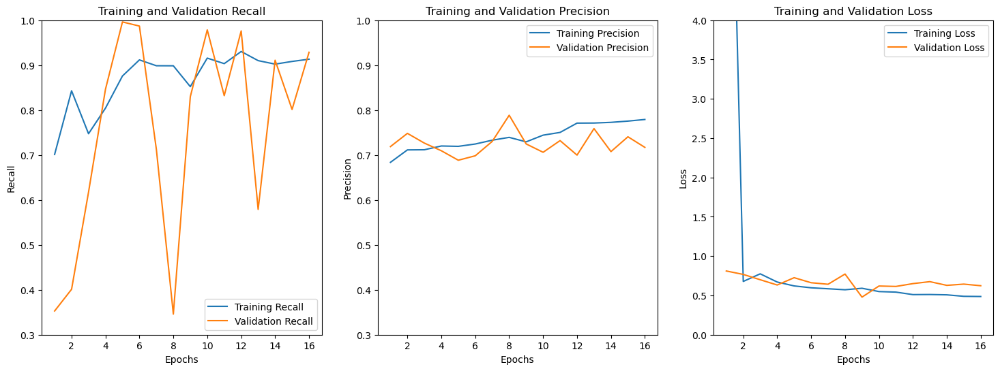

In [55]:
plot_training_history(history, y_min=0.3)

This image enhancement technique did not help achieving better scores.

#### 3.2.2.2. Contrast Limited Adaptive Histogram Equalization

Contrast Limited Adaptive Histogram Equalization (CLAHE) enhances image contrast by applying histogram equalization to small regions (tiles) within an image, rather than globally. By limiting the contrast amplification, CLAHE avoids over-enhancement and excessive noise amplification, producing more natural results. <br>
https://github.com/EshbanTheLearner/CLAHE-openCV <br>
https://github.com/ArunMekkad/ImageEnhancement---CLAHE/blob/main/image_restoration.py

Let's test this transformation on a example image.

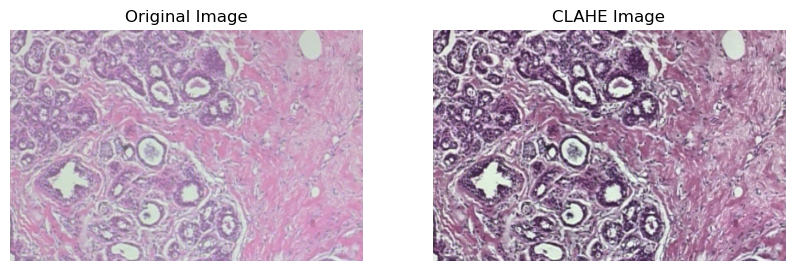

In [ ]:
image = cv2.imread(r'images\benign\adenosis\SOB_B_A_14-22549AB\40X\SOB_B_A-14-22549AB-40-016.png', cv2.IMREAD_COLOR)

lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB) # Convert the image to LAB color space
l, a, b = cv2.split(lab_image) # Split the image into channels

# Create a CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
l_clahe = clahe.apply(l) # Apply CLAHE to the L (luminance) channel only

clahe_lab = cv2.merge([l_clahe, a, b]) # Merge the CLAHE-enhanced L channel back with the original channels
clahe_image = cv2.cvtColor(clahe_lab, cv2.COLOR_LAB2BGR) # Convert back to RGB

# Display the original and CLAHE-enhanced images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Image')
axes[1].imshow(cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB))
axes[1].set_title('CLAHE Image')
for ax in axes:
    ax.axis('off')
plt.show()

In [ ]:
# Apply CLAHE to all images
X_train_clahe = np.array([apply_clahe_to_image(img) for img in X_train])
X_val_clahe = np.array([apply_clahe_to_image(img) for img in X_val])

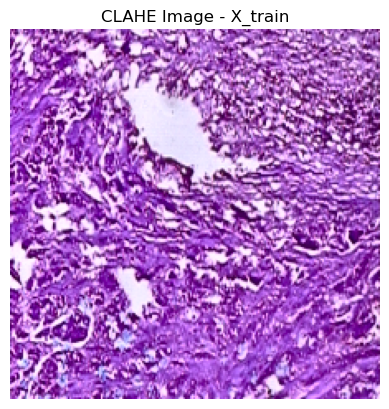

In [6]:
plt.imshow(X_train_clahe[6])
plt.title('CLAHE Image - X_train')
plt.axis('off')  # Hide axis
plt.show()

In [ ]:
X_train_clahe=np.asarray(X_train_clahe, dtype='float16') / 255
X_val_clahe=np.asarray(X_val_clahe, dtype='float16') / 255

In [5]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform', input_shape=(224, 224, 3)))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [6]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [7]:
history= model.fit(X_train_clahe, Y_train, validation_data=(X_val_clahe, Y_val), epochs=15, batch_size=32, verbose=1)

Epoch 1/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 102s 659ms/step - loss: 58.8727 - precision: 0.7096 - recall: 0.7096 - val_loss: 2.4449 - val_precision: 0.8897 - val_recall: 0.6900
Epoch 2/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 87s 637ms/step - loss: 2.7071 - precision: 0.8098 - recall: 0.8068 - val_loss: 2.3623 - val_precision: 0.9040 - val_recall: 0.5102
Epoch 3/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 78s 569ms/step - loss: 2.2566 - precision: 0.8060 - recall: 0.7992 - val_loss: 1.5431 - val_precision: 0.7731 - val_recall: 0.9521
Epoch 4/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 79s 576ms/step - loss: 1.0128 - precision: 0.8345 - recall: 0.8462 - val_loss: 1.5299 - val_precision: 0.9041 - val_recall: 0.4961
Epoch 5/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 77s 560ms/step - loss: 2.0925 - precision: 0.8058 - recall: 0.7919 - val_loss: 0.7662 - val_precision: 0.8290 - val_recall: 0.9097
Epoch 6/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 75s 547ms/step - loss: 0.6277 - precision: 0.8506 - recall: 0.8557 - val_loss: 1.0480 - val_precision: 

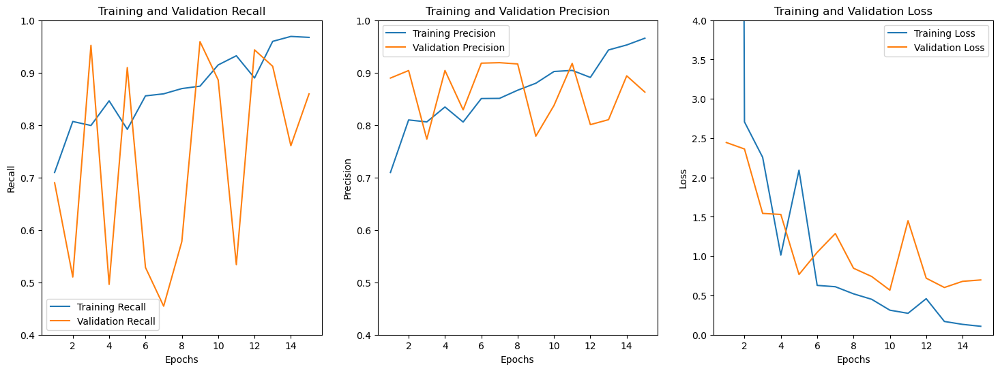

In [53]:
plot_training_history(history, y_min=0.4)

Although CLAHE led to better results than Histogram Equalization, it still has worst results than the base model without image enhancing, as precision tends to overfit and decline in latter epochs, and recall has a lot of spikes.

### 3.2.3. Testing Variations of the Middlepoint Architecture

Testing diferent architetures is an essential step, so we started doing some tests beggining with extremes, after some tries we ended up with a promissing architeture. The problem was that it wasn't very consistent, so we started experimenting with different poolings after some guidance from theorical classes we tried to add batch normalization to try normalize our results (reducing the spikes in the validation scores caused by batch variations). 

#### No Batch Normalization with Max Pooling

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [ ]:
log = CSVLogger('maxpoll_nobatchnormalization.csv')

In [ ]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1, callbacks=[log])

Epoch 1/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 89s 1s/step - loss: 0.8366 - precision: 0.7087 - recall: 0.8310 - val_loss: 0.4943 - val_precision: 0.8897 - val_recall: 0.7660
Epoch 2/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 68s 1s/step - loss: 0.4773 - precision: 0.8182 - recall: 0.8966 - val_loss: 0.4147 - val_precision: 0.8356 - val_recall: 0.9403
Epoch 3/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - loss: 0.4153 - precision: 0.8494 - recall: 0.9251 - val_loss: 0.3994 - val_precision: 0.8403 - val_recall: 0.9476
Epoch 4/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - loss: 0.3941 - precision: 0.8543 - recall: 0.9304 - val_loss: 0.4705 - val_precision: 0.7886 - val_recall: 0.9771
Epoch 5/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - loss: 0.4059 - precision: 0.8475 - recall: 0.9367 - val_loss: 0.3964 - val_precision: 0.8290 - val_recall: 0.9599
Epoch 6/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - loss: 0.4202 - precision: 0.8428 - recall: 0.9284 - val_loss: 0.3889 - val_precision: 0.8825 - val_recall: 0.8977
Epoc

#### No Batch Normalization with Average Pooling

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [ ]:
log = CSVLogger('avgpool_nobatchnormalization.csv')

In [ ]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1, callbacks=[log])

Epoch 1/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 90s 1s/step - loss: 0.8216 - precision: 0.6885 - recall: 0.7860 - val_loss: 0.4793 - val_precision: 0.8676 - val_recall: 0.8257
Epoch 2/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - loss: 0.4844 - precision: 0.8145 - recall: 0.8930 - val_loss: 0.4336 - val_precision: 0.8607 - val_recall: 0.9255
Epoch 3/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 68s 1s/step - loss: 0.4393 - precision: 0.8371 - recall: 0.9180 - val_loss: 0.4216 - val_precision: 0.8415 - val_recall: 0.9427
Epoch 4/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - loss: 0.4533 - precision: 0.8270 - recall: 0.9127 - val_loss: 0.4138 - val_precision: 0.8644 - val_recall: 0.9231
Epoch 5/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - loss: 0.4239 - precision: 0.8365 - recall: 0.9205 - val_loss: 0.4084 - val_precision: 0.8669 - val_recall: 0.9165
Epoch 6/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - loss: 0.4260 - precision: 0.8319 - recall: 0.9326 - val_loss: 0.4149 - val_precision: 0.8754 - val_recall: 0.8912
Epoc

#### Batch Normalization with Max Pooling

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [ ]:
log = CSVLogger('maxpool_batchnormalization.csv')

In [ ]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1, callbacks=[log])

Epoch 1/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 214s 3s/step - loss: 0.5740 - precision: 0.8283 - recall: 0.8641 - val_loss: 0.5817 - val_precision: 0.6865 - val_recall: 1.0000
Epoch 2/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 215s 3s/step - loss: 0.2309 - precision: 0.9206 - recall: 0.9484 - val_loss: 0.7893 - val_precision: 0.6883 - val_recall: 0.9992
Epoch 3/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 212s 3s/step - loss: 0.2128 - precision: 0.9369 - recall: 0.9369 - val_loss: 1.0503 - val_precision: 0.6885 - val_recall: 1.0000
Epoch 4/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 213s 3s/step - loss: 0.1090 - precision: 0.9765 - recall: 0.9751 - val_loss: 0.6658 - val_precision: 0.7221 - val_recall: 0.9951
Epoch 5/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 170s 3s/step - loss: 0.0498 - precision: 0.9899 - recall: 0.9891 - val_loss: 0.4149 - val_precision: 0.8512 - val_recall: 0.9223
Epoch 6/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 168s 3s/step - loss: 0.0364 - precision: 0.9947 - recall: 0.9958 - val_loss: 0.5357 - val_precision: 0.8201 - val_recall: 0.973

#### Batch Normalization with Average Pooling

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Precision(),Recall()])

In [ ]:
log = CSVLogger('avgpool_batchnormalization.csv')

In [ ]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1, callbacks=[log])

Epoch 1/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 238s 3s/step - loss: 0.4971 - precision: 0.8538 - recall: 0.8432 - val_loss: 0.7484 - val_precision: 0.6058 - val_recall: 0.3232
Epoch 2/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 211s 3s/step - loss: 0.2258 - precision: 0.9210 - recall: 0.9410 - val_loss: 0.6688 - val_precision: 0.6825 - val_recall: 0.7054
Epoch 3/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 196s 3s/step - loss: 0.1506 - precision: 0.9622 - recall: 0.9610 - val_loss: 0.8086 - val_precision: 0.7100 - val_recall: 0.9738
Epoch 4/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 196s 3s/step - loss: 0.1071 - precision: 0.9759 - recall: 0.9687 - val_loss: 0.5994 - val_precision: 0.7474 - val_recall: 0.9591
Epoch 5/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - loss: 0.0749 - precision: 0.9870 - recall: 0.9850 - val_loss: 0.4689 - val_precision: 0.8106 - val_recall: 0.9280
Epoch 6/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 174s 3s/step - loss: 0.0753 - precision: 0.9833 - recall: 0.9831 - val_loss: 0.2954 - val_precision: 0.8716 - val_recall: 0.950

#### Comparing Results

In [ ]:
avg_nbatch = pd.read_csv('bactch_trials_csv\\avgpool_nobatchnormalization.csv')
avg_batch = pd.read_csv('bactch_trials_csv\\avgpool_batchnormalization.csv')
max_nbatch = pd.read_csv('bactch_trials_csv\\maxpoll_nobatchnormalization.csv')
max_batch = pd.read_csv('bactch_trials_csv\\maxpool_batchnormalization.csv')

In [ ]:
cols = ['epoch', 'loss', 'precision', 'recall', 'val_loss', 'val_precision', 'val_recall']
avg_nbatch.columns = cols
avg_batch.columns = cols
max_nbatch.columns = cols
max_batch.columns = cols

In [ ]:
avg_nbatch['model'] = 'avg_nbatch'
avg_batch['model'] = 'avg_batch'
max_nbatch['model'] = 'max_nbatch'
max_batch['model'] = 'max_batch'

In [ ]:
joined_df = pd.concat([avg_nbatch, avg_batch, max_nbatch, max_batch])

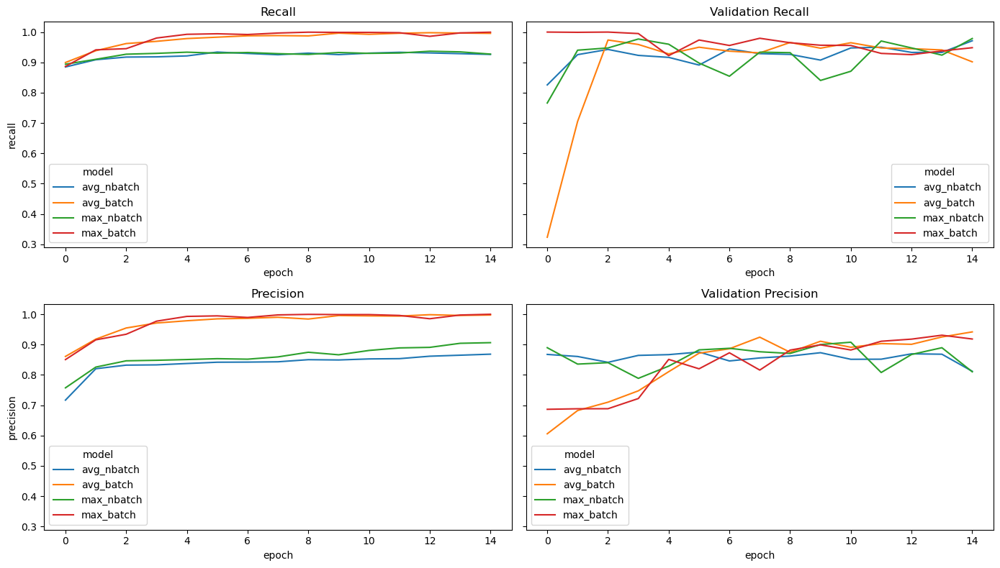

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(14, 8), sharey=True)
axs = axs.flatten()

sns.lineplot(data=joined_df, x='epoch', y='recall', hue='model', ax=axs[0])
sns.lineplot(data=joined_df, x='epoch', y='val_recall', hue='model', ax=axs[1])
sns.lineplot(data=joined_df, x='epoch', y='precision', hue='model', ax=axs[2])
sns.lineplot(data=joined_df, x='epoch', y='val_precision', hue='model', ax=axs[3])

axs[0].set_title('Recall')
axs[1].set_title('Validation Recall')
axs[2].set_title('Precision')
axs[3].set_title('Validation Precision')

plt.tight_layout()
plt.show()

We observe that avg_batch and max_batch yield similar results, with max_batch performing slightly better overall. Models without batch normalization tend to avoid overfitting in later epochs but generally achieve lower scores. <br>
Based on these observations, we selected max_batch as the preferred option. Moving forward, we plan to explore more complex models to address overfitting while maintaining high precision and recall scores.

### 3.2.4. Building a final model

Since we are using the F1 score as our evaluation metric, we will monitor the validation_loss as we want the best recall (specially) and precision. Given the already strong performance, grid search may not be worthwhile, as it primarily optimizes hyperparameters for validation, which could result in poor generalization on the test set. This makes grid search an inefficient use of computational resources in this scenario. Instead, we will explore alternative methods to further optimize our scores, and leave grid search for the multiclass problem.

#### 3.2.4.1. 1st Approach

This approach aims to control the overfitting using as baseline the architecture of the previous model with Batch Normalization and Max Pooling, by introducing 2 Dropout layers in between the fully connected layers.

##### Training

In [31]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

In [5]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Recall(), Precision()])

model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping, model_checkpoint]

In [6]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.9734 - precision: 0.8015 - recall: 0.7963
Epoch 1: val_loss improved from inf to 1.05284, saving model to best_model_by_loss.keras
139/139 ━━━━━━━━━━━━━━━━━━━━ 246s 2s/step - loss: 0.9723 - precision: 0.8017 - recall: 0.7965 - val_loss: 1.0528 - val_precision: 0.6867 - val_recall: 1.0000
Epoch 2/25
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.4911 - precision: 0.8471 - recall: 0.8859
Epoch 2: val_loss did not improve from 1.05284
139/139 ━━━━━━━━━━━━━━━━━━━━ 233s 2s/step - loss: 0.4909 - precision: 0.8471 - recall: 0.8859 - val_loss: 1.1610 - val_precision: 0.7020 - val_recall: 0.9916
Epoch 3/25
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.4180 - precision: 0.8567 - recall: 0.8917
Epoch 3: val_loss improved from 1.05284 to 0.40470, saving model to best_model_by_loss.keras
139/139 ━━━━━━━━━━━━━━━━━━━━ 233s 2s/step - loss: 0.4178 - precision: 0.8568 - recall: 0.8917 - val_loss: 0.4047 - val_precision: 0.8181 - val_rec

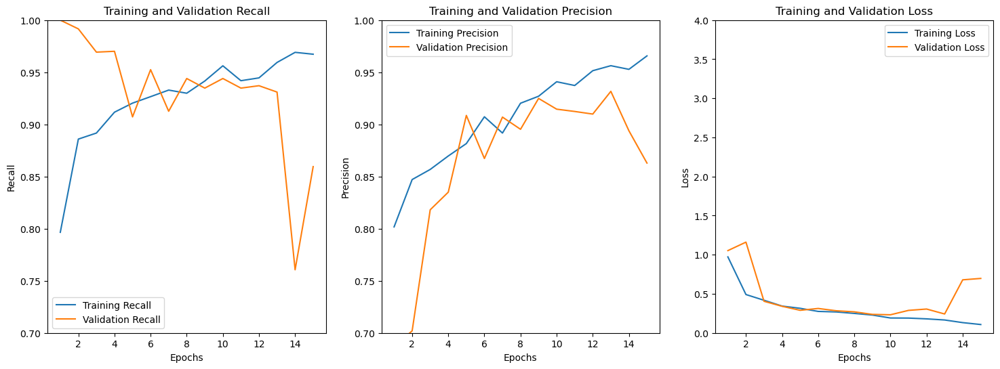

In [57]:
plot_training_history(history)

##### Scores Evaluation

In [ ]:
#model.compile(loss=None)
#EXPORT_PATH = 'final_binary.keras'
#model.save(EXPORT_PATH)

loss: 0.1910 - precision: 0.9409 - recall: 0.9562 - train_f1 score : 0.9485<br> 
val_loss: 0.2321 - val_precision: 0.9146 - val_recall: 0.9440 - val_f1 score: 0.9291 <br> 
test_precision: 0.9283 - test recall: 0.9318 - test_f1 score: 0.9291

In [29]:
test_loss, test_precision, test_recall = model.evaluate(X_test, Y_binary_test, verbose=1)

49/49 ━━━━━━━━━━━━━━━━━━━━ 14s 271ms/step - loss: 0.1854 - precision: 0.9373 - recall: 0.9442


In [ ]:
calculate_f1_score(0.9409, 0.9562) #train f1 score

0.9484883031996204

In [ ]:
calculate_f1_score(0.9146, 0.9440) #validation f1 score

0.929067470138814

In [30]:
calculate_f1_score(0.9373, 0.9442) #test f1 score

0.9407373478607495

As observed, we already achieved strong results without relying on grid search or extensive data preprocessing. However, we aim to explore how much further we can improve with minimal changes to preprocessing. To start, we will conduct a basic analysis of our model's performance.

In [ ]:
#model.compile()
#EXPORT_PATH = 'final_binary.keras'
#model.save(EXPORT_PATH)

In [7]:
load = load_model('Best models\\final_binary.keras')

In [ ]:
predictions = (load.predict(X_test) > 0.5).astype(int).flatten()

49/49 ━━━━━━━━━━━━━━━━━━━━ 12s 229ms/step


In [9]:
print(classification_report(Y_binary_test, predictions))

              precision    recall  f1-score   support

           0       0.89      0.84      0.86       497
           1       0.93      0.95      0.94      1060

    accuracy                           0.92      1557
   macro avg       0.91      0.90      0.90      1557
weighted avg       0.92      0.92      0.92      1557



##### Predictions Evaluation

True Positives (TP): 1011
True Negatives (TN): 419
False Positives (FP): 78
False Negatives (FN): 74


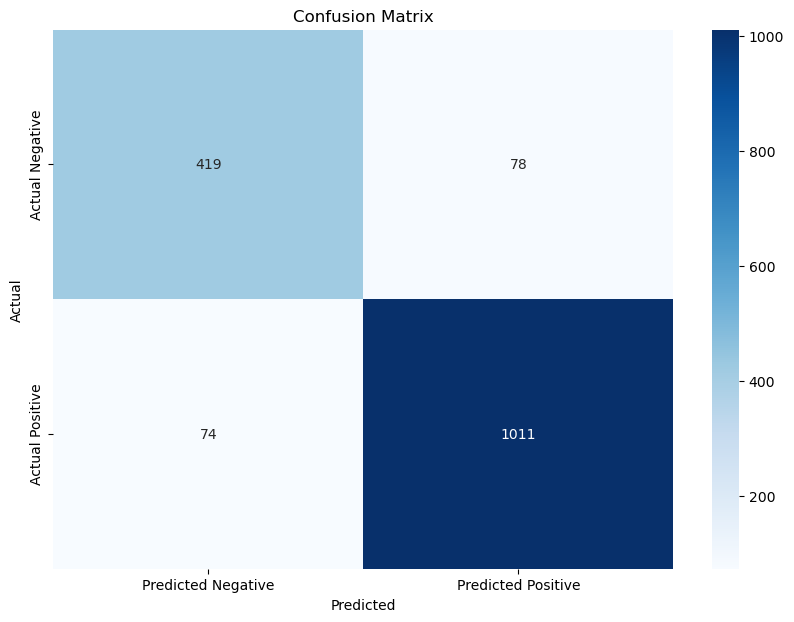

In [ ]:
cm = confusion_matrix(Y_binary_test, predictions)

# Extract true positives, false positives, true negatives, and false negatives
tn, fp, fn, tp = cm.ravel()
print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")

# Plot the confusion matrix with labels
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Create a mapping for the class labels
label_mapping = {
    'Adenosis': 0,
    'Fibroadenoma': 1,
    'Phyllodes Tumor': 2,
    'Tubular Adenoma': 3,
    'Ductal Carcinoma': 4,
    'Lobular Carcinoma': 5,
    'Mucinous Carcinoma': 6,
    'Papillary Carcinoma': 7
}

# Convert the string labels to integers
Y_multiclass_test_numeric = np.array([label_mapping[label] for label in Y_multiclass_test])
incorrect_indices = np.where(Y_binary_test != predictions)[0] # Get indices of incorrect predictions

In [10]:
Counter(Y_multiclass_test[incorrect_indices])

Counter({'Fibroadenoma': 24,
         'Ductal Carcinoma': 23,
         'Tubular Adenoma': 22,
         'Mucinous Carcinoma': 21,
         'Adenosis': 17,
         'Phyllodes Tumor': 15,
         'Papillary Carcinoma': 8,
         'Lobular Carcinoma': 1})

In [19]:
false_positives = incorrect_indices[(Y_binary_test[incorrect_indices] == 0) & (predictions[incorrect_indices] == 1)]
false_negatives = incorrect_indices[(Y_binary_test[incorrect_indices] == 1) & (predictions[incorrect_indices] == 0)]
incorrect_multiclass_counts_fp = np.bincount(Y_multiclass_test_numeric[false_positives])
incorrect_multiclass_counts_fn = np.bincount(Y_multiclass_test_numeric[false_negatives])

# FP per class
print("Count of incorrect predictions per class (False Positives):")
for cls, count in enumerate(incorrect_multiclass_counts_fp):
    print(f"Class {cls}: {count} incorrect predictions (FP)")

# FN per class
print("Count of incorrect predictions per class (False Negatives):")
for cls, count in enumerate(incorrect_multiclass_counts_fn):
    print(f"Class {cls}: {count} incorrect predictions (FN)")

Count of incorrect predictions per class (False Positives):
Class 0: 17 incorrect predictions (FP)
Class 1: 24 incorrect predictions (FP)
Class 2: 15 incorrect predictions (FP)
Class 3: 22 incorrect predictions (FP)
Count of incorrect predictions per class (False Negatives):
Class 0: 0 incorrect predictions (FN)
Class 1: 0 incorrect predictions (FN)
Class 2: 0 incorrect predictions (FN)
Class 3: 0 incorrect predictions (FN)
Class 4: 23 incorrect predictions (FN)
Class 5: 1 incorrect predictions (FN)
Class 6: 21 incorrect predictions (FN)
Class 7: 8 incorrect predictions (FN)


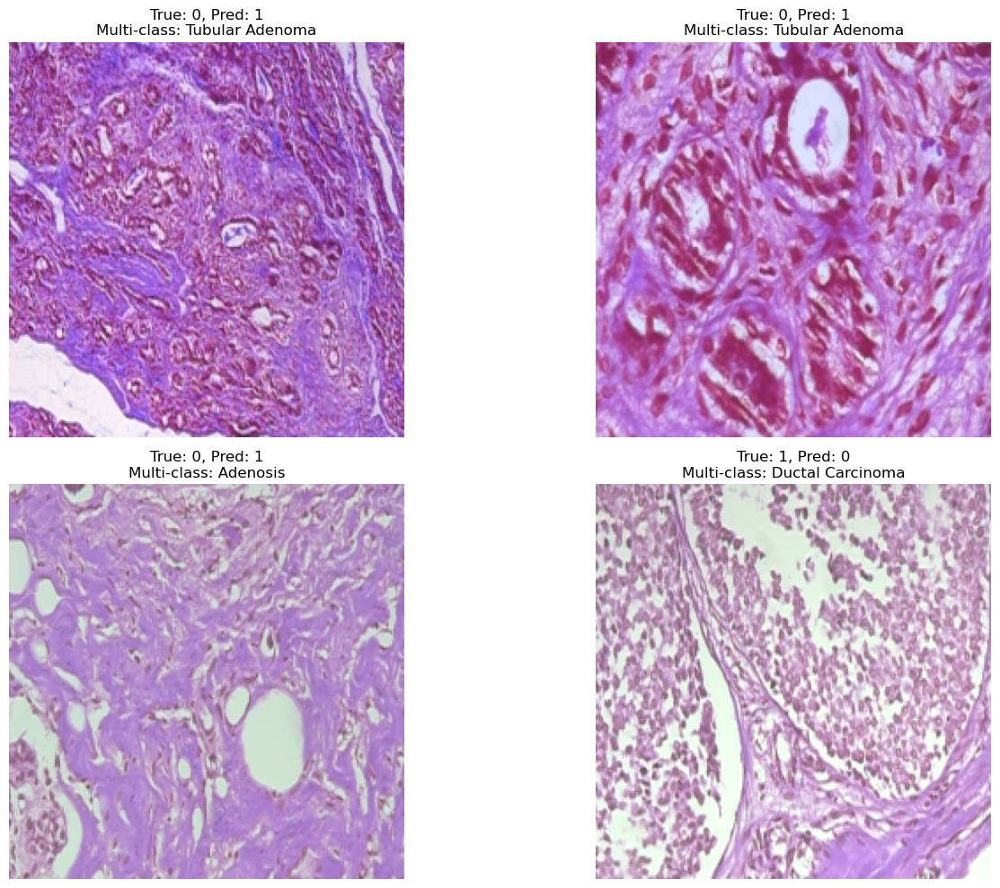

In [ ]:
X_test = X_test.astype(np.float32)

# Visualize some of the incorrect predictions and check multi-class labels
num_to_display = 4  
plt.figure(figsize=(15, 10))

for i, idx in enumerate(incorrect_indices[:num_to_display]):
    plt.subplot(2, 2, i + 1)
    plt.imshow(X_test[idx])
    plt.title(f"True: {Y_binary_test[idx]}, Pred: {predictions[idx]}\nMulti-class: {Y_multiclass_test[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


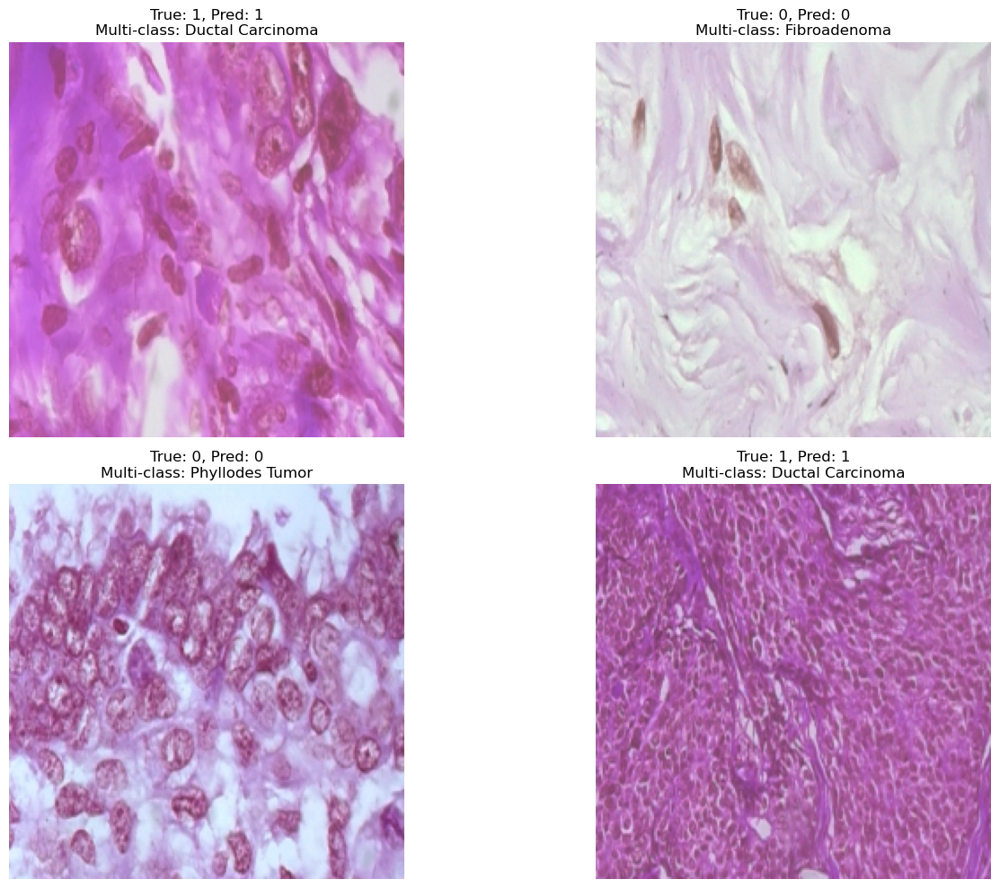

In [ ]:
correct_indices = np.where(Y_binary_test == predictions)[0]
X_test = X_test.astype(np.float32)

# Visualize some of the correct predictions and check multi-class labels
num_to_display = 4  
plt.figure(figsize=(15, 10))

for i, idx in enumerate(correct_indices[:num_to_display]):
    plt.subplot(2, 2, i + 1)
    plt.imshow(X_test[idx])
    plt.title(f"True: {Y_binary_test[idx]}, Pred: {predictions[idx]}\nMulti-class: {Y_multiclass_test[idx]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

After analyzing the model's performance, we observed that it struggled to predict a few samples in each class. However, we confirmed that the model handles all cancer classes fairly well, without bias toward any specific class. Since the model performs consistently across classes, identifying areas for improvement is more challenging than if it had struggled significantly with one class.

To gain further insights, we attempted to visualize correct and incorrect predictions. However, without medical expertise, we couldn't identify patterns such as color variations or regions requiring zooming. 

#### 3.2.4.2. 2nd Approach

This approach aims to try a more sophisticated architeture, by doing some changes on the kernel sizes of the Convolutional layers, on the pooling size of the Pooling layers and on the number of layers and neurons in the fully connected layers. It is also introduced a Dropout layer to prevent the overfitting.

In [4]:
model = Sequential()
model.add(Conv2D(32, kernel_size=5, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((5, 5)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((4, 4)))
model.add(Conv2D(128, kernel_size=2, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(256, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [5]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Recall(), Precision()])

model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping, model_checkpoint]

In [6]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.4838 - precision: 0.7981 - recall: 0.8896
Epoch 1: val_loss improved from inf to 0.58919, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 226s 2s/step - loss: 0.4833 - precision: 0.7984 - recall: 0.8897 - val_loss: 0.5892 - val_precision: 0.6824 - val_recall: 1.0000
Epoch 2/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.3479 - precision: 0.8700 - recall: 0.9169
Epoch 2: val_loss improved from 0.58919 to 0.46459, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 208s 2s/step - loss: 0.3477 - precision: 0.8700 - recall: 0.9170 - val_loss: 0.4646 - val_precision: 0.7621 - val_recall: 0.9882
Epoch 3/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.2996 - precision: 0.9000 - recall: 0.8965
Epoch 3: val_loss improved from 0.46459 to 0.38386, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 207s 2s/step - loss: 0.2996 - precision: 0.9000 - recall: 0.8966 - val_

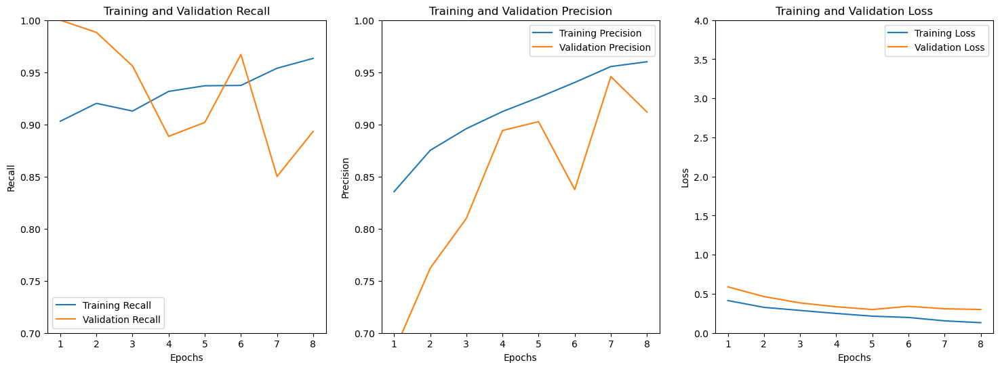

In [7]:
plot_training_history(history.history)

Immediately it was noticeable that this model would not outperform the 1st approach in terms of scores so it was not further evaluated.

#### 3.2.4.3. Implementing Data Augmentation

In order to present to the model more variation of images it may encounter on the validation and test sets, it is crucial to implement data augmentation techniques. <br>
Based on the images plotted [here](#predictions-evaluation) it was perceptible that without medical expertise, we couldn't identify patterns such as color variations or regions requiring zooming. Therefore, implementing data augmentation or image transformations would rely on practical experimentation rather than domain knowledge. 

Given our strong baseline model and limited computational resources, we will focus on simple data augmentation techniques. Unfortunately, we won't experiment with diferent sets of transformations, and will try mantain little distortion but still add variation, due to these constraints.

##### 3.2.4.3.1. Image Data Generator

As a trial to improve the score of the model we augmented the dataset of images, while trying to balance the target classes.

In [21]:
Counter(Y_train)

Counter({1: 2970, 0: 1388})

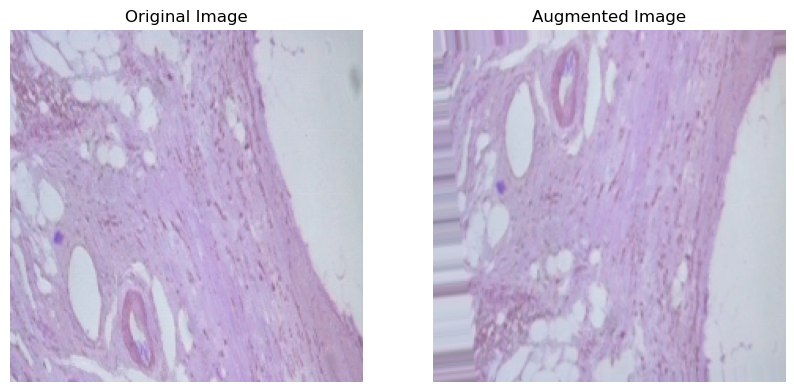

In [ ]:
original_image = X_train[4].astype('float32')

# Reshape the image for the data generator (batch size of 1)
image_array = original_image.reshape((1,) + original_image.shape)

datagen = ImageDataGenerator(
    rotation_range=10,
    horizontal_flip=True,
    vertical_flip=True,
    height_shift_range=0.1,
    zoom_range=0.1,
    fill_mode='nearest',)

# Generate one augmented image
aug_iter = datagen.flow(image_array, batch_size=1)
augmented_image = next(aug_iter)[0]

# Plot original and augmented images
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_image)
plt.axis('off')

# Augmented image
plt.subplot(1, 2, 2)
plt.title('Augmented Image')
plt.imshow(augmented_image)
plt.axis('off')

plt.show()

As distortion is a very important issue for medical images we didn't want to add augmented images with much distortion so we tried with some hyperparamenters and got this result, subtle changes and minimal distortion.

In [ ]:
# Identify the minority and majority classes

minority_class = 0
majority_class = 1
num_majority_class = Counter[1]
num_minority_class = Counter[0]

# Separate the minority class samples
minority_class_indices = np.where(Y_binary_train == minority_class)[0] #select only indices
X_minority = X_train_full[minority_class_indices]
Y_minority = Y_binary_train[minority_class_indices]

# Data augmentation
datagen = ImageDataGenerator(
        rotation_range=10,       
        horizontal_flip=True,
        vertical_flip=True,
        height_shift_range=0.1,      
        zoom_range=0.1,
        fill_mode='nearest')

In [ ]:
# Generate augmented data until the minority class matches the majority class
augmented_images = []
augmented_labels = []

while len(augmented_images) + len(X_minority) < num_majority_class: # until minority class is smaller
    for i in range(len(X_minority)):
        img = X_minority[i].reshape((1,) + X_minority[i].shape)  # Reshape to (1, height, width, channels)
        aug_iter = datagen.flow(img, batch_size=1)               # Generate augmented images
        aug_img = next(aug_iter)[0].astype(np.uint8)             # Get the augmented image
        augmented_images.append(aug_img)
        augmented_labels.append(minority_class)
        if len(augmented_images) + len(X_minority) >= num_majority_class:  # Break if we have enough samples
            break

# Convert lists to numpy arrays
augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

# Combine original and augmented data
X_train_balanced = np.concatenate((X_train_full, augmented_images), axis=0)
Y_binary_train_balanced = np.concatenate((Y_binary_train, augmented_labels), axis=0)

# shuffle observations
indices = np.arange(X_train_balanced.shape[0])
np.random.shuffle(indices)
X_train_balanced = X_train_balanced[indices]
Y_binary_train_balanced = Y_binary_train_balanced[indices]

In [ ]:
Counter(Y_binary_train_balanced)

Training the Model

In [ ]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Recall(), Precision()])

reduce_lr = ReduceLROnPlateau(monitor='val_precision', factor=0.1, patience=2, mode='max', verbose=1)
model_checkpoint = ModelCheckpoint('best_model_by_precision.keras', monitor='val_precision',save_best_only=True, mode='max', verbose=1)
early_stopping = EarlyStopping(monitor='val_precision', patience=4, mode='max', verbose=1)

callbacks = [early_stopping, reduce_lr, model_checkpoint]

In [ ]:
history = model.fit(X_train_balanced, Y_binary_train_balanced, validation_data=(X_val, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.7851 - precision: 0.7810 - recall: 0.8184
Epoch 1: val_precision improved from -inf to 0.68845, saving model to best_model_by_precision.keras
179/179 ━━━━━━━━━━━━━━━━━━━━ 305s 2s/step - loss: 0.7842 - precision: 0.7811 - recall: 0.8185 - val_loss: 1.0855 - val_precision: 0.6885 - val_recall: 1.0000 - learning_rate: 1.0000e-04
Epoch 2/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.4005 - precision: 0.8366 - recall: 0.8831
Epoch 2: val_precision improved from 0.68845 to 0.72028, saving model to best_model_by_precision.keras
179/179 ━━━━━━━━━━━━━━━━━━━━ 292s 2s/step - loss: 0.4005 - precision: 0.8366 - recall: 0.8831 - val_loss: 0.8006 - val_precision: 0.7203 - val_recall: 0.9967 - learning_rate: 1.0000e-04
Epoch 3/25
179/179 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.2994 - precision: 0.8588 - recall: 0.8916
Epoch 3: val_precision improved from 0.72028 to 0.75905, saving model to best_model_by_precision.keras
179/179 ━━━━━

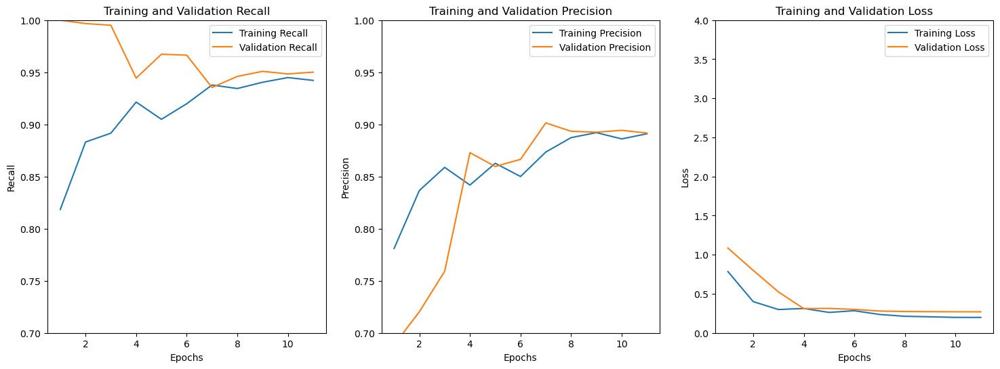

In [92]:
plot_training_history(history)

In [ ]:
predictions = (model.predict(X_test) > 0.5).astype(int).flatten()
print(f1_score(Y_binary_test, predictions))

62/62 ━━━━━━━━━━━━━━━━━━━━ 13s 209ms/step
0.9139167862266858


Simply using data augmentation does not guarantee an improvement in performance. When comparing results with and without augmentation, the rapid increase in precision and recall were observed after not applying the augmentation techniques and got better final results, showing that in this case it doesn't help. We could try to add more images or epochs on the fly, but as we already have a model with >0.9 F1 Score, precision and recall, we will try a diferent approach next.

##### 3.2.4.3.2. Synthetic Minority Over-sampling TEchnique

SMOTE is a data augmentation technique used to address class imbalance in datasets. It works by generating synthetic samples for the minority class rather than simply duplicating existing data. This is done by interpolating between existing minority class samples to create new, realistic data points. <br>
When applied to raw image data, SMOTE works in a different manner compared to the ImageDataGenerator. While ImageDataGenerator creates augmented images by applying transformations like rotations, flips, or scaling, SMOTE generates entirely new images by interpolating pixel values between existing minority class samples.<br>
https://github.com/SoumyadeepB/Machine-Learning/blob/master/Model%20Improvement%20Techniques/SMOTE%20for%20Imbalanced%20Datasets.ipynb

In [ ]:
n_samples, height, width, channels = X_train.shape

# Reshape X_train to 2D for SMOTE
X_train_reshaped = X_train.reshape((n_samples, height * width * channels))

# Apply SMOTE to generate synthetic samples
smote = SMOTE()
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_reshaped, Y_train)

# Reshape X_train_resampled back to 4D
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], height, width, channels))

In [8]:
num_samples_before = n_samples
num_samples_after = X_train_resampled.shape[0]
num_added_samples = num_samples_after - num_samples_before

print(f"Number of samples before SMOTE: {num_samples_before}")
print(f"Number of samples after SMOTE: {num_samples_after}")
print(f"Number of added samples: {num_added_samples}")

Number of samples before SMOTE: 4358
Number of samples after SMOTE: 5940
Number of added samples: 1582


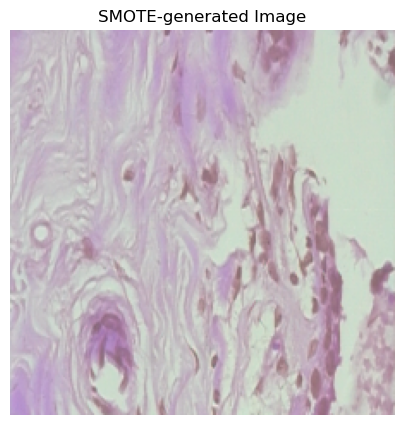

In [ ]:
# Ensure the synthetic image is in a compatible data type (float32)
synthetic_sample_index = num_samples_before -5
synthetic_image = X_train_resampled[synthetic_sample_index].astype(np.float32)

# Display the synthetic image
plt.figure(figsize=(5, 5))
plt.title('SMOTE-generated Image')
plt.imshow(synthetic_image)
plt.axis('off')
plt.show()

In [ ]:
#Shuffle the resampled data
X_train_resampled, y_train_resampled = shuffle(
    X_train_resampled,
    y_train_resampled,
    random_state=42)

In [ ]:
# Count the number of observations for each class
class_counts_balanced = np.bincount(y_train_resampled)


for cls, count in enumerate(class_counts_balanced):
    print(f"Class {cls}: {count} observations")

Class 0: 2970 observations
Class 1: 2970 observations


Training the model

In [10]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Recall(), Precision()])


model_checkpoint = ModelCheckpoint('best_model_by_precision.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping, model_checkpoint]

In [12]:
history = model.fit(X_train_resampled, y_train_resampled ,validation_data=(X_val, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.9107 - precision: 0.7465 - recall: 0.7496
Epoch 1: val_loss improved from inf to 0.48421, saving model to best_model_by_precision.keras
186/186 ━━━━━━━━━━━━━━━━━━━━ 661s 3s/step - loss: 0.9100 - precision: 0.7466 - recall: 0.7497 - val_loss: 0.4842 - val_precision: 0.8625 - val_recall: 0.8320
Epoch 2/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.4930 - precision: 0.8029 - recall: 0.8096
Epoch 2: val_loss improved from 0.48421 to 0.37272, saving model to best_model_by_precision.keras
186/186 ━━━━━━━━━━━━━━━━━━━━ 341s 2s/step - loss: 0.4929 - precision: 0.8029 - recall: 0.8097 - val_loss: 0.3727 - val_precision: 0.8408 - val_recall: 0.9246
Epoch 3/25
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.3584 - precision: 0.8493 - recall: 0.8543
Epoch 3: val_loss improved from 0.37272 to 0.34553, saving model to best_model_by_precision.keras
186/186 ━━━━━━━━━━━━━━━━━━━━ 356s 2s/step - loss: 0.3583 - precision: 0.8493 - recall

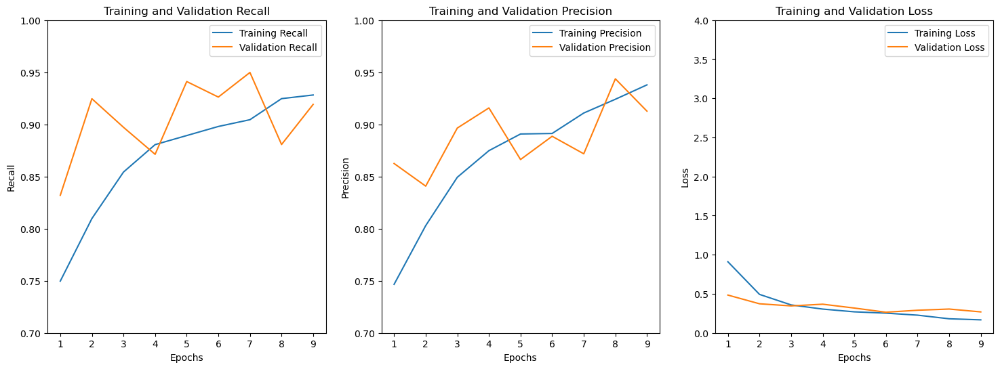

In [88]:
plot_training_history(history)

In [13]:
calculate_f1_score(0.9290, 0.9366)

0.9327845197255574

In [14]:
calculate_f1_score(0.9199, 0.9333)

0.926551554068638

In [14]:
predictions = (model.predict(X_test) > 0.5).astype(int).flatten()
print(f1_score(Y_binary_test, predictions))

49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 201ms/step
0.9212233549582948


In [ ]:
#model.compile(loss=None)
#EXPORT_PATH = 'final_binary_with_Smote.keras'
#model.save(EXPORT_PATH)

In [10]:
load = load_model('Best models\\final_binary_with_Smote.keras')
predictions = (load.predict(X_test) > 0.5).astype(int).flatten()
print(classification_report(Y_binary_test, predictions))

49/49 ━━━━━━━━━━━━━━━━━━━━ 11s 216ms/step
              precision    recall  f1-score   support

           0       0.94      0.77      0.85       497
           1       0.90      0.98      0.94      1060

    accuracy                           0.91      1557
   macro avg       0.92      0.88      0.89      1557
weighted avg       0.91      0.91      0.91      1557



loss: 0.1634 - precision: 0.9290 - recall: 0.9366 - <br>val_loss: 0.2608 - val_precision: 0.9199 - val_recall: 0.9333

Compared to other approaches, using Smote resulted on a better score, and very consistent results on the training set. But still lower scores than [this](#scores-evaluation) approach.

#### 3.2.4.4. Transfer Learning

Transfer Learning was also tested to compare its results with the best model achieved so far. As the DenseNet121 was already pre-trained on a large-scale dataset it could leverage learned features do classify more easily the images in the dataset. This model will be fine-tuned with 12 unfreezed layers.

In [ ]:
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers[:-12]:  # Freeze all layers except the last 12
    layer.trainable = False

for layer in base_model.layers[-12:]:  # Train the last 12 layers
    layer.trainable = True

x = Flatten()(base_model.output)  
x = Dense(1024, activation='relu')(x) 
x = Dropout(0.5)(x)  
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)   
output = Dense(1, activation='sigmoid')(x)  

model = Model(inputs=base_model.input, outputs=output)

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=[Recall(), Precision()])


model_checkpoint = ModelCheckpoint('best_model_by_precision.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping, model_checkpoint]

In [7]:
history = model.fit(X_train, Y_train ,validation_data=(X_val, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.2687 - precision: 0.7533 - recall: 0.7743
Epoch 1: val_loss improved from inf to 0.36571, saving model to best_model_by_precision.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 589s 4s/step - loss: 1.2668 - precision: 0.7535 - recall: 0.7745 - val_loss: 0.3657 - val_precision: 0.9029 - val_recall: 0.8689
Epoch 2/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.4198 - precision: 0.8723 - recall: 0.8919
Epoch 2: val_loss improved from 0.36571 to 0.32442, saving model to best_model_by_precision.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 545s 4s/step - loss: 0.4195 - precision: 0.8723 - recall: 0.8920 - val_loss: 0.3244 - val_precision: 0.9051 - val_recall: 0.8838
Epoch 3/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 0.2861 - precision: 0.9011 - recall: 0.9113
Epoch 3: val_loss improved from 0.32442 to 0.28680, saving model to best_model_by_precision.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 459s 3s/step - loss: 0.2860 - precision: 0.9011 - recall

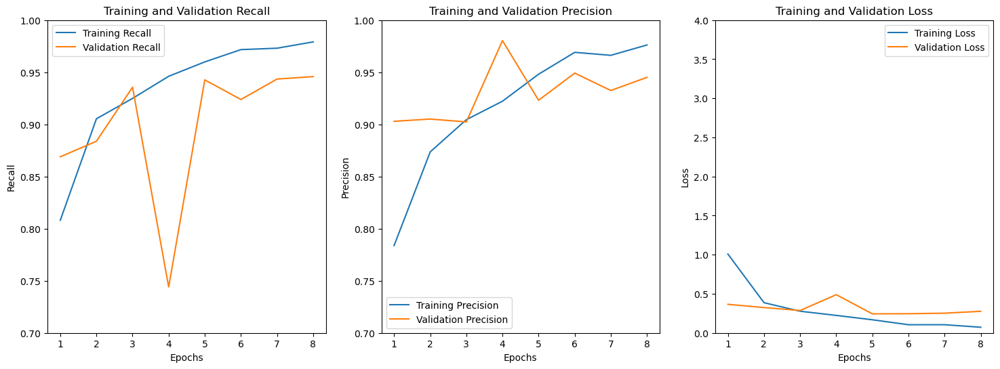

In [10]:
plot_training_history(history.history)

loss: 0.2005 - precision: 0.9478 - recall: 0.9352 - <br>val_loss: 0.2438 - val_precision: 0.9231 - val_recall: 0.9427

In [11]:
predictions = (model.predict(X_test) > 0.5).astype(int).flatten()
print(f1_score(Y_binary_test, predictions))

49/49 ━━━━━━━━━━━━━━━━━━━━ 116s 2s/step
0.9443665264142123


Even though this approach achieved pretty competitive results, with actually slightly outperforming the best model so far in some metrics, it is way more computational expensive. The difference in the metrics is not enough justification to lead us to choose this as our final model. The chosen final model is [this](#training).

# 4. Multiclass Problem

For this problem, the macro avg f1 score will be used as the evaluation metric so all classes are treated equally, while having in consideration we are dealing with an imbalanced problem. <br>
Unfortunately, Keras does not natively support macro F1 or other macro-based metrics (which in our view are the most appropriate), so we need to compute them separately after training. This creates a challenge in optimizing our models, as we can only evaluate the macro F1 score for the final model, not for individual epochs during training.

**Note**: When we fit models a second time after plotting the results for a differente number of epochs, the kernel was restarted in order to reset the weights of the model, while we keep printed the previous trials.

## 4.1. First Image Exploration and Tests

### 4.1.1. Image Resizing vs Image Resizing with Padding

#### Image Resizing without Padding

##### 224x224

In [3]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)

In [4]:
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [5]:
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_full, Y_multiclass_train, test_size=0.3, random_state=42, stratify=Y_multiclass_train, shuffle=True)

In [6]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [7]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [8]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1)

Epoch 1/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 99s 1s/step - loss: 3.8376 - precision: 0.4522 - recall: 0.1694 - val_loss: 1.5920 - val_precision: 0.7211 - val_recall: 0.2103
Epoch 2/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - loss: 1.5401 - precision: 0.6610 - recall: 0.2745 - val_loss: 1.5115 - val_precision: 0.7107 - val_recall: 0.2247
Epoch 3/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - loss: 1.4823 - precision: 0.6441 - recall: 0.2814 - val_loss: 1.5988 - val_precision: 0.5696 - val_recall: 0.4157
Epoch 4/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - loss: 1.4623 - precision: 0.6264 - recall: 0.3171 - val_loss: 1.3553 - val_precision: 0.6752 - val_recall: 0.3248
Epoch 5/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - loss: 1.3632 - precision: 0.6694 - recall: 0.3164 - val_loss: 1.3521 - val_precision: 0.6449 - val_recall: 0.3692
Epoch 6/15
69/69 ━━━━━━━━━━━━━━━━━━━━ 68s 964ms/step - loss: 1.2856 - precision: 0.6799 - recall: 0.3747 - val_loss: 1.3862 - val_precision: 0.6755 - val_recall: 0.3264
E

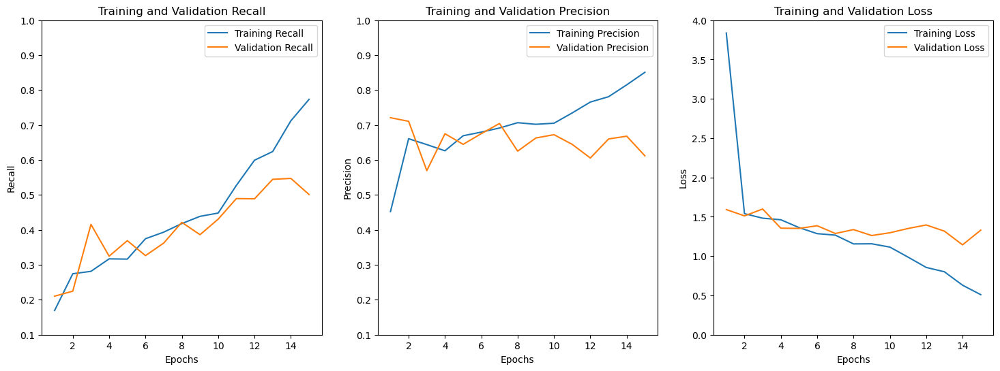

In [99]:
plot_training_history(history, y_min=0.1)

In [8]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=10, batch_size=64, verbose=1)

Epoch 1/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 105s 1s/step - loss: 3.1397 - precision: 0.4732 - recall: 0.1888 - val_loss: 1.5763 - val_precision: 0.5993 - val_recall: 0.3569
Epoch 2/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - loss: 1.6159 - precision: 0.6467 - recall: 0.2246 - val_loss: 1.5269 - val_precision: 0.6026 - val_recall: 0.3740
Epoch 3/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - loss: 1.4968 - precision: 0.6202 - recall: 0.2943 - val_loss: 1.4060 - val_precision: 0.6964 - val_recall: 0.2921
Epoch 4/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - loss: 1.4242 - precision: 0.6497 - recall: 0.2917 - val_loss: 1.5580 - val_precision: 0.7780 - val_recall: 0.1969
Epoch 5/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 69s 994ms/step - loss: 1.4382 - precision: 0.6981 - recall: 0.2746 - val_loss: 1.4317 - val_precision: 0.6368 - val_recall: 0.3884
Epoch 6/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - loss: 1.3766 - precision: 0.6822 - recall: 0.3381 - val_loss: 1.3170 - val_precision: 0.6481 - val_recall: 0.4040


In [9]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step
              precision    recall  f1-score   support

           0       0.25      0.68      0.37       107
           1       0.68      0.95      0.80       821
           2       0.44      0.36      0.40       243
           3       0.81      0.20      0.31       128
           4       0.40      0.25      0.31       190
           5       0.47      0.14      0.22       134
           6       0.17      0.01      0.02       109
           7       0.54      0.15      0.23       137

    accuracy                           0.57      1869
   macro avg       0.47      0.34      0.33      1869
weighted avg       0.55      0.57      0.51      1869



F1 Macro Avg: 0.33

##### 128x128

In [3]:
image_data = pd.read_csv('images/image_data.csv')
X_train=[]
X_test=[]
Y_binary_train=[]
Y_binary_test=[]
Y_multiclass_train=[]
Y_multiclass_test=[]

In [4]:
for i in tqdm(image_data[image_data['train_test']=='train'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (128,128))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_train.append(np.array(img))  
    Y_binary_train.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_train.append(label2)  

for i in tqdm(image_data[image_data['train_test']=='test'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (128,128))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_test.append(np.array(img))  
    Y_binary_test.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_test.append(label2)  

100%|██████████| 1978/1978 [00:17<00:00, 113.87it/s]


In [5]:
X_train = np.asarray(X_train, dtype='float16') / 255
X_test = np.asarray(X_test, dtype='float16') / 255
Y_binary_train = np.asarray(Y_binary_train)
Y_binary_test = np.asarray(Y_binary_test)
Y_multiclass_train = np.asarray(Y_multiclass_train)
Y_multiclass_test = np.asarray(Y_multiclass_test)

In [6]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [7]:
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train, Y_multiclass_train, test_size=0.3, random_state=42, stratify=Y_multiclass_train, shuffle=True)

In [8]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [95]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1)

Epoch 1/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 29s 370ms/step - loss: 2.4426 - precision: 0.5485 - recall: 0.1858 - val_loss: 1.5802 - val_precision: 0.6468 - val_recall: 0.2562
Epoch 2/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 20s 312ms/step - loss: 1.5445 - precision: 0.6569 - recall: 0.2479 - val_loss: 1.4359 - val_precision: 0.7048 - val_recall: 0.2562
Epoch 3/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 21s 315ms/step - loss: 1.4462 - precision: 0.6492 - recall: 0.2599 - val_loss: 1.4716 - val_precision: 0.8085 - val_recall: 0.1494
Epoch 4/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 21s 317ms/step - loss: 1.4576 - precision: 0.6488 - recall: 0.2328 - val_loss: 1.3062 - val_precision: 0.6965 - val_recall: 0.3584
Epoch 5/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 23s 348ms/step - loss: 1.3286 - precision: 0.6706 - recall: 0.3269 - val_loss: 1.2704 - val_precision: 0.7282 - val_recall: 0.3236
Epoch 6/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 20s 300ms/step - loss: 1.2937 - precision: 0.6778 - recall: 0.3435 - val_loss: 1.2419 - val_precision: 0.7005 - val_r

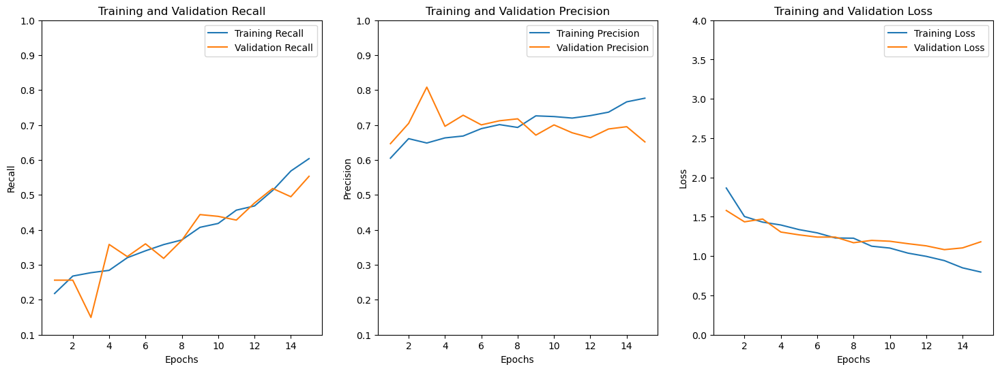

In [96]:
plot_training_history(history.history, y_min=0.1)

In [9]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=8, batch_size=64, verbose=1)

Epoch 1/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 25s 332ms/step - loss: 2.4439 - precision: 0.4845 - recall: 0.1810 - val_loss: 1.5592 - val_precision: 0.6224 - val_recall: 0.3056
Epoch 2/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 20s 307ms/step - loss: 1.5274 - precision: 0.6575 - recall: 0.2579 - val_loss: 1.4573 - val_precision: 0.7546 - val_recall: 0.2090
Epoch 3/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 20s 309ms/step - loss: 1.4404 - precision: 0.6616 - recall: 0.2481 - val_loss: 1.3478 - val_precision: 0.7194 - val_recall: 0.2506
Epoch 4/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 20s 308ms/step - loss: 1.4324 - precision: 0.6670 - recall: 0.2628 - val_loss: 1.3588 - val_precision: 0.7647 - val_recall: 0.2118
Epoch 5/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 21s 320ms/step - loss: 1.3792 - precision: 0.6708 - recall: 0.2521 - val_loss: 1.3324 - val_precision: 0.7228 - val_recall: 0.2315
Epoch 6/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 21s 330ms/step - loss: 1.3581 - precision: 0.7081 - recall: 0.2851 - val_loss: 1.3173 - val_precision: 0.6624 - val_recall:

In [10]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step
              precision    recall  f1-score   support

           0       0.53      0.16      0.25       100
           1       0.59      0.94      0.72       777
           2       0.39      0.66      0.49       228
           3       0.79      0.21      0.34       141
           4       0.00      0.00      0.00       178
           5       0.00      0.00      0.00       126
           6       1.00      0.01      0.02       102
           7       0.51      0.31      0.39       128

    accuracy                           0.54      1780
   macro avg       0.48      0.29      0.28      1780
weighted avg       0.49      0.54      0.45      1780



F1 Macro Avg: 0.28

#### Image Resizing with Padding

In [2]:
image_data = pd.read_csv('images/image_data.csv')
X_train=[]
X_test=[]
Y_binary_train=[]
Y_binary_test=[]
Y_multiclass_train=[]
Y_multiclass_test=[]

##### 224x224

In [3]:
# Processing training images
for i in tqdm(image_data[image_data['train_test']=='train'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = resize_and_pad_pil(img, target_size=(224, 224))  # Resize and pad
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_train.append(np.array(img))  
    Y_binary_train.append(1 if label1 == 'Malignant' else 0) 
    Y_multiclass_train.append(label2)  

# Processing testing images
for i in tqdm(image_data[image_data['train_test']=='test'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = resize_and_pad_pil(img, target_size=(224, 224))  # Resize and pad
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_test.append(np.array(img))  
    Y_binary_test.append(1 if label1 == 'Malignant' else 0) 
    Y_multiclass_test.append(label2)  

100%|██████████| 1978/1978 [00:24<00:00, 81.48it/s]


In [4]:
X_train = np.asarray(X_train, dtype='float16') / 255
X_test = np.asarray(X_test, dtype='float16') / 255
Y_binary_train = np.asarray(Y_binary_train)
Y_binary_test = np.asarray(Y_binary_test)
Y_multiclass_train = np.asarray(Y_multiclass_train)
Y_multiclass_test = np.asarray(Y_multiclass_test)

In [5]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [6]:
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train, Y_multiclass_train, test_size=0.3, random_state=42, stratify=Y_multiclass_train, shuffle=True)

In [7]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [8]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [ ]:

history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1)

Epoch 1/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - loss: 3.3289 - precision: 0.4378 - recall: 0.1625 - val_loss: 1.4712 - val_precision: 0.6550 - val_recall: 0.2944
Epoch 2/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - loss: 1.4981 - precision: 0.6663 - recall: 0.2759 - val_loss: 1.3327 - val_precision: 0.7073 - val_recall: 0.3067
Epoch 3/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - loss: 1.4197 - precision: 0.6882 - recall: 0.2863 - val_loss: 1.3884 - val_precision: 0.8672 - val_recall: 0.1320
Epoch 4/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - loss: 1.3290 - precision: 0.6977 - recall: 0.2955 - val_loss: 1.2771 - val_precision: 0.7116 - val_recall: 0.3354
Epoch 5/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step - loss: 1.2779 - precision: 0.7140 - recall: 0.3286 - val_loss: 1.2756 - val_precision: 0.7780 - val_recall: 0.2657
Epoch 6/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step - loss: 1.2396 - precision: 0.7167 - recall: 0.3430 - val_loss: 1.3486 - val_precision: 0.6270 - val_recall: 0.2843
Ep

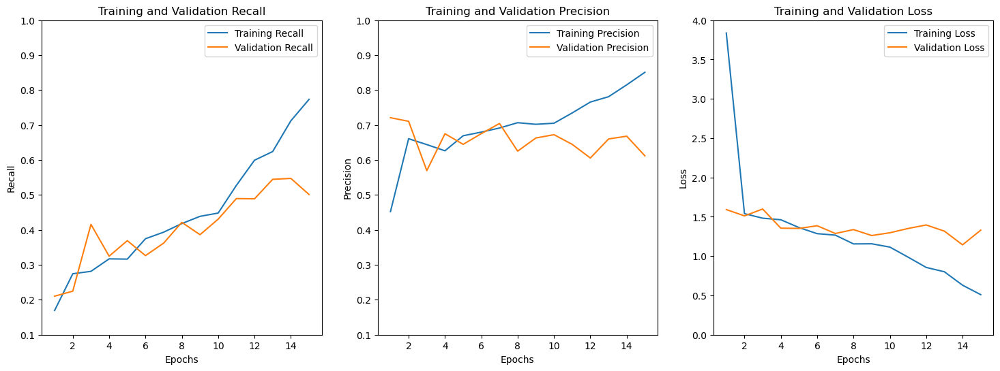

In [100]:
plot_training_history(history, y_min=0.1)

In [9]:

history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=8, batch_size=64, verbose=1)

Epoch 1/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 88s 1s/step - loss: 3.4859 - precision: 0.4759 - recall: 0.1666 - val_loss: 1.5273 - val_precision: 0.6605 - val_recall: 0.2787
Epoch 2/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - loss: 1.5243 - precision: 0.6534 - recall: 0.2731 - val_loss: 1.4895 - val_precision: 0.6833 - val_recall: 0.2691
Epoch 3/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - loss: 1.4776 - precision: 0.6598 - recall: 0.2899 - val_loss: 1.3807 - val_precision: 0.6231 - val_recall: 0.3697
Epoch 4/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - loss: 1.4326 - precision: 0.6680 - recall: 0.3175 - val_loss: 1.3365 - val_precision: 0.6988 - val_recall: 0.3051
Epoch 5/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - loss: 1.3748 - precision: 0.6701 - recall: 0.3164 - val_loss: 1.3267 - val_precision: 0.6941 - val_recall: 0.3506
Epoch 6/8
65/65 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - loss: 1.3338 - precision: 0.6951 - recall: 0.3210 - val_loss: 1.3683 - val_precision: 0.6511 - val_recall: 0.4079
Epoch 7/8


In [10]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

56/56 ━━━━━━━━━━━━━━━━━━━━ 7s 119ms/step
              precision    recall  f1-score   support

           0       0.48      0.20      0.28       100
           1       0.54      0.97      0.69       777
           2       0.45      0.35      0.39       228
           3       0.59      0.32      0.41       141
           4       0.14      0.01      0.01       178
           5       0.84      0.13      0.22       126
           6       0.24      0.10      0.14       102
           7       0.71      0.09      0.17       128

    accuracy                           0.53      1780
   macro avg       0.50      0.27      0.29      1780
weighted avg       0.50      0.53      0.44      1780



F1 Macro Avg: 0.29

##### 128x128

In [ ]:
# Processing training images
for i in tqdm(image_data[image_data['train_test']=='train'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = resize_and_pad_pil(img, target_size=(128, 128))  # Resize and pad
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_train.append(np.array(img))  
    Y_binary_train.append(1 if label1 == 'Malignant' else 0) 
    Y_multiclass_train.append(label2)  

# Processing testing images
for i in tqdm(image_data[image_data['train_test']=='test'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = resize_and_pad_pil(img, target_size=(128, 128))  # Resize and pad
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    X_test.append(np.array(img))  
    Y_binary_test.append(1 if label1 == 'Malignant' else 0) 
    Y_multiclass_test.append(label2)  

100%|██████████| 1978/1978 [00:16<00:00, 117.59it/s]


In [5]:
X_train = np.asarray(X_train, dtype='float16') / 255
X_test = np.asarray(X_test, dtype='float16') / 255
Y_binary_train = np.asarray(Y_binary_train)
Y_binary_test = np.asarray(Y_binary_test)
Y_multiclass_train = np.asarray(Y_multiclass_train)
Y_multiclass_test = np.asarray(Y_multiclass_test)

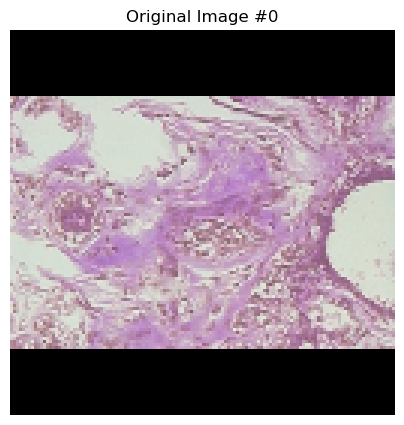

In [ ]:
index = 0  
image = X_train[index]
image = image.astype(np.float32)


plt.figure(figsize=(5, 5))
plt.title(f'Original Image #{index}')
plt.imshow(image)
plt.axis('off')
plt.show()

In [7]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [8]:
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train, Y_multiclass_train, test_size=0.3, random_state=42, stratify=Y_multiclass_train, shuffle=True)

In [9]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [10]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [11]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=64, verbose=1)

Epoch 1/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 39s 526ms/step - loss: 2.2447 - precision: 0.5262 - recall: 0.1599 - val_loss: 1.5170 - val_precision: 0.5933 - val_recall: 0.3303
Epoch 2/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 24s 374ms/step - loss: 1.5308 - precision: 0.6279 - recall: 0.2712 - val_loss: 1.4362 - val_precision: 0.7627 - val_recall: 0.2022
Epoch 3/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 344ms/step - loss: 1.4316 - precision: 0.6560 - recall: 0.2569 - val_loss: 1.4099 - val_precision: 0.6701 - val_recall: 0.2899
Epoch 4/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 337ms/step - loss: 1.3924 - precision: 0.6859 - recall: 0.3019 - val_loss: 1.2931 - val_precision: 0.7326 - val_recall: 0.3309
Epoch 5/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 22s 334ms/step - loss: 1.3024 - precision: 0.7139 - recall: 0.3534 - val_loss: 1.3486 - val_precision: 0.7218 - val_recall: 0.3163
Epoch 6/15
65/65 ━━━━━━━━━━━━━━━━━━━━ 21s 324ms/step - loss: 1.3063 - precision: 0.6818 - recall: 0.3299 - val_loss: 1.2799 - val_precision: 0.6696 - val_r

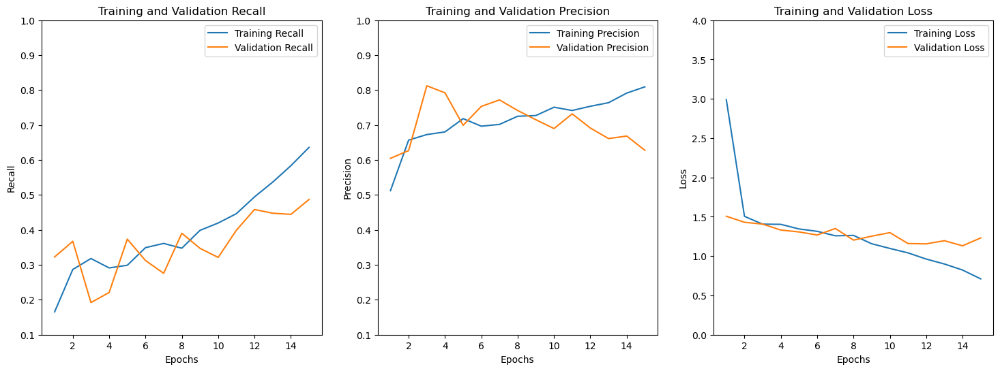

In [ ]:
plot_training_history(history.history, y_min=0.1)

#### Conclusion

After conducting multiple tests, we found that the results from simple resizing and resizing with padding are quite similar. As it aligns with our class practices, we've decided to use simple resizing.

We can argue that resizing to 128x128 and 224x224 yields similar results. Since 128x128 is faster, it seems like a reasonable choice. However, there are two key reasons for not opting for 128x128 despite the speed advantage.

First, transfer learning models like DenseNet121 perform better with an input size of 224x224, as this was the image size they were originally trained on.  

Second, even though 128x128 is faster, reducing the image size compromises the model's ability to capture important details. While simpler models may show little difference with smaller images, more complex models—such as those using multi-modal inputs—might be more sensitive to image resolution, as they rely on finer details for accurate predictions. And as precison and recall results are not very high we choose 224x224 in hopes this more complex models increase the score. 


Due to memory constraints, we will use a resizing of 128x128 for upsampling.
While resizing with padding preserves image proportions, the resulting images are too small for easy visual interpretation. Although this isn’t an issue for the models, we want to maintain some level of human interpretability. We still tested the 2 aproaches making sure we didn't have a performance issue.

Note: Simpler Models vs Complex Models: Simple models might not show a significant drop in performance with smaller images because they might not rely on as many intricate details, while complex models benefit from richer, high-resolution data to make more accurate predictions.

### 4.1.2. Removing Duplicate Images - 128x128

Altough we will be only using this later in "SMOTE with lower size images", the removal of duplicates will be done now

In [6]:
all_dataset = np.concatenate((X_test, X_train), axis=0)
all_labels_binary = np.concatenate((Y_binary_test, Y_binary_train), axis=0)
all_labels_multiclass = np.concatenate((Y_multiclass_test, Y_multiclass_train), axis=0)

In [7]:
all_labels_multiclass.shape

(7909, 8)

In [8]:
all_dataset.shape

(7909, 128, 128, 3)

In [9]:
# Identifying the unique images and their corresponding indices in the dataset
unique_rows, unique_indices = np.unique(all_dataset, axis=0, return_index=True)

unique_indices = np.sort(unique_indices) # Sort the indices to maintain the original order
all_dataset_unique = all_dataset[unique_indices]

# Extract the corresponding labels for the unique images
all_labels_binary = all_labels_binary[unique_indices]
all_labels_multiclass = all_labels_multiclass[unique_indices]

print(f"Original number of rows: {all_dataset.shape[0]}")
print(f"Number of unique rows: {all_dataset_unique.shape[0]}")

Original number of rows: 7909
Number of unique rows: 7784


In [ ]:
# Combine binary and multiclass labels to create a stratification variable
combined_labels = np.array([f"{binary}_{multiclass}" for binary, multiclass in zip(all_labels_binary, all_labels_multiclass)])

# Perform train-test split with stratification based on the combined labels
X_train, X_test, Y_train_binary, Y_test_binary, Y_train_multiclass, Y_test_multiclass = train_test_split(
    all_dataset_unique,
    all_labels_binary,
    all_labels_multiclass,
    test_size=0.2,
    random_state=42,
    stratify=combined_labels,  # Stratify using the combined labels
    shuffle=True)

In [11]:
X_train.shape

(6227, 128, 128, 3)

In [12]:
Y_train_multiclass.shape

(6227, 8)

Saving the 128x128 arrays for later.

In [ ]:
#np.savez('images/data_arrays_mult_128x128.npz', arr_0=X_train, arr_1=X_test, arr_2=Y_train_binary, arr_3=Y_test_binary, arr_4=Y_train_multiclass, arr_5=Y_test_multiclass)

Importing the 224x224 arrays used in the binary problem.

In [2]:
arrays = np.load('images/data_arrays.npz')
X_train_full = arrays['arr_0']
X_test = arrays['arr_1']
Y_binary_train = arrays['arr_2']
Y_binary_test = arrays['arr_3']
Y_multiclass_train = arrays['arr_4']
Y_multiclass_test = arrays['arr_5']

In [3]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [4]:
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_full, Y_multiclass_train, test_size=0.3, random_state=42, stratify=Y_multiclass_train, shuffle=True)

In [6]:
X_train_full.shape

(6327, 224, 224, 3)

In [7]:
X_train.shape

(4428, 224, 224, 3)

## 4.2. Modelling Multiclass Problem

### 4.2.1. First Experiments

#### Best Binary Model Architecture

We believed that a good starting point for solving this problem would be using the architecture from the our best binary problem model and adapt it to the multiclass problem.

In [5]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [6]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [ ]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=15, batch_size=32, verbose=1)

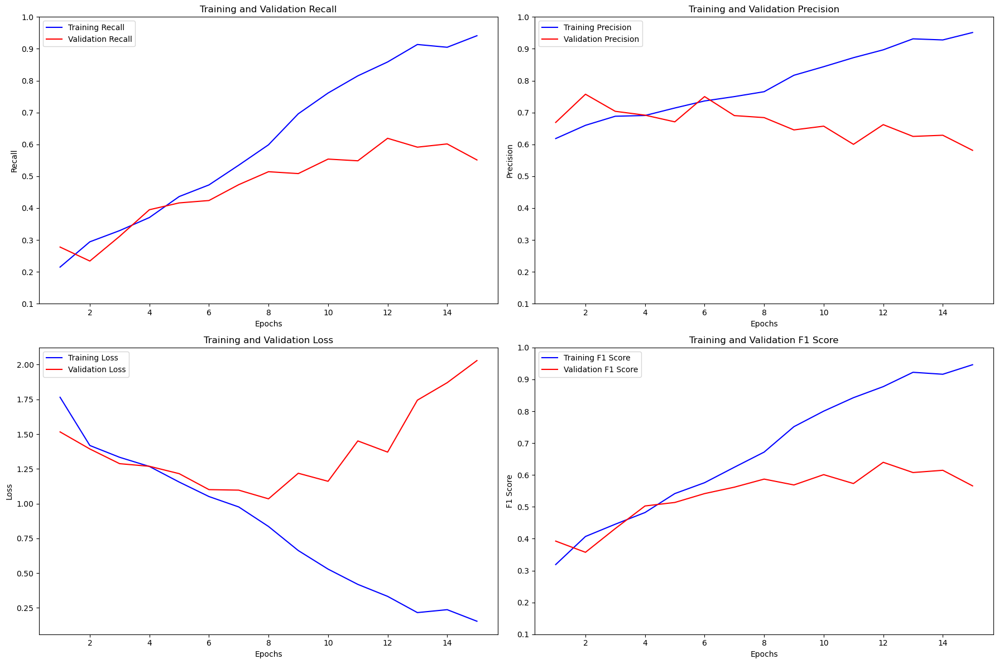

In [18]:
compute_and_plot_metrics(history.history, y_min=0.1)

In [7]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=6, batch_size=32, verbose=1)

Epoch 1/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 101s 693ms/step - loss: 2.3404 - precision: 0.5397 - recall: 0.2103 - val_loss: 1.6032 - val_precision: 0.7275 - val_recall: 0.1771
Epoch 2/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 89s 646ms/step - loss: 1.5589 - precision: 0.6287 - recall: 0.2754 - val_loss: 1.4717 - val_precision: 0.6516 - val_recall: 0.3392
Epoch 3/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 88s 638ms/step - loss: 1.4529 - precision: 0.6820 - recall: 0.3402 - val_loss: 1.4119 - val_precision: 0.6896 - val_recall: 0.3328
Epoch 4/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 85s 618ms/step - loss: 1.4242 - precision: 0.6608 - recall: 0.3299 - val_loss: 1.4183 - val_precision: 0.7002 - val_recall: 0.3274
Epoch 5/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 87s 634ms/step - loss: 1.3479 - precision: 0.6711 - recall: 0.3743 - val_loss: 1.4805 - val_precision: 0.6238 - val_recall: 0.4339
Epoch 6/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 84s 611ms/step - loss: 1.3112 - precision: 0.6728 - recall: 0.3865 - val_loss: 1.2661 - val_precision: 0.6759 

In [8]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step
              precision    recall  f1-score   support

           0       0.82      0.08      0.15       107
           1       0.67      0.95      0.79       821
           2       0.33      0.69      0.45       243
           3       0.79      0.12      0.20       128
           4       0.40      0.21      0.27       190
           5       0.83      0.04      0.07       134
           6       0.23      0.14      0.17       109
           7       0.67      0.04      0.08       137

    accuracy                           0.55      1869
   macro avg       0.59      0.28      0.27      1869
weighted avg       0.60      0.55      0.48      1869



F1 Macro Avg: 0.27

We could see that even though this model could perform really well with binary targets, it is not the case for the multiclass problem. The scores fell short when compared to the binary ones and it quickly overfitted after a few epochs.

#### Lighter Architecture

Let's try to use a lighter architecture, to control overfitting from the beggining and check if it has the potential to converge to good results.

In [5]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [6]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping]

In [8]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=30, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 81s 545ms/step - loss: 1.7525 - precision: 0.5913 - recall: 0.1654 - val_loss: 1.5506 - val_precision: 0.7349 - val_recall: 0.2017
Epoch 2/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 65s 475ms/step - loss: 1.5150 - precision: 0.6486 - recall: 0.2758 - val_loss: 1.4699 - val_precision: 0.7048 - val_recall: 0.2338
Epoch 3/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 63s 462ms/step - loss: 1.4950 - precision: 0.6842 - recall: 0.2447 - val_loss: 1.4337 - val_precision: 0.7240 - val_recall: 0.3130
Epoch 4/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 66s 479ms/step - loss: 1.4708 - precision: 0.6726 - recall: 0.2896 - val_loss: 1.3930 - val_precision: 0.7097 - val_recall: 0.3558
Epoch 5/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 65s 472ms/step - loss: 1.4055 - precision: 0.6853 - recall: 0.3253 - val_loss: 1.3962 - val_precision: 0.6886 - val_recall: 0.3478
Epoch 6/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 63s 462ms/step - loss: 1.4158 - precision: 0.6739 - recall: 0.3172 - val_loss: 1.3427 - val_precision: 0.

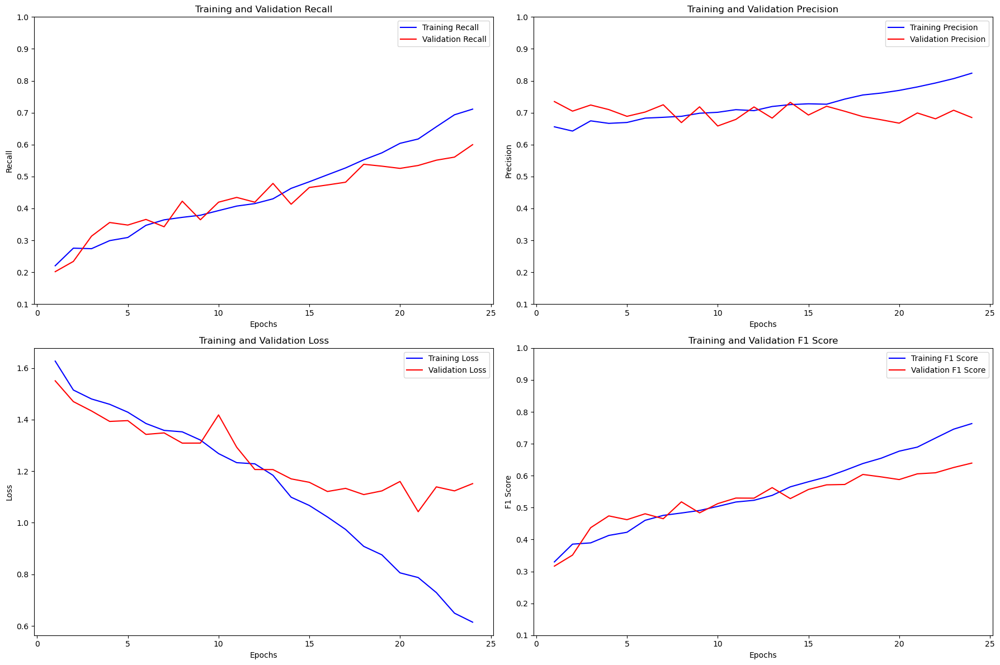

In [9]:
compute_and_plot_metrics(history.history, y_min=0.1)

In [7]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=12, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/12
137/137 ━━━━━━━━━━━━━━━━━━━━ 84s 561ms/step - loss: 1.7161 - precision: 0.5776 - recall: 0.1903 - val_loss: 1.5375 - val_precision: 0.5921 - val_recall: 0.2804
Epoch 2/12
137/137 ━━━━━━━━━━━━━━━━━━━━ 65s 473ms/step - loss: 1.5503 - precision: 0.6321 - recall: 0.2463 - val_loss: 1.5566 - val_precision: 0.5815 - val_recall: 0.4200
Epoch 3/12
137/137 ━━━━━━━━━━━━━━━━━━━━ 62s 448ms/step - loss: 1.5242 - precision: 0.6407 - recall: 0.2652 - val_loss: 1.5270 - val_precision: 0.6098 - val_recall: 0.3713
Epoch 4/12
137/137 ━━━━━━━━━━━━━━━━━━━━ 62s 449ms/step - loss: 1.5041 - precision: 0.6305 - recall: 0.2891 - val_loss: 1.4941 - val_precision: 0.5938 - val_recall: 0.4200
Epoch 5/12
137/137 ━━━━━━━━━━━━━━━━━━━━ 60s 436ms/step - loss: 1.4670 - precision: 0.6413 - recall: 0.3162 - val_loss: 1.4500 - val_precision: 0.6292 - val_recall: 0.3986
Epoch 6/12
137/137 ━━━━━━━━━━━━━━━━━━━━ 60s 437ms/step - loss: 1.3904 - precision: 0.6859 - recall: 0.3186 - val_loss: 1.3949 - val_precision: 0.

In [8]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step
              precision    recall  f1-score   support

           0       0.42      0.49      0.45       107
           1       0.72      0.87      0.78       821
           2       0.38      0.72      0.50       243
           3       0.49      0.31      0.38       128
           4       0.32      0.21      0.25       190
           5       0.34      0.09      0.14       134
           6       0.00      0.00      0.00       109
           7       0.63      0.23      0.33       137

    accuracy                           0.57      1869
   macro avg       0.41      0.36      0.36      1869
weighted avg       0.52      0.57      0.52      1869



F1 Macro Avg: 0.36

This architecture not only achieved better performance as controlled better the overfitting.

#### Extreme Maximum Architecture

In [6]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [7]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping]

In [8]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=30, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 264s 2s/step - loss: 2.6571 - precision: 0.5618 - recall: 0.1813 - val_loss: 1.5632 - val_precision: 0.7514 - val_recall: 0.2167
Epoch 2/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 259s 2s/step - loss: 1.5253 - precision: 0.6819 - recall: 0.2712 - val_loss: 1.7776 - val_precision: 0.5679 - val_recall: 0.3847
Epoch 3/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 256s 2s/step - loss: 1.5384 - precision: 0.6867 - recall: 0.2817 - val_loss: 1.4347 - val_precision: 0.7833 - val_recall: 0.1953
Epoch 4/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 191s 1s/step - loss: 1.4143 - precision: 0.6871 - recall: 0.3080 - val_loss: 1.3764 - val_precision: 0.6997 - val_recall: 0.3665
Epoch 5/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 212s 2s/step - loss: 1.3231 - precision: 0.6971 - recall: 0.3731 - val_loss: 1.3928 - val_precision: 0.6740 - val_recall: 0.3917
Epoch 6/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 191s 1s/step - loss: 1.2742 - precision: 0.6934 - recall: 0.3795 - val_loss: 1.3324 - val_precision: 0.7077 - val_r

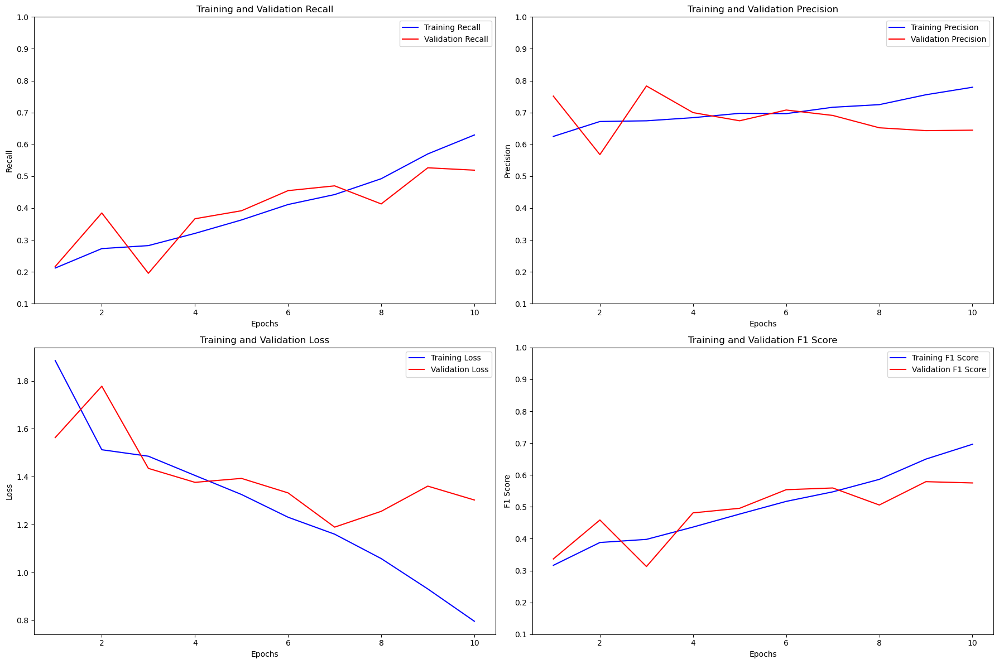

In [9]:
compute_and_plot_metrics(history.history, y_min=0.1)

This approach could also control overfitting and achieve satisfactory results. However it is way more computationally expensive.

#### Trying to solve overfit in the Best Binary Model

Even though this model experienced a huge overfit, it was the one with the lowest loss. Therefore, we will try to reduce this overfit.

In [5]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))
model.add(Conv2D(128, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(MaxPooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(8, activation='softmax'))

In [6]:
model.compile(optimizer=AdamW(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [8]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=25, batch_size=64, verbose=1)

Epoch 1/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 93s 1s/step - loss: 3.1362 - precision: 0.4356 - recall: 0.1724 - val_loss: 1.5271 - val_precision: 0.6420 - val_recall: 0.3012
Epoch 2/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - loss: 1.5820 - precision: 0.6549 - recall: 0.2605 - val_loss: 1.5161 - val_precision: 0.6683 - val_recall: 0.2857
Epoch 3/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - loss: 1.5749 - precision: 0.6359 - recall: 0.2425 - val_loss: 1.4884 - val_precision: 0.6573 - val_recall: 0.3622
Epoch 4/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - loss: 1.4984 - precision: 0.6513 - recall: 0.2829 - val_loss: 1.3860 - val_precision: 0.6992 - val_recall: 0.3333
Epoch 5/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - loss: 1.3972 - precision: 0.6653 - recall: 0.3147 - val_loss: 1.3268 - val_precision: 0.6655 - val_recall: 0.4120
Epoch 6/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - loss: 1.3754 - precision: 0.6730 - recall: 0.3333 - val_loss: 1.3324 - val_precision: 0.7500 - val_recall: 0.3194
Epoc

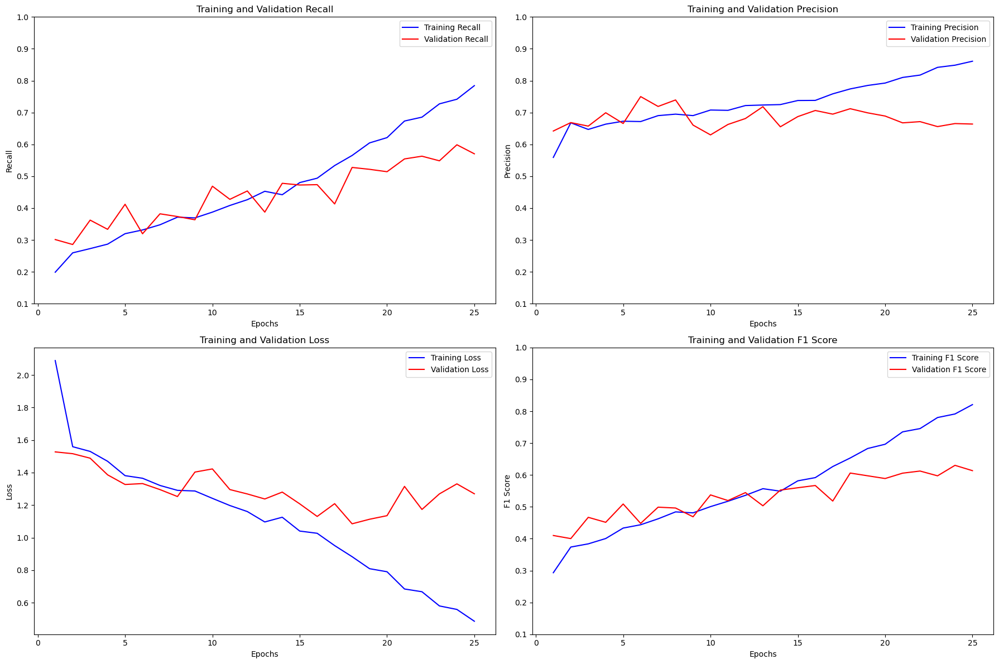

In [9]:
compute_and_plot_metrics(history.history, y_min=0.1)

Besides the trial on display, it was also tested L2 Regularization, Dropout, Batch Normalization, AdamW, and changes to the batch size in separate and combined. The best combination was with AdamW and Dropout (in the code). However, it did not solve completely the overfitting problem and if the epoch number was reduced the results were not very satisfactory.

#### Trying to solve the slight overfit in the Lighter Architecture

This architecture could already do slightly better results when compared to the Best Binary Model but it still had some overfitting. We will try to reduce it with changes on the batch size, optimizer and epoch number.

In [7]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [ ]:
model.compile(optimizer=AdamW(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [9]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=25, batch_size=64, verbose=1)

Epoch 1/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 78s 997ms/step - loss: 1.7201 - precision: 0.6062 - recall: 0.1910 - val_loss: 1.5302 - val_precision: 0.6734 - val_recall: 0.2659
Epoch 2/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 56s 804ms/step - loss: 1.5540 - precision: 0.6502 - recall: 0.2508 - val_loss: 1.4945 - val_precision: 0.7026 - val_recall: 0.2579
Epoch 3/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 59s 856ms/step - loss: 1.4871 - precision: 0.6415 - recall: 0.2978 - val_loss: 1.5428 - val_precision: 0.6157 - val_recall: 0.3900
Epoch 4/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 59s 840ms/step - loss: 1.4577 - precision: 0.6977 - recall: 0.2819 - val_loss: 1.4728 - val_precision: 0.6256 - val_recall: 0.3863
Epoch 5/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 57s 804ms/step - loss: 1.4594 - precision: 0.6601 - recall: 0.3021 - val_loss: 1.3935 - val_precision: 0.6420 - val_recall: 0.4136
Epoch 6/25
69/69 ━━━━━━━━━━━━━━━━━━━━ 55s 792ms/step - loss: 1.3696 - precision: 0.6677 - recall: 0.3538 - val_loss: 1.3712 - val_precision: 0.7497 - val_r

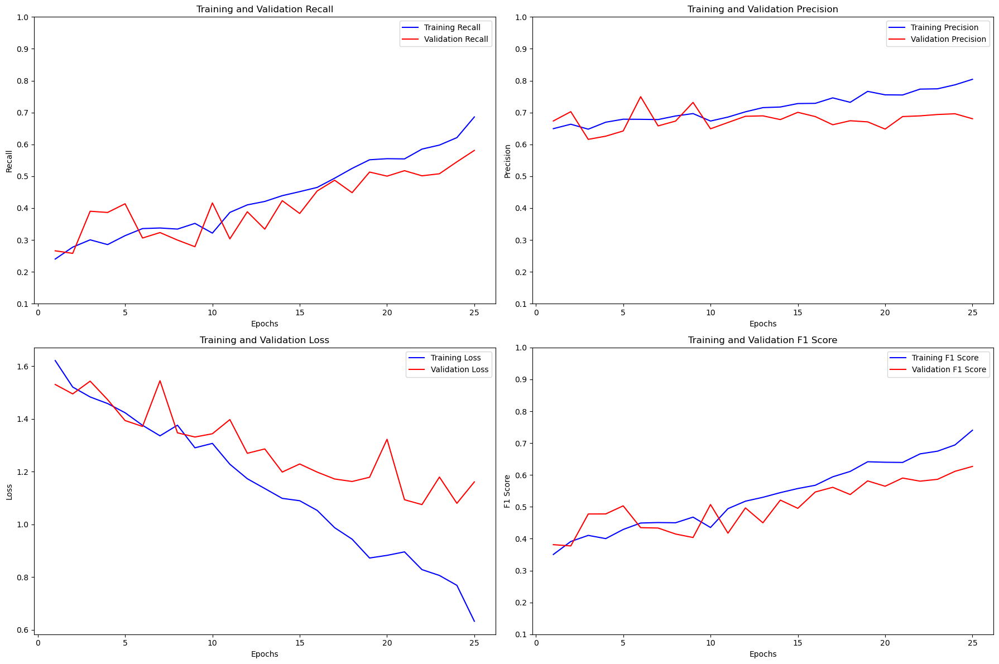

In [10]:
compute_and_plot_metrics(history.history, y_min=0.1)

We could see a good reduction in overfit of recall and precision but the loss kept overfiting. We will try new aproaches on top of the base model, that can bring better results, instead of trying to improve this model.

#### Introducing Class Weights

As we are dealing with and imbalanced class dataset, by introducing the class weights we can assign different weights to each class in the loss function. This should make it easier for the model to learn from underrepresented classes, resulting in better scores overall, but specially for the minority classes.

In [ ]:
Y_train_indices = np.argmax(Y_train, axis=1)
Counter(Y_train_indices)

Counter({1: 1916, 2: 568, 4: 444, 7: 318, 5: 314, 3: 297, 6: 253, 0: 248})

In [5]:
Y_train_labels = np.argmax(Y_train, axis=1)
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(Y_train_labels),
    y=Y_train_labels)

class_weights_dict = {i: weight for i, weight in zip(np.unique(Y_train_labels), class_weights)}

In [6]:
class_weights_dict

{0: 2.1965725806451615,
 1: 0.2843162839248434,
 2: 0.9590669014084507,
 3: 1.8341750841750841,
 4: 1.2269144144144144,
 5: 1.7348726114649682,
 6: 2.1531620553359683,
 7: 1.7130503144654088}

In [7]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [8]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [9]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=20, batch_size=64, verbose=1, class_weight=class_weights_dict)

Epoch 1/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - loss: 2.0426 - precision: 0.3617 - recall: 7.0644e-04 - val_loss: 1.8053 - val_precision: 0.8780 - val_recall: 0.0193
Epoch 2/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 58s 824ms/step - loss: 1.8672 - precision: 0.8593 - recall: 0.0412 - val_loss: 1.7325 - val_precision: 0.7719 - val_recall: 0.0706
Epoch 3/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 57s 817ms/step - loss: 1.8287 - precision: 0.6985 - recall: 0.0683 - val_loss: 1.7320 - val_precision: 0.8052 - val_recall: 0.0332
Epoch 4/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 58s 829ms/step - loss: 1.7743 - precision: 0.6678 - recall: 0.0716 - val_loss: 1.5825 - val_precision: 0.6980 - val_recall: 0.1471
Epoch 5/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 55s 785ms/step - loss: 1.6545 - precision: 0.6133 - recall: 0.1175 - val_loss: 1.6389 - val_precision: 0.6250 - val_recall: 0.0829
Epoch 6/20
69/69 ━━━━━━━━━━━━━━━━━━━━ 57s 819ms/step - loss: 1.6434 - precision: 0.5575 - recall: 0.1024 - val_loss: 1.6988 - val_precision: 0.4991 - val_

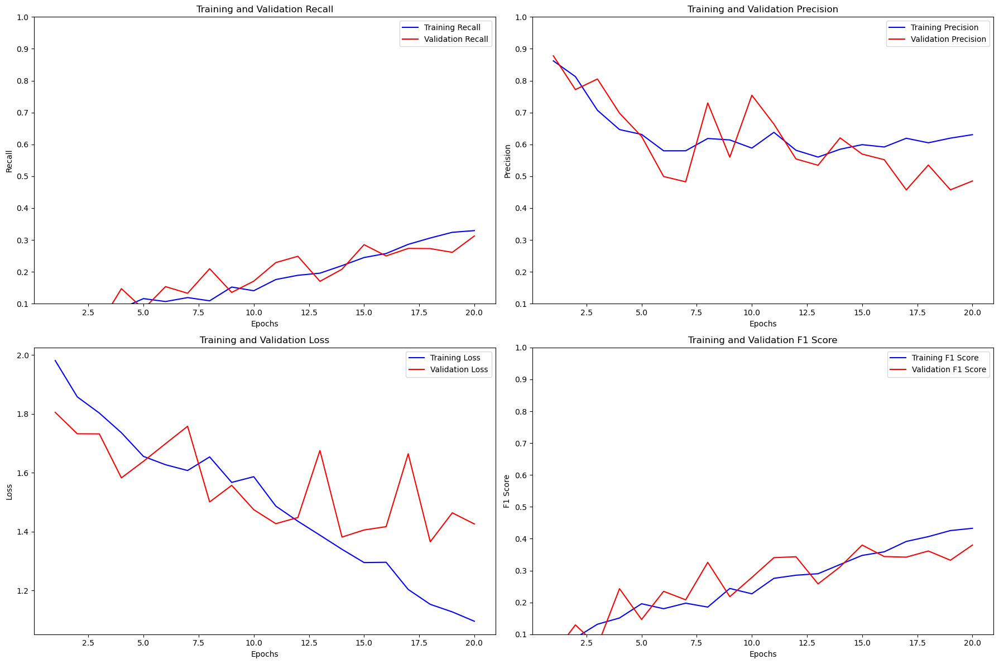

In [10]:
compute_and_plot_metrics(history.history, y_min=0.1)

In [8]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=12, batch_size=64, verbose=1, class_weight=class_weights_dict)

Epoch 1/12
69/69 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - loss: 2.0828 - precision: 0.0881 - recall: 0.0015 - val_loss: 1.9517 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/12
69/69 ━━━━━━━━━━━━━━━━━━━━ 64s 924ms/step - loss: 1.9882 - precision: 0.2374 - recall: 0.0031 - val_loss: 1.8197 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/12
69/69 ━━━━━━━━━━━━━━━━━━━━ 62s 900ms/step - loss: 1.8898 - precision: 0.0127 - recall: 2.7017e-05 - val_loss: 1.9633 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/12
69/69 ━━━━━━━━━━━━━━━━━━━━ 60s 862ms/step - loss: 1.8816 - precision: 0.1705 - recall: 6.3772e-04 - val_loss: 1.7435 - val_precision: 0.2632 - val_recall: 0.0107
Epoch 5/12
69/69 ━━━━━━━━━━━━━━━━━━━━ 61s 859ms/step - loss: 1.8654 - precision: 0.3567 - recall: 0.0046 - val_loss: 1.9419 - val_precision: 0.2687 - val_recall: 0.0096
Epoch 6/12
69/69 ━━━━━━━━━━━━━━━━━━━━ 61s 868ms/step - loss: 1.9094 - precision: 0.2802 - recall: 0.0074 - val_loss: 1.7890 - 

In [9]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step
              precision    recall  f1-score   support

           0       0.28      0.57      0.37       107
           1       0.71      0.55      0.62       821
           2       0.47      0.39      0.43       243
           3       0.22      0.66      0.33       128
           4       0.27      0.14      0.19       190
           5       0.16      0.33      0.22       134
           6       0.25      0.08      0.12       109
           7       0.43      0.07      0.11       137

    accuracy                           0.42      1869
   macro avg       0.35      0.35      0.30      1869
weighted avg       0.49      0.42      0.42      1869



F1 Macro Avg: 0.30

With this, we could successfully deal with overfit but the results ended up being worse than before.

### 4.2.2. Testing Image Enhancement Techniques

In this section the same techniques used in the binary problem will be tested here.

#### 4.2.2.1. Histogram Equalization on Grayscale Images

In [5]:
# Apply histogram equalization to all images
equalized_X_train = np.array([equalize_grayscale_image(img) for img in X_train])
equalized_X_val = np.array([equalize_grayscale_image(img) for img in X_val])

In [ ]:
equalized_X_val=np.asarray(equalized_X_val, dtype='float16') / 255
equalized_X_train=np.asarray(equalized_X_train, dtype='float16') / 255

In [6]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform', input_shape=(224, 224, 1)))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [7]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])

In [9]:
history = model.fit(equalized_X_train, Y_train, validation_data=(equalized_X_val, Y_val), epochs=15, batch_size=32, verbose=1)

Epoch 1/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 86s 587ms/step - loss: 20.1330 - precision: 0.3362 - recall: 0.1804 - val_loss: 1.9245 - val_precision: 0.3913 - val_recall: 0.0048
Epoch 2/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 76s 553ms/step - loss: 1.7530 - precision: 0.4831 - recall: 0.1321 - val_loss: 1.7821 - val_precision: 0.4815 - val_recall: 0.3692
Epoch 3/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 69s 500ms/step - loss: 1.7110 - precision: 0.5411 - recall: 0.1377 - val_loss: 1.8397 - val_precision: 0.4529 - val_recall: 0.4120
Epoch 4/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 57s 416ms/step - loss: 1.7147 - precision: 0.5340 - recall: 0.1682 - val_loss: 1.7488 - val_precision: 0.5030 - val_recall: 0.3184
Epoch 5/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 61s 448ms/step - loss: 1.6947 - precision: 0.5731 - recall: 0.1852 - val_loss: 1.7598 - val_precision: 0.5276 - val_recall: 0.1584
Epoch 6/15
137/137 ━━━━━━━━━━━━━━━━━━━━ 57s 415ms/step - loss: 1.6478 - precision: 0.5826 - recall: 0.1930 - val_loss: 1.7416 - val_precision: 0

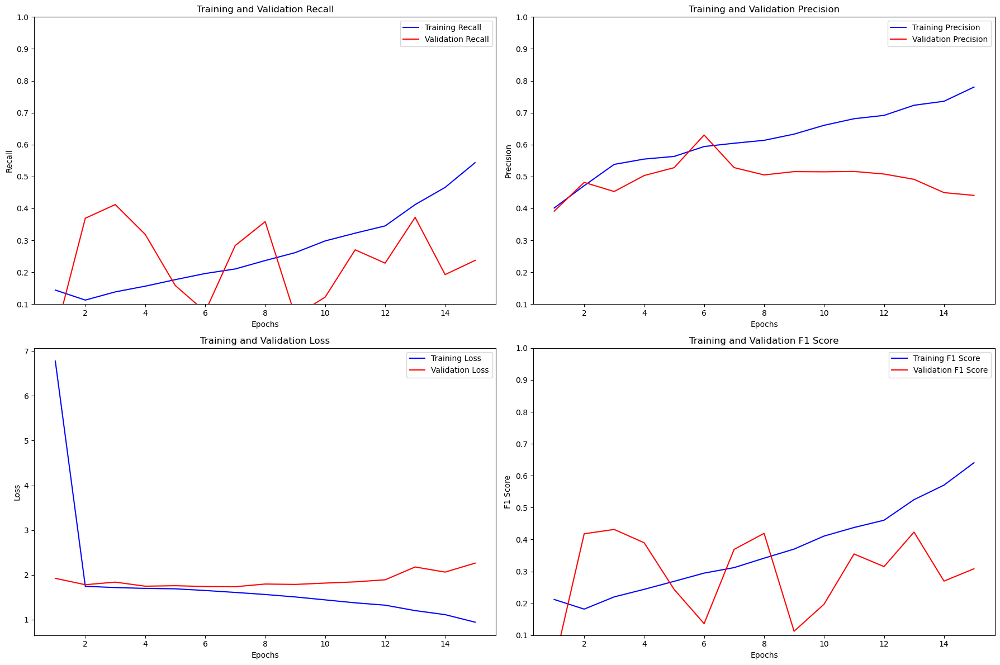

In [10]:
compute_and_plot_metrics(history.history, y_min=0.1)

In [8]:
history = model.fit(equalized_X_train, Y_train, validation_data=(equalized_X_val, Y_val), epochs=8, batch_size=32, verbose=1)

Epoch 1/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 68s 458ms/step - loss: 16.2217 - precision: 0.3431 - recall: 0.1777 - val_loss: 1.7378 - val_precision: 0.5615 - val_recall: 0.0391
Epoch 2/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 60s 437ms/step - loss: 1.7434 - precision: 0.5203 - recall: 0.1157 - val_loss: 1.7709 - val_precision: 0.7347 - val_recall: 0.0193
Epoch 3/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 59s 429ms/step - loss: 1.7225 - precision: 0.5258 - recall: 0.1316 - val_loss: 1.7420 - val_precision: 0.6344 - val_recall: 0.0316
Epoch 4/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 59s 427ms/step - loss: 1.6989 - precision: 0.5383 - recall: 0.1487 - val_loss: 1.7047 - val_precision: 0.5370 - val_recall: 0.2488
Epoch 5/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 61s 445ms/step - loss: 1.6674 - precision: 0.5731 - recall: 0.1837 - val_loss: 1.7254 - val_precision: 0.5278 - val_recall: 0.2333
Epoch 6/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 58s 425ms/step - loss: 1.6359 - precision: 0.6034 - recall: 0.2121 - val_loss: 1.6895 - val_precision: 0.5921 

In [9]:
pred_probabilities = model.predict(equalized_X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       107
           1       0.47      0.94      0.63       821
           2       0.27      0.22      0.24       243
           3       0.00      0.00      0.00       128
           4       0.00      0.00      0.00       190
           5       0.26      0.07      0.11       134
           6       0.23      0.03      0.05       109
           7       0.67      0.01      0.03       137

    accuracy                           0.45      1869
   macro avg       0.24      0.16      0.13      1869
weighted avg       0.33      0.45      0.32      1869



F1 Macro Avg: 0.13

We could understand that at least for this architecture, applying this image enhancing technique does not lead to better results.

#### 4.2.2.2. Contrast Limited Adaptive Histogram Equalization

In [5]:
# Apply CLAHE to all images
X_train_clahe = np.array([apply_clahe_to_image(img) for img in X_train])
X_val_clahe = np.array([apply_clahe_to_image(img) for img in X_val])

In [ ]:
X_train_clahe=np.asarray(X_train_clahe, dtype='float16') / 255
X_val_clahe=np.asarray(X_val_clahe, dtype='float16') / 255

In [6]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [7]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping]

In [9]:
history = model.fit(X_train_clahe, Y_train, validation_data=(X_val_clahe, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 71s 463ms/step - loss: 50.4011 - precision: 0.3626 - recall: 0.2452 - val_loss: 1.4672 - val_precision: 0.7014 - val_recall: 0.2879
Epoch 2/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 61s 444ms/step - loss: 1.4450 - precision: 0.6569 - recall: 0.3178 - val_loss: 1.4194 - val_precision: 0.6885 - val_recall: 0.3312
Epoch 3/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 62s 452ms/step - loss: 1.4306 - precision: 0.6720 - recall: 0.3278 - val_loss: 1.4853 - val_precision: 0.6042 - val_recall: 0.2622
Epoch 4/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 61s 442ms/step - loss: 1.4686 - precision: 0.6706 - recall: 0.2946 - val_loss: 1.4546 - val_precision: 0.6919 - val_recall: 0.2547
Epoch 5/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 60s 440ms/step - loss: 1.4213 - precision: 0.6494 - recall: 0.3021 - val_loss: 1.4039 - val_precision: 0.6600 - val_recall: 0.2638
Epoch 6/25
137/137 ━━━━━━━━━━━━━━━━━━━━ 61s 446ms/step - loss: 1.3253 - precision: 0.6898 - recall: 0.3185 - val_loss: 1.4208 - val_precision: 0

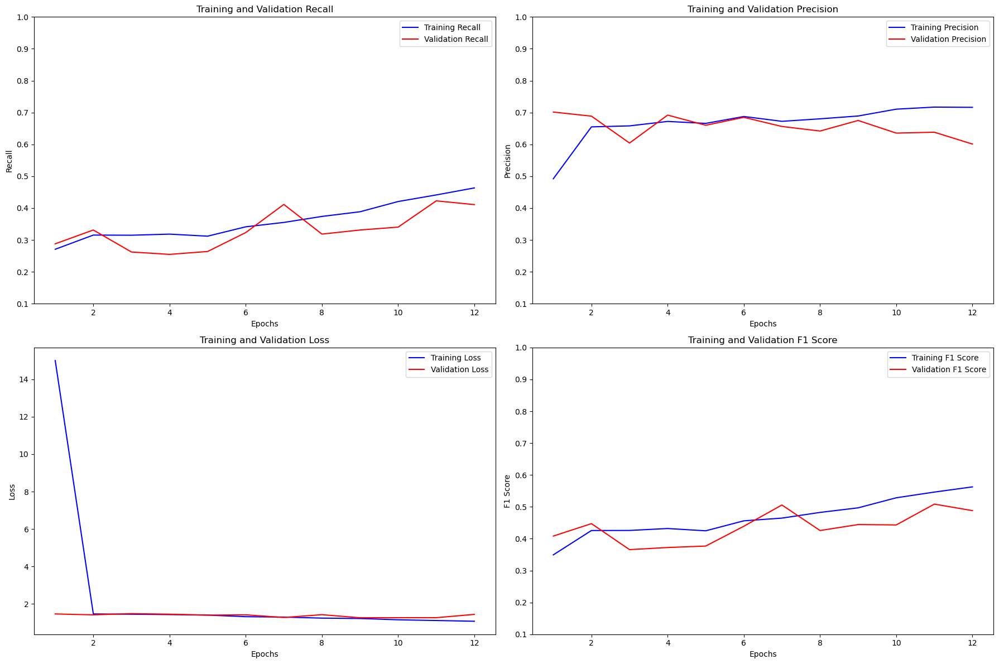

In [10]:
compute_and_plot_metrics(history.history, y_min=0.1)

In [8]:
history = model.fit(X_train_clahe, Y_train, validation_data=(X_val_clahe, Y_val), epochs=8, batch_size=32, verbose=1)

Epoch 1/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 78s 509ms/step - loss: 35.1179 - precision: 0.3989 - recall: 0.2349 - val_loss: 1.5137 - val_precision: 0.7745 - val_recall: 0.1948
Epoch 2/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 60s 437ms/step - loss: 1.5297 - precision: 0.6680 - recall: 0.2611 - val_loss: 1.4039 - val_precision: 0.7463 - val_recall: 0.2140
Epoch 3/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 57s 419ms/step - loss: 1.4205 - precision: 0.6690 - recall: 0.3247 - val_loss: 1.4648 - val_precision: 0.8219 - val_recall: 0.1086
Epoch 4/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 56s 410ms/step - loss: 1.3656 - precision: 0.6706 - recall: 0.3099 - val_loss: 1.3733 - val_precision: 0.7522 - val_recall: 0.2306
Epoch 5/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 55s 402ms/step - loss: 1.3109 - precision: 0.6935 - recall: 0.3457 - val_loss: 1.3747 - val_precision: 0.7189 - val_recall: 0.2873
Epoch 6/8
137/137 ━━━━━━━━━━━━━━━━━━━━ 56s 409ms/step - loss: 1.3222 - precision: 0.6924 - recall: 0.3335 - val_loss: 1.3910 - val_precision: 0.6139 

In [9]:
pred_probabilities = model.predict(X_val_clahe)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step
              precision    recall  f1-score   support

           0       0.36      0.41      0.38       107
           1       0.64      0.87      0.74       821
           2       0.42      0.64      0.50       243
           3       0.53      0.24      0.33       128
           4       0.33      0.09      0.15       190
           5       0.29      0.18      0.22       134
           6       0.00      0.00      0.00       109
           7       0.42      0.18      0.25       137

    accuracy                           0.54      1869
   macro avg       0.37      0.33      0.32      1869
weighted avg       0.48      0.54      0.48      1869



F1 Macro Avg: 0.32

Although CLAHE could yield better results than Histogram Equalization, the baseline model without image enhancing techniques was still better. A good thing to point is that we ended up solving the problem with overfit.

### 4.2.3. Implementing Data Augmentation

Because of computational issues, we could not make all classes balanced with 1811 samples each, so we neded to down sample a bit the majority class and then do data augmentation in the others to have a balanced problem.


#### 4.2.3.1. Downsampling Majority Class

In [5]:
n_samples, height, width, channels = X_train.shape

# Flatten X_train to 2D
X_train_flat = X_train.reshape((n_samples, height * width * channels))
Y_train_indices = np.argmax(Y_train, axis=1) #passes of one hot encoding to indices(categories)

# Count class distributions before resampling
class_counts_before = Counter(Y_train_indices)
print("Class distributions before undersampling:")
for label, count in class_counts_before.items():
    print(f"Class {label}: {count} samples")

# Define the target number of samples per class
target_samples_per_class = 600

# Initialize lists to collect resampled data
X_resampled_list = []
Y_resampled_list = []

# Perform undersampling for majority class
for class_label in np.unique(Y_train_indices):
    class_indices = np.where(Y_train_indices == class_label)[0]  # Get indices of the current class
    
    # Resample to the target number of samples
    if len(class_indices) > target_samples_per_class:
        class_indices_resampled = resample(
            class_indices, 
            replace=False, 
            n_samples=target_samples_per_class, 
            random_state=42
        )
    else:
        class_indices_resampled = class_indices  # Keep all samples if already <= target
    
    # Append the resampled data
    X_resampled_list.append(X_train_flat[class_indices_resampled])
    Y_resampled_list.append(Y_train_indices[class_indices_resampled])

# Combine all resampled classes
X_train_resampled = np.vstack(X_resampled_list) # Stack the list of arrays
y_train_resampled = np.hstack(Y_resampled_list) # Stack the list of arrays

# Reshape X_train_resampled back to 4D
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], height, width, channels))

# Verify class distributions after resampling
class_counts_after = Counter(y_train_resampled)
print("Class distributions after undersampling:")
for label, count in class_counts_after.items():
    print(f"Class {label}: {count} samples")

# One-hot encode y_train_resampled
num_classes = len(np.unique(y_train_resampled))
y_train_resampled= to_categorical(y_train_resampled, num_classes=num_classes)

Class distributions before undersampling:
Class 1: 1916 samples
Class 4: 444 samples
Class 7: 318 samples
Class 5: 314 samples
Class 2: 568 samples
Class 0: 248 samples
Class 6: 253 samples
Class 3: 297 samples
Class distributions after undersampling:
Class 0: 248 samples
Class 1: 600 samples
Class 2: 568 samples
Class 3: 297 samples
Class 4: 444 samples
Class 5: 314 samples
Class 6: 253 samples
Class 7: 318 samples


#### 4.2.3.2. SMOTE Data Augmentation on Minority Classes

In [6]:
n_samples, height, width, channels = X_train_resampled.shape
X_train_reshaped = X_train_resampled.reshape((n_samples, height * width * channels)) # Reshape X_train to 2D for SMOTE

# Apply SMOTE to generate synthetic samples
smote = SMOTE(sampling_strategy='auto')
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_reshaped, y_train_resampled )

# Reshape X_train_resampled back to 4D
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], height, width, channels))

In [8]:
# Print the number of samples before and after SMOTE
num_samples_before = n_samples
num_samples_after = X_train_resampled.shape[0]
num_added_samples = num_samples_after - num_samples_before

print(f"Number of samples before SMOTE: {num_samples_before}")
print(f"Number of samples after SMOTE: {num_samples_after}")
print(f"Number of added samples: {num_added_samples}")

Number of samples before SMOTE: 3042
Number of samples after SMOTE: 4800
Number of added samples: 1758


With this we end with 600 images for each class.

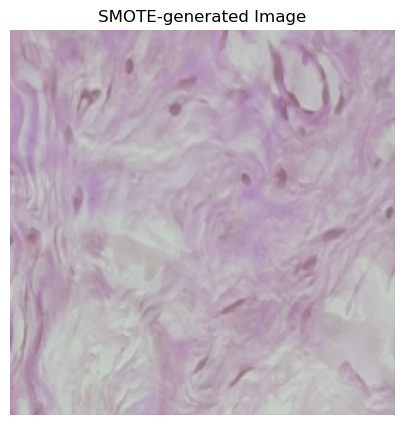

In [ ]:
synthetic_sample_index = num_samples_before +3  

# Ensure the synthetic image is in a compatible data type (float32)
synthetic_image = X_train_resampled[synthetic_sample_index].astype(np.float32)

# Display the synthetic image

plt.figure(figsize=(5, 5))
plt.title('SMOTE-generated Image')
plt.imshow(synthetic_image)
plt.axis('off')
plt.show()

In [7]:
# Shuffling the resampled data
X_train_resampled, y_train_resampled = shuffle(
    X_train_resampled,
    y_train_resampled,
    random_state=42)

In [8]:
# deleting variables so we have enough memory to run the model
del X_train_full, X_test, Y_binary_train, Y_binary_test, Y_multiclass_train, Y_multiclass_test

In [9]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [10]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping]

In [13]:
history = model.fit(X_train_resampled, y_train_resampled, validation_data=(X_val, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 75s 461ms/step - loss: 2.0108 - precision: 0.2405 - recall: 0.0071 - val_loss: 1.8970 - val_precision: 0.9206 - val_recall: 0.0310
Epoch 2/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 67s 445ms/step - loss: 1.8482 - precision: 0.4527 - recall: 0.0075 - val_loss: 1.7463 - val_precision: 0.8089 - val_recall: 0.1359
Epoch 3/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 66s 437ms/step - loss: 1.7364 - precision: 0.6387 - recall: 0.0606 - val_loss: 1.6314 - val_precision: 0.8125 - val_recall: 0.1252
Epoch 4/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 62s 414ms/step - loss: 1.7025 - precision: 0.6193 - recall: 0.0759 - val_loss: 1.7350 - val_precision: 0.6562 - val_recall: 0.1225
Epoch 5/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 64s 429ms/step - loss: 1.6659 - precision: 0.6046 - recall: 0.0808 - val_loss: 1.6667 - val_precision: 0.7522 - val_recall: 0.1380
Epoch 6/25
150/150 ━━━━━━━━━━━━━━━━━━━━ 82s 544ms/step - loss: 1.5750 - precision: 0.6252 - recall: 0.1172 - val_loss: 1.5258 - val_precision: 0.

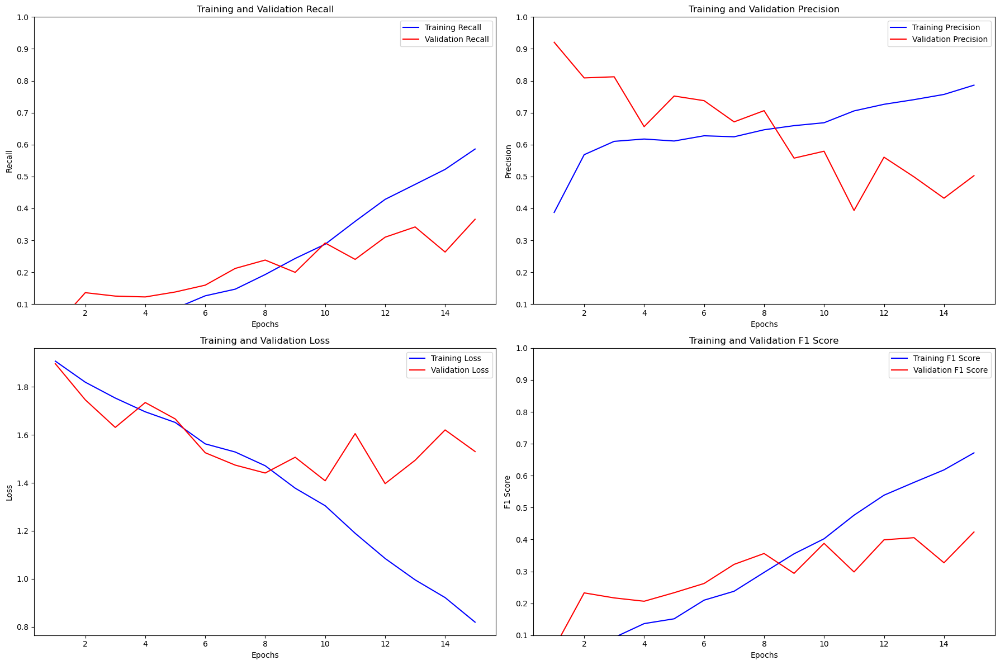

In [14]:
compute_and_plot_metrics(history.history, y_min=0.1)

It can be easily seen that the results are worse from what other trials in the past. We will run again for fewer epochs to avoid the overfitting and get the macro avg f1 score.

In [11]:
history = model.fit(X_train_resampled, y_train_resampled, validation_data=(X_val, Y_val), epochs=8, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/8
150/150 ━━━━━━━━━━━━━━━━━━━━ 84s 510ms/step - loss: 2.0093 - precision: 0.1842 - recall: 0.0017 - val_loss: 1.8012 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/8
150/150 ━━━━━━━━━━━━━━━━━━━━ 65s 429ms/step - loss: 1.8096 - precision: 0.6424 - recall: 0.0325 - val_loss: 1.6518 - val_precision: 0.8141 - val_recall: 0.1664
Epoch 3/8
150/150 ━━━━━━━━━━━━━━━━━━━━ 82s 549ms/step - loss: 1.7408 - precision: 0.6154 - recall: 0.0643 - val_loss: 1.5964 - val_precision: 0.7297 - val_recall: 0.1300
Epoch 4/8
150/150 ━━━━━━━━━━━━━━━━━━━━ 73s 488ms/step - loss: 1.6323 - precision: 0.6012 - recall: 0.0871 - val_loss: 1.4830 - val_precision: 0.7778 - val_recall: 0.1985
Epoch 5/8
150/150 ━━━━━━━━━━━━━━━━━━━━ 69s 456ms/step - loss: 1.5809 - precision: 0.6226 - recall: 0.1049 - val_loss: 1.5786 - val_precision: 0.7660 - val_recall: 0.1156
Epoch 6/8
150/150 ━━━━━━━━━━━━━━━━━━━━ 70s 469ms/step - loss: 1.5458 - precision: 0.6433 - recall: 0.1182 - val_loss: 1.5035 - val_precision: 

In [12]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)

59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step


In [ ]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

              precision    recall  f1-score   support

           0       0.43      0.40      0.42       107
           1       0.85      0.32      0.46       821
           2       0.42      0.34      0.38       243
           3       0.26      0.67      0.37       128
           4       0.20      0.27      0.23       190
           5       0.19      0.60      0.28       134
           6       0.23      0.15      0.18       109
           7       0.29      0.40      0.34       137

    accuracy                           0.36      1869
   macro avg       0.36      0.39      0.33      1869
weighted avg       0.54      0.36      0.38      1869



F1 Macro Avg: 0.33

Overall, this strategy did not resulted in better metric performance.

#### 4.2.3.3. SMOTE Data Augmentation on 128x128 Images

With this image resolution it is possible to perform just SMOTE without downsampling the majority class. The downside of this approach is that the ammount of created images will be considerably high.

In [9]:
arrays = np.load('images\data_arrays_mult_128x128.npz')
X_train_full = arrays['arr_0']
X_test = arrays['arr_1']
Y_binary_train = arrays['arr_2']
Y_binary_test = arrays['arr_3']
Y_multiclass_train = arrays['arr_4']
Y_multiclass_test = arrays['arr_5']

In [3]:
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_full, Y_multiclass_train, test_size=0.3, random_state=42, stratify=Y_multiclass_train, shuffle=True)

In [4]:
n_samples, height, width, channels = X_train.shape
X_train_reshaped = X_train.reshape((n_samples, height * width * channels)) # Reshape X_train to 2D for SMOTE

# Apply SMOTE to generate synthetic samples for a multiclass problem
smote = SMOTE(sampling_strategy='auto')
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_reshaped, Y_train )

# Reshape X_train_resampled back to 4D
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], height, width, channels))

In [5]:
# Shuffling the resampled data
X_train_resampled, y_train_resampled = shuffle(X_train_resampled, y_train_resampled, random_state=42)

In [6]:
num_samples_before = n_samples
num_samples_after = X_train_resampled.shape[0]
num_added_samples = num_samples_after - num_samples_before

print(f"Number of samples before SMOTE: {num_samples_before}")
print(f"Number of samples after SMOTE: {num_samples_after}")
print(f"Number of added samples: {num_added_samples}")

Number of samples before SMOTE: 4358
Number of samples after SMOTE: 15328
Number of added samples: 10970


In [6]:
model = Sequential()
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(32, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))
model.add(Conv2D(64, kernel_size=3, padding='same', activation='relu',kernel_initializer='he_uniform'))
model.add(AveragePooling2D((3, 3)))

model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dense(1024, activation='relu'))
model.add(Dense(8, activation='softmax'))

In [7]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=[Precision(),Recall()])
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)

callbacks = [early_stopping]

In [ ]:
history = model.fit(X_train_resampled, y_train_resampled, validation_data=(X_val, Y_val), epochs=25, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/25
479/479 ━━━━━━━━━━━━━━━━━━━━ 63s 119ms/step - loss: 1.8905 - precision: 0.4556 - recall: 0.0034 - val_loss: 1.7863 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/25
479/479 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 1.6992 - precision: 0.6187 - recall: 0.0480 - val_loss: 1.5953 - val_precision: 0.7237 - val_recall: 0.1990
Epoch 3/25
479/479 ━━━━━━━━━━━━━━━━━━━━ 80s 168ms/step - loss: 1.5476 - precision: 0.6817 - recall: 0.1332 - val_loss: 1.5175 - val_precision: 0.6629 - val_recall: 0.1883
Epoch 4/25
479/479 ━━━━━━━━━━━━━━━━━━━━ 69s 144ms/step - loss: 1.4405 - precision: 0.6641 - recall: 0.1913 - val_loss: 1.4682 - val_precision: 0.6372 - val_recall: 0.2584
Epoch 5/25
479/479 ━━━━━━━━━━━━━━━━━━━━ 66s 137ms/step - loss: 1.3043 - precision: 0.6747 - recall: 0.2848 - val_loss: 1.4198 - val_precision: 0.6227 - val_recall: 0.2702
Epoch 6/25
479/479 ━━━━━━━━━━━━━━━━━━━━ 66s 139ms/step - loss: 1.1917 - precision: 0.6953 - recall: 0.3712 - val_loss: 1.4225 - val_preci

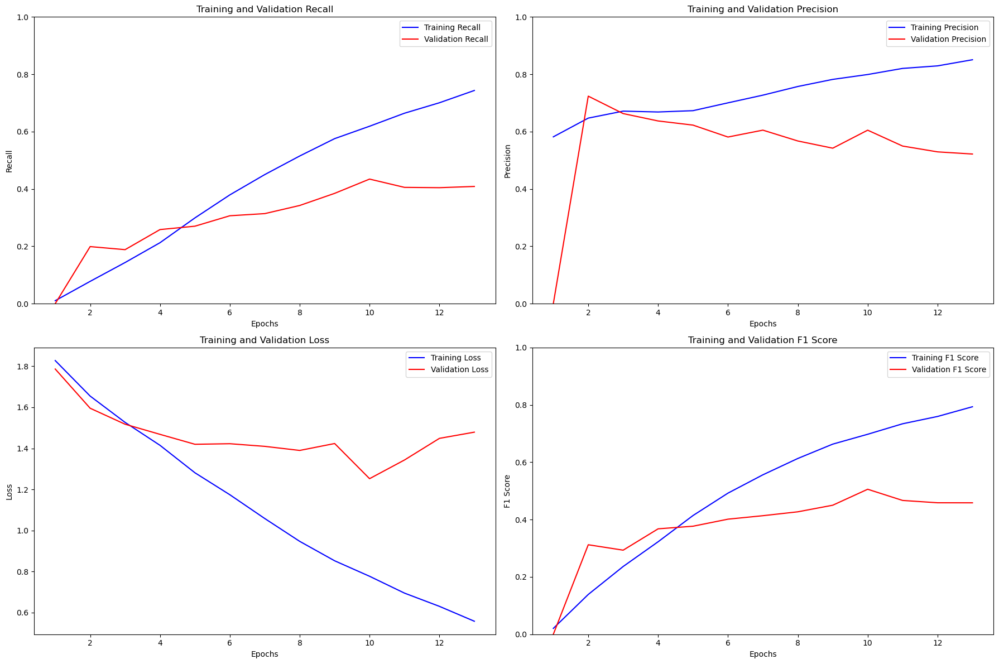

In [10]:
compute_and_plot_metrics(history.history, y_min=0)

Though the model overfitted a lot, at least the traning behavior turned out to be predictable as it's consistent with improving. We will cut the number of epochs.

In [8]:
history = model.fit(X_train_resampled, y_train_resampled, validation_data=(X_val, Y_val), epochs=5, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/5
479/479 ━━━━━━━━━━━━━━━━━━━━ 75s 145ms/step - loss: 1.8852 - precision: 0.5350 - recall: 0.0274 - val_loss: 1.5576 - val_precision: 0.7700 - val_recall: 0.2006
Epoch 2/5
479/479 ━━━━━━━━━━━━━━━━━━━━ 62s 129ms/step - loss: 1.6236 - precision: 0.6839 - recall: 0.0934 - val_loss: 1.4859 - val_precision: 0.7704 - val_recall: 0.1921
Epoch 3/5
479/479 ━━━━━━━━━━━━━━━━━━━━ 61s 126ms/step - loss: 1.4729 - precision: 0.6582 - recall: 0.1535 - val_loss: 1.5309 - val_precision: 0.5624 - val_recall: 0.1520
Epoch 4/5
479/479 ━━━━━━━━━━━━━━━━━━━━ 62s 129ms/step - loss: 1.3287 - precision: 0.6691 - recall: 0.2435 - val_loss: 1.4843 - val_precision: 0.5393 - val_recall: 0.1835
Epoch 5/5
479/479 ━━━━━━━━━━━━━━━━━━━━ 62s 130ms/step - loss: 1.1611 - precision: 0.7061 - recall: 0.3651 - val_loss: 1.3122 - val_precision: 0.6035 - val_recall: 0.3151


In [9]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)

59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step


In [13]:
print(classification_report(Y_true_classes, Y_pred_classes))

              precision    recall  f1-score   support

           0       0.50      0.64      0.56       107
           1       0.77      0.54      0.64       821
           2       0.40      0.38      0.39       243
           3       0.30      0.50      0.38       128
           4       0.31      0.38      0.34       190
           5       0.26      0.23      0.25       134
           6       0.20      0.38      0.26       109
           7       0.47      0.53      0.50       137

    accuracy                           0.48      1869
   macro avg       0.40      0.45      0.41      1869
weighted avg       0.54      0.48      0.49      1869



F1 Macro Avg: 0.41


As we used this aproach of data augmentation, we obtain an improvement in f1 macro avg.

### 4.2.4. Multi Input Model

The main objective of this section was to understand how could other informations, such as the image magnification or the binary label if the cell was benign or malignant could help our model predict more accuratelly the cell types.

#### 4.2.4.1. 1st Approach - Using Binary Label

As we explored this approach, we found it challenging to determine an optimal architecture, as our goal was to intentionally demonstrate its potential. This proved to be difficult, so we implemented a basic grid search. However, the grid search stopped after testing only four sets of hyperparameters. Despite this limitation, one of the configurations showed promise. The model below is already this model. Note: This grid search can be found [here](#grid-search).

In order to better test the model's performance the binary labels used for now were the True Labels from the dataset, as we will work with static data, not dependent on the predictions of the binary model. Later we will use the binary predictions from our final Binary Model to feed our best multi input model.

##### 1st Model

In [2]:
arrays = np.load('images/data_arrays.npz')
X_train_full = arrays['arr_0']
X_test = arrays['arr_1']
Y_binary_train = arrays['arr_2']
Y_binary_test = arrays['arr_3']
Y_multiclass_train = arrays['arr_4']
Y_multiclass_test = arrays['arr_5']

In [3]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [4]:
# Perform train-validation split with stratification based on the combined labels
X_train, X_val, Y_train_binary, Y_val_binary, Y_train_multiclass, Y_val_multiclass = train_test_split(
    X_train_full,
    Y_binary_train,
    Y_multiclass_train,
    test_size=0.3,
    random_state=42,
    stratify=Y_multiclass_train,  
    shuffle=True)

In [5]:
Counter(np.argmax(Y_val_multiclass, axis=1))

Counter({1: 821, 2: 243, 4: 190, 7: 137, 5: 134, 3: 128, 6: 109, 0: 107})

In [76]:
image_input = Input(shape=(224, 224, 3), name="image_input")

x = Conv2D(32, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(image_input)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(64, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(128, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(256, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Flatten()(x)

x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)


############################

binary_input = Input(shape=(1,), name='binary_input')
y = Dense(32, activation='relu')(binary_input)

############################

combined = concatenate([x, y])
z = Dense(1024, activation='relu')(combined)
z = Dense(1024, activation='relu')(z)


multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)
model = Model(inputs=[image_input, binary_input], outputs=multiclass_output)

In [77]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])
model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [20]:
history=model.fit([X_train, Y_train_binary], Y_train_multiclass, epochs=30, batch_size=16, validation_data=([X_val, Y_val_binary], Y_val_multiclass), verbose=1, callbacks=callbacks)

Epoch 1/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - loss: 1.5165 - precision: 0.6248 - recall: 0.2769
Epoch 1: val_loss improved from inf to 1.07867, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 100s 334ms/step - loss: 1.5157 - precision: 0.6249 - recall: 0.2772 - val_loss: 1.0787 - val_precision: 0.6901 - val_recall: 0.4254
Epoch 2/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 1.0604 - precision: 0.6748 - recall: 0.4226
Epoch 2: val_loss improved from 1.07867 to 1.02020, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 77s 281ms/step - loss: 1.0603 - precision: 0.6748 - recall: 0.4226 - val_loss: 1.0202 - val_precision: 0.6573 - val_recall: 0.4617
Epoch 3/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step - loss: 0.9972 - precision: 0.6976 - recall: 0.4369
Epoch 3: val_loss improved from 1.02020 to 1.00018, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 87s 320ms/step - loss: 0.9972 - precision: 0.6975 - recal

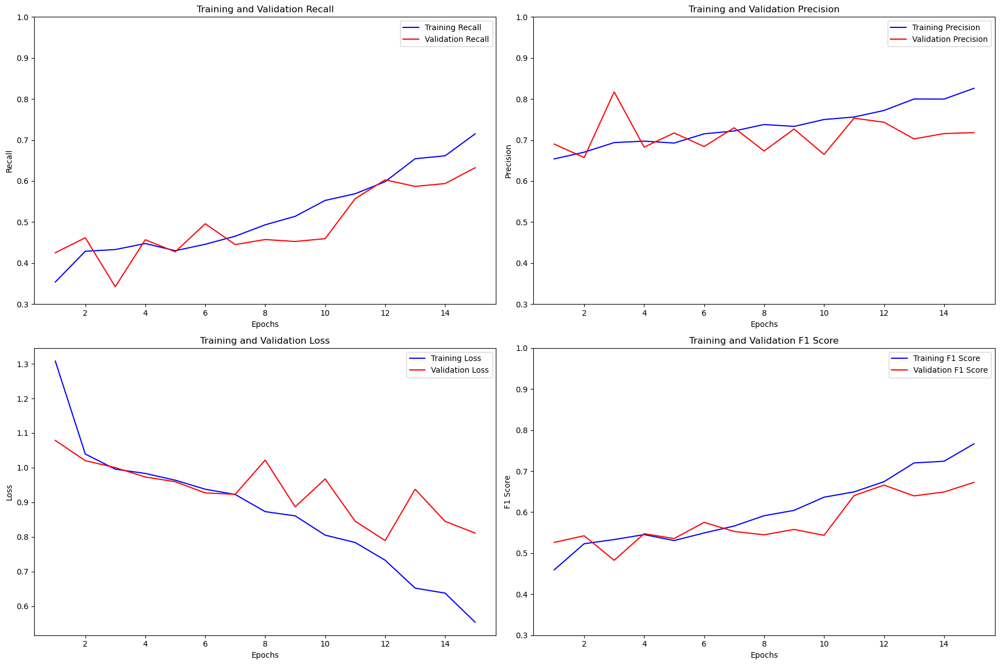

In [22]:
compute_and_plot_metrics(history.history, y_min=0.3)

With the introduction of the binary label we can immediately see a significant score increase and reduction of overfit.

###### <span style="font-size:20px;">Evaluation</span>

In [ ]:
#model.compile(loss=None)
#EXPORT_PATH = 'Multiclass_multi_modal.keras'
#model.save(EXPORT_PATH)

In [5]:
model=load_model('Best models\Multiclass_multi_modal.keras')

In [12]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])

loss: 0.7344 - precision: 0.7679 - recall: 0.5870 - <br>val_loss: 0.7893 - val_precision: 0.7434 - val_recall: 0.6030

Train

In [93]:
#train
calculate_f1_score(0.7679, 0.5870)

0.6653735331020739

Validation

In [ ]:
pred_probabilities = model.predict([X_val, Y_val_binary])
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val_multiclass, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

              precision    recall  f1-score   support

           0       0.77      0.45      0.57       107
           1       0.78      0.93      0.85       821
           2       0.57      0.66      0.61       243
           3       0.66      0.35      0.46       128
           4       0.57      0.48      0.53       190
           5       0.63      0.31      0.42       134
           6       0.32      0.41      0.36       109
           7       0.67      0.56      0.61       137

    accuracy                           0.68      1869
   macro avg       0.62      0.52      0.55      1869
weighted avg       0.68      0.68      0.67      1869



F1 Macro Avg: 0.55

Test

In [ ]:
test_loss, test_precision, test_recall = model.evaluate([X_test, Y_binary_test], Y_multiclass_test, verbose=1)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")

49/49 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.7848 - precision: 0.7303 - recall: 0.6383
Test Loss: 0.8195
Test Precision: 0.7213
Test Recall: 0.6301


In [81]:
pred_probabilities = model.predict([X_test, Y_binary_test])
# Convert probabilities to class labels
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_multiclass_test, axis=1)

49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step


In [ ]:
report = classification_report(Y_true_classes, Y_pred_classes, digits=4)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0     0.8200    0.4607    0.5899        89
           1     0.7800    0.9020    0.8366       684
           2     0.5865    0.6847    0.6318       203
           3     0.5472    0.2736    0.3648       106
           4     0.5862    0.5380    0.5611       158
           5     0.4648    0.2946    0.3607       112
           6     0.3393    0.4176    0.3744        91
           7     0.6837    0.5877    0.6321       114

    accuracy                         0.6737      1557
   macro avg     0.6010    0.5199    0.5439      1557
weighted avg     0.6661    0.6737    0.6595      1557



##### 2nd Model - Lighter Architecture

In [5]:
image_input = Input(shape=(224, 224, 3), name="image_input")

x = Conv2D(32, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(image_input)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(32, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(32, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(64, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Flatten()(x)

x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)


############################

binary_input = Input(shape=(1,), name='binary_input')
y = Dense(32, activation='relu')(binary_input)

############################

combined = concatenate([x, y])
z = Dense(1024, activation='relu')(combined)
z = Dense(1024, activation='relu')(z)


multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)
model = Model(inputs=[image_input, binary_input], outputs=multiclass_output)

In [6]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])
model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [7]:
history=model.fit([X_train, Y_train_binary], Y_train_multiclass, epochs=30, batch_size=16, validation_data=([X_val, Y_val_binary], Y_val_multiclass), verbose=1, callbacks=callbacks)

Epoch 1/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - loss: 1.6299 - precision: 0.5899 - recall: 0.2057
Epoch 1: val_loss improved from inf to 1.16975, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 80s 268ms/step - loss: 1.6292 - precision: 0.5901 - recall: 0.2060 - val_loss: 1.1698 - val_precision: 0.6686 - val_recall: 0.4329
Epoch 2/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - loss: 1.1228 - precision: 0.6857 - recall: 0.4160
Epoch 2: val_loss improved from 1.16975 to 1.04503, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 66s 242ms/step - loss: 1.1226 - precision: 0.6857 - recall: 0.4160 - val_loss: 1.0450 - val_precision: 0.6519 - val_recall: 0.4580
Epoch 3/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 1.0121 - precision: 0.6947 - recall: 0.4269
Epoch 3: val_loss improved from 1.04503 to 0.99042, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 67s 244ms/step - loss: 1.0121 - precision: 0.6947 - recall

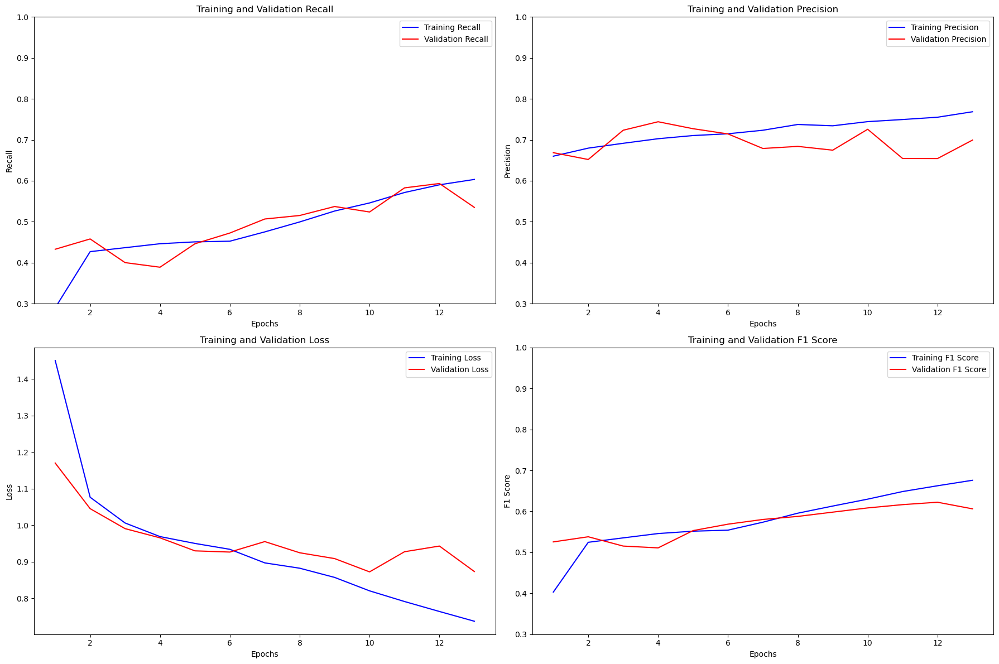

In [8]:
compute_and_plot_metrics(history.history, y_min=0.3)

Comparing the two models, the results are similar overall. However, the training loss decreases more in the 1st Model. This can suggest that using more complex models and addressing overfitting could lead to better results, so we plan to use that architecture in the future.

##### Grid Search

In [ ]:
def build_model(conv_filters, dense_units, learning_rate):
    # Image Input
    image_input = Input(shape=(224, 224, 3), name="image_input")
    
    x = Conv2D(conv_filters, kernel_size=3, padding='same', activation='relu',
               kernel_initializer='he_uniform')(image_input)
    x = MaxPooling2D((3, 3))(x)
    
    x = Conv2D(conv_filters * 2, kernel_size=3, padding='same', activation='relu',
               kernel_initializer='he_uniform')(x)
    x = MaxPooling2D((3, 3))(x)
    
    x = Conv2D(conv_filters * 4, kernel_size=3, padding='same', activation='relu',
               kernel_initializer='he_uniform')(x)
    x = MaxPooling2D((3, 3))(x)
    
    x = Conv2D(conv_filters * 8, kernel_size=3, padding='same', activation='relu',
               kernel_initializer='he_uniform')(x)
    x = MaxPooling2D((3, 3))(x)
    
    x = Flatten()(x)
    
    x = Dense(dense_units, activation='relu')(x)
    x = Dense(dense_units, activation='relu')(x)
    x = Dense(dense_units, activation='relu')(x)
    
    # Binary Input
    binary_input = Input(shape=(1,), name='binary_input')
    y = Dense(dense_units // 16, activation='relu')(binary_input)
    
    # Concatenate
    combined = concatenate([x, y])
    z = Dense(dense_units, activation='relu')(combined)
    z = Dense(dense_units, activation='relu')(z)
    z = Dense(dense_units, activation='relu')(z)
    z = Dense(dense_units, activation='relu')(z)
    
    multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)
    
    model = Model(inputs=[image_input, binary_input], outputs=multiclass_output)
    
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['precision', 'recall'])
    
    return model


# 3. Define Hyperparameter Grid


param_grid = {
    'conv_filters': [32, 64],
    'dense_units': [1024, 2048],
    'learning_rate': [1e-3, 1e-4]
}

# Generate all combinations of hyperparameters
keys, values = zip(*param_grid.items())
param_combinations = [dict(zip(keys, v)) for v in product(*values)]


# 4. Grid Search Implementation


best_accuracy = 0
best_params = {}
history_records = {}

for idx, params in enumerate(param_combinations):
    print(f"Training model {idx+1}/{len(param_combinations)} with parameters: {params}")
    
    # Build the model with current hyperparameters
    model = build_model(conv_filters=params['conv_filters'],
                        dense_units=params['dense_units'],
                        learning_rate=params['learning_rate'])
    
    # Train the model
    history=model.fit([X_train, Y_train_binary], Y_train_multiclass, epochs=5, batch_size=16, validation_data=([X_val, Y_val_binary], Y_val_multiclass), verbose=1)
    
    # Evaluate the model
    val_accuracy = history.history['val_loss'][-1]
    print(f"Validation loss: {val_accuracy:.4f}\n")
    
    # Save history
    history_records[idx] = history.history
    
    # Update best model if current model is better
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_params = params.copy()

print("Grid Search Complete!")
print(f"Best Validation loss: {best_accuracy:.4f}")
print(f"Best Hyperparameters: {best_params}")

Training model 1/8 with parameters: {'conv_filters': 32, 'dense_units': 1024, 'learning_rate': 0.001}
Epoch 1/5
273/273 ━━━━━━━━━━━━━━━━━━━━ 112s 369ms/step - loss: 1.4375 - precision: 0.5845 - recall: 0.3106 - val_loss: 1.1468 - val_precision: 0.6449 - val_recall: 0.4393
Epoch 2/5
273/273 ━━━━━━━━━━━━━━━━━━━━ 95s 347ms/step - loss: 1.1515 - precision: 0.6333 - recall: 0.3796 - val_loss: 1.1350 - val_precision: 0.6449 - val_recall: 0.4393
Epoch 3/5
273/273 ━━━━━━━━━━━━━━━━━━━━ 94s 346ms/step - loss: 1.1466 - precision: 0.6340 - recall: 0.4458 - val_loss: 1.1344 - val_precision: 0.6449 - val_recall: 0.4393
Epoch 4/5
273/273 ━━━━━━━━━━━━━━━━━━━━ 97s 356ms/step - loss: 1.2351 - precision: 0.6405 - recall: 0.4232 - val_loss: 1.1598 - val_precision: 0.6449 - val_recall: 0.4393
Epoch 5/5
273/273 ━━━━━━━━━━━━━━━━━━━━ 96s 350ms/step - loss: 1.1522 - precision: 0.6448 - recall: 0.4196 - val_loss: 1.1375 - val_precision: 0.6449 - val_recall: 0.4393
Validation loss: 1.1375

Training model 2/8 wit

MemoryError: Unable to allocate 2.44 GiB for an array with shape (4358, 224, 224, 3) and data type float32

Even though the data arrays contained float16, the grid search was set to use float32 by default. Due to time constraints it was not possible to spend more time trying to overcome this situation.

#### 4.2.4.2. 2nd Approach - Using Binary Label and Magnification

if adding only the binary label benign/malignant already provided a significant performance increase, we will try to also add the resulution of the image.

##### Redoing Preprocessing

As we need to obtain the information of the magnification, we needed to do the preprocessing again.

In [2]:
image_data = pd.read_csv('images/image_data.csv')

In [3]:
image_data['Magnification'] = image_data['Magnification'].str.rstrip('X').astype(np.int32)

In [4]:
X_train=[]
X_test=[]
Y_binary_train=[]
Y_binary_test=[]
Y_multiclass_train=[]
Y_multiclass_test=[]
Y_magnification_train=[]
Y_magnification_test=[]

In [5]:
for i in tqdm(image_data[image_data['train_test']=='train'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (224,224))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    label3 = image_data.loc[i, 'Magnification']
    X_train.append(np.array(img))  
    Y_binary_train.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_train.append(label2)  
    Y_magnification_train.append(label3)

for i in tqdm(image_data[image_data['train_test']=='test'].index):  
    img = image_data['final_path'].iloc[i]  
    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.resize(img, (224,224))
    label1 = image_data.loc[i, 'Benign or Malignant']  
    label2 = image_data.loc[i, 'Cancer Type']  
    label3 = image_data.loc[i, 'Magnification']
    X_test.append(np.array(img))  
    Y_binary_test.append(1 if label1=='Malignant' else 0) 
    Y_multiclass_test.append(label2)  
    Y_magnification_test.append(label3)

  0%|          | 12/5931 [00:00<01:50, 53.53it/s]

100%|██████████| 1978/1978 [00:20<00:00, 97.62it/s] 


In [6]:
X_train = np.asarray(X_train, dtype='float16') / 255
X_test = np.asarray(X_test, dtype='float16') / 255
Y_binary_train = np.asarray(Y_binary_train)
Y_binary_test = np.asarray(Y_binary_test)
Y_multiclass_train = np.asarray(Y_multiclass_train)
Y_multiclass_test = np.asarray(Y_multiclass_test)
Y_magnification_train = np.asarray(Y_magnification_train)
Y_magnification_test = np.asarray(Y_magnification_test)

In [7]:
all_dataset = np.concatenate((X_test, X_train), axis=0)
all_labels_binary = np.concatenate((Y_binary_test, Y_binary_train), axis=0)
all_labels_multiclass = np.concatenate((Y_multiclass_test, Y_multiclass_train), axis=0)
all_labels_magnification = np.concatenate((Y_magnification_test, Y_magnification_train), axis=0)

In [8]:
unique_rows, unique_indices = np.unique(all_dataset, axis=0, return_index=True)

# Sort the unique indices to maintain the original order
unique_indices = np.sort(unique_indices)

# Extract the unique rows from the dataset
all_dataset_unique = all_dataset[unique_indices]

# Extract the corresponding labels for the unique rows
all_labels_binary = all_labels_binary[unique_indices]
all_labels_multiclass = all_labels_multiclass[unique_indices]
all_labels_magnification = all_labels_magnification[unique_indices]

print(f"Original number of rows: {all_dataset.shape[0]}")
print(f"Number of unique rows: {all_dataset_unique.shape[0]}")

Original number of rows: 7909
Number of unique rows: 7784


In [9]:
# Perform train-test split with stratification based on the combined labels
X_train, X_test, Y_train_binary, Y_test_binary, Y_train_multiclass, Y_test_multiclass, X_train_magnification, X_test_magnification = train_test_split(
    all_dataset_unique,
    all_labels_binary,
    all_labels_multiclass,
    all_labels_magnification,
    test_size=0.2,
    random_state=42,
    stratify=all_labels_multiclass, 
    shuffle=True)

In [10]:
enc = LabelEncoder()
Y_train_multiclass = enc.fit_transform(Y_train_multiclass)
Y_test_multiclass = enc.transform(Y_test_multiclass)
Y_train_multiclass = to_categorical(Y_train_multiclass)
Y_test_multiclass = to_categorical(Y_test_multiclass)

In [11]:
# Perform train-validation split with stratification based on the combined labels
X_train, X_val, Y_train_binary, Y_val_binary, Y_train_multiclass, Y_val_multiclass, X_train_magnification, X_val_magnification = train_test_split(
    X_train,
    Y_train_binary,
    Y_train_multiclass,
    X_train_magnification,
    test_size=0.3,
    random_state=42,
    stratify=Y_train_multiclass,  
    shuffle=True)

##### Model

In [12]:
image_input = Input(shape=(224, 224, 3), name="image_input")

x = Conv2D(32, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(image_input)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(64, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(128, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Conv2D(256, kernel_size=3, padding='same', activation='relu',
           kernel_initializer='he_uniform')(x)
x = MaxPooling2D((3, 3))(x)

x = Flatten()(x)

x = Dense(1024, activation='relu')(x)
x = Dense(1024, activation='relu')(x)


############################

binary_input = Input(shape=(1,), name='binary_input')
y = Dense(1024, activation='relu')(binary_input)

############################

input_magnification = Input(shape=(1,), name='input_magnification')
w = Dense(64, activation='relu')(input_magnification)

############################
combined = concatenate([x, y,w])
z = Dense(1024, activation='relu')(combined)
z = Dense(1024, activation='relu')(z)


multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)
model = Model(inputs=[image_input, binary_input,input_magnification ], outputs=multiclass_output)

In [13]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])
model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [17]:
history=model.fit([X_train, Y_train_binary, X_train_magnification], Y_train_multiclass, epochs=30, batch_size=16, validation_data=([X_val, Y_val_binary, X_val_magnification], Y_val_multiclass), verbose=1, callbacks=callbacks)

Epoch 1/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - loss: 2.2937 - precision: 0.4788 - recall: 0.2177
Epoch 1: val_loss improved from inf to 1.43227, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 109s 363ms/step - loss: 2.2919 - precision: 0.4792 - recall: 0.2180 - val_loss: 1.4323 - val_precision: 0.6535 - val_recall: 0.4521
Epoch 2/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - loss: 1.3497 - precision: 0.6087 - recall: 0.3904
Epoch 2: val_loss improved from 1.43227 to 1.12493, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 87s 318ms/step - loss: 1.3493 - precision: 0.6088 - recall: 0.3905 - val_loss: 1.1249 - val_precision: 0.6474 - val_recall: 0.5040
Epoch 3/30
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step - loss: 1.0848 - precision: 0.6611 - recall: 0.4386
Epoch 3: val_loss improved from 1.12493 to 1.04604, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 84s 308ms/step - loss: 1.0849 - precision: 0.6611 - recal

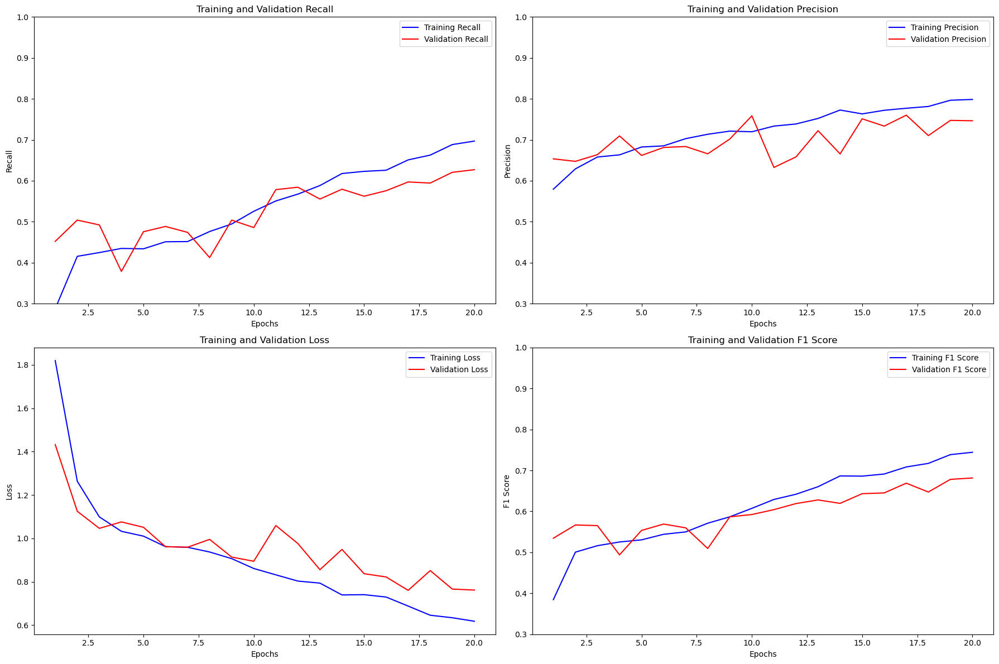

In [20]:
compute_and_plot_metrics(history.history, y_min=0.3)

In [15]:
pred_probabilities = model.predict([X_val, Y_val_binary, X_val_magnification])
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val_multiclass, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step
              precision    recall  f1-score   support

           0       0.69      0.66      0.68       107
           1       0.84      0.76      0.80       821
           2       0.54      0.92      0.68       243
           3       0.57      0.50      0.53       128
           4       0.48      0.59      0.53       190
           5       0.38      0.51      0.43       134
           6       0.85      0.21      0.34       109
           7       0.84      0.31      0.46       137

    accuracy                           0.66      1869
   macro avg       0.65      0.56      0.56      1869
weighted avg       0.71      0.66      0.65      1869



F1 Macro Avg: 0.56

No significant improvements in comparison to the 1st Approach.

#### 4.2.4.3. Transfer Learning 

As until now we tested various things, and still the most promising one is the [1st Model of the 1st Approach](#1st-model), but the scores for us was satisfacories. So, we will try to use transfer learners to see if we can increase the scores.

We will use DenseNet121 as from our research showed most frequently good performance on cancer cells images.

##### 1st Approach - Fine Tuning some layers

In [5]:
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers[:-12]:
    layer.trainable = False

for layer in base_model.layers[-12:]: # Fine tuning last 12 layers
    layer.trainable = True

x = Flatten()(base_model.output)  
x = Dense(1024, activation='relu')(x)  
x = Dropout(0.5)(x)  
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)  
output = Dense(8, activation='softmax')(x)  

model = Model(inputs=base_model.input, outputs=output)

In [6]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])
model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [9]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=30, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 3.2037 - precision: 0.3714 - recall: 0.2410
Epoch 1: val_loss improved from inf to 1.46402, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 612s 4s/step - loss: 3.1974 - precision: 0.3721 - recall: 0.2410 - val_loss: 1.4640 - val_precision: 0.7785 - val_recall: 0.2558
Epoch 2/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.5710 - precision: 0.6907 - recall: 0.2741
Epoch 2: val_loss improved from 1.46402 to 1.32478, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 507s 4s/step - loss: 1.5707 - precision: 0.6907 - recall: 0.2743 - val_loss: 1.3248 - val_precision: 0.7693 - val_recall: 0.3569
Epoch 3/30
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.4032 - precision: 0.7153 - recall: 0.3416
Epoch 3: val_loss improved from 1.32478 to 1.21781, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 498s 4s/step - loss: 1.4031 - precision: 0.7153 - recall: 0.3416 - val_

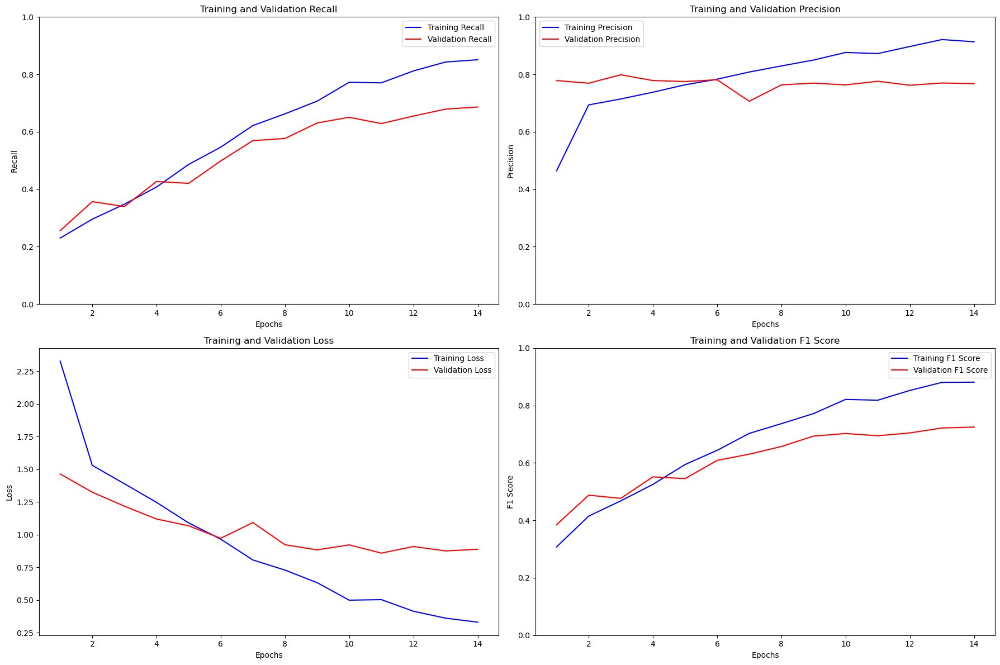

In [10]:
compute_and_plot_metrics(history.history, y_min=0)

In [7]:
history = model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=6, batch_size=32, verbose=1, callbacks=callbacks)

Epoch 1/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 3.1360 - precision: 0.3717 - recall: 0.2466
Epoch 1: val_loss improved from inf to 1.46698, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 642s 4s/step - loss: 3.1300 - precision: 0.3723 - recall: 0.2466 - val_loss: 1.4670 - val_precision: 0.8111 - val_recall: 0.2274
Epoch 2/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.5300 - precision: 0.6999 - recall: 0.2908
Epoch 2: val_loss improved from 1.46698 to 1.31808, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 603s 4s/step - loss: 1.5298 - precision: 0.6999 - recall: 0.2909 - val_loss: 1.3181 - val_precision: 0.7953 - val_recall: 0.3077
Epoch 3/6
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.3860 - precision: 0.6969 - recall: 0.3511
Epoch 3: val_loss improved from 1.31808 to 1.14893, saving model to best_model_by_loss.keras
137/137 ━━━━━━━━━━━━━━━━━━━━ 590s 4s/step - loss: 1.3858 - precision: 0.6970 - recall: 0.3512 - val_los

In [8]:
pred_probabilities = model.predict(X_val)
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)
print(classification_report(Y_true_classes, Y_pred_classes))

59/59 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step
              precision    recall  f1-score   support

           0       0.57      0.46      0.51       107
           1       0.68      0.97      0.80       821
           2       0.74      0.51      0.60       243
           3       0.71      0.27      0.39       128
           4       0.63      0.28      0.39       190
           5       0.58      0.23      0.33       134
           6       0.43      0.56      0.49       109
           7       0.65      0.61      0.63       137

    accuracy                           0.66      1869
   macro avg       0.62      0.48      0.52      1869
weighted avg       0.66      0.66      0.62      1869



F1 Macro Avg: 0.52

We can see that without much experimentation, we already obtain better results with only image input. This let us think of the potential of using Densenet121 in the multi input model.

##### 2nd Approach - Multi Input with DenseNet121

###### <span style="font-size:19px;">Model</span>

In [32]:
arrays = np.load('images/data_arrays.npz')
X_train_full = arrays['arr_0']
X_test = arrays['arr_1']
Y_binary_train = arrays['arr_2']
Y_binary_test = arrays['arr_3']
Y_multiclass_train = arrays['arr_4']
Y_multiclass_test = arrays['arr_5']

In [ ]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)

In [ ]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [34]:
# Perform train-validation split with stratification based on the combined labels
X_train, X_val, Y_train_binary, Y_val_binary, Y_train_multiclass, Y_val_multiclass = train_test_split(
    X_train_full,
    Y_binary_train,
    Y_multiclass_train,
    test_size=0.3,
    random_state=42,
    stratify=Y_multiclass_train,  
    shuffle=True)

In [16]:
image_input = Input(shape=(224, 224, 3), name="image_input")

base_model = DenseNet121(weights='imagenet', include_top=False, input_tensor=image_input)

for layer in base_model.layers[:-12]:
    layer.trainable = False

for layer in base_model.layers[-12:]:
    layer.trainable = True


x = Flatten(name='flatten')(base_model.output)  
x = Dense(1024, activation='relu')(x)  
x = Dropout(0.5)(x)  
x = Dense(1024, activation='relu')(x) 
x = Dropout(0.5)(x)  


############################

binary_input = Input(shape=(1,), name='binary_input')
y = Dense(1024, activation='relu')(binary_input)

############################

combined = concatenate([x, y])
z = Dense(1024, activation='relu')(combined)
z = Dense(1024, activation='relu')(z)


multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)
model = Model(inputs=[image_input, binary_input], outputs=multiclass_output)

In [9]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])
model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [10]:
history=model.fit([X_train, Y_train_binary], Y_train_multiclass, epochs=6, batch_size=16, validation_data=([X_val, Y_val_binary], Y_val_multiclass), verbose=1, callbacks=callbacks)

Epoch 1/6
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 2.0900 - precision: 0.4671 - recall: 0.2313
Epoch 1: val_loss improved from inf to 1.15956, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 789s 3s/step - loss: 2.0886 - precision: 0.4676 - recall: 0.2316 - val_loss: 1.1596 - val_precision: 0.7278 - val_recall: 0.4120
Epoch 2/6
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 1.1487 - precision: 0.6897 - recall: 0.4272
Epoch 2: val_loss improved from 1.15956 to 0.92916, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 740s 3s/step - loss: 1.1485 - precision: 0.6897 - recall: 0.4273 - val_loss: 0.9292 - val_precision: 0.7167 - val_recall: 0.5035
Epoch 3/6
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.9717 - precision: 0.7071 - recall: 0.4949
Epoch 3: val_loss improved from 0.92916 to 0.86044, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 746s 3s/step - loss: 0.9716 - precision: 0.7071 - recall: 0.4950 - val_los

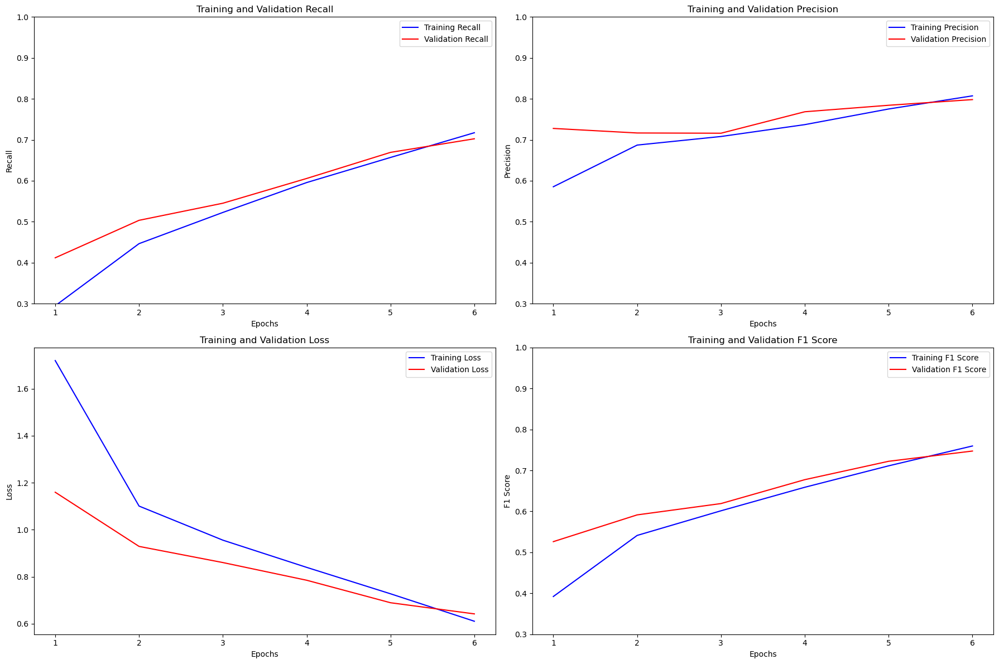

In [23]:
compute_and_plot_metrics(history.history, y_min=0.3)

From the plots we can quickly see an improvement even compared to the approach of just fine tuning DenseNet121. The introduction of the binary label really contributes positively to the models' performance.

###### <span style="font-size:19px;">Evaluation</span>

In [11]:
test_loss, test_precision, test_recall = model.evaluate([X_test, Y_binary_test], Y_multiclass_test, verbose=1)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")

49/49 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - loss: 0.6337 - precision: 0.8062 - recall: 0.7163
Test Loss: 0.6553
Test Precision: 0.7907
Test Recall: 0.7013


In [ ]:
#model.compile()
#EXPORT_PATH = 'Multiclass_multi_modal_tranferlearn.keras'
#model.save(EXPORT_PATH)

In [2]:
model=load_model('Best models\Multiclass_multi_modal_tranferlearn.keras')

In [18]:
#train
calculate_f1_score(0.8014, 0.7077)

0.7516410840898547

In [12]:
pred_probabilities = model.predict([X_val, Y_val_binary])
# Convert probabilities to class labels
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val_multiclass, axis=1)

In [13]:
print(classification_report(Y_true_classes, Y_pred_classes, target_names=enc.classes_))

                     precision    recall  f1-score   support

           Adenosis       0.71      0.77      0.74       107
   Ductal Carcinoma       0.79      0.97      0.87       821
       Fibroadenoma       0.72      0.79      0.75       243
  Lobular Carcinoma       0.78      0.30      0.44       128
 Mucinous Carcinoma       0.76      0.56      0.64       190
Papillary Carcinoma       0.81      0.44      0.57       134
    Phyllodes Tumor       0.69      0.31      0.43       109
    Tubular Adenoma       0.73      0.88      0.79       137

           accuracy                           0.76      1869
          macro avg       0.75      0.63      0.65      1869
       weighted avg       0.76      0.76      0.74      1869



In [19]:
#val
calculate_f1_score(0.7982, 0.7025)

0.7472985939894716

In [24]:
pred_probabilities = model.predict([X_test, Y_binary_test])
# Convert probabilities to class labels
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_multiclass_test, axis=1)

49/49 ━━━━━━━━━━━━━━━━━━━━ 127s 2s/step


In [12]:
print(classification_report(Y_true_classes, Y_pred_classes, target_names=enc.classes_))

                     precision    recall  f1-score   support

           Adenosis       0.73      0.81      0.77        89
   Ductal Carcinoma       0.78      0.96      0.86       684
       Fibroadenoma       0.68      0.75      0.71       203
  Lobular Carcinoma       0.65      0.21      0.31       106
 Mucinous Carcinoma       0.83      0.59      0.69       158
Papillary Carcinoma       0.77      0.44      0.56       112
    Phyllodes Tumor       0.54      0.24      0.33        91
    Tubular Adenoma       0.71      0.83      0.77       114

           accuracy                           0.75      1557
          macro avg       0.71      0.60      0.63      1557
       weighted avg       0.74      0.75      0.72      1557



In [20]:
#test
calculate_f1_score(0.7907, 0.7013)

0.7433215951742627

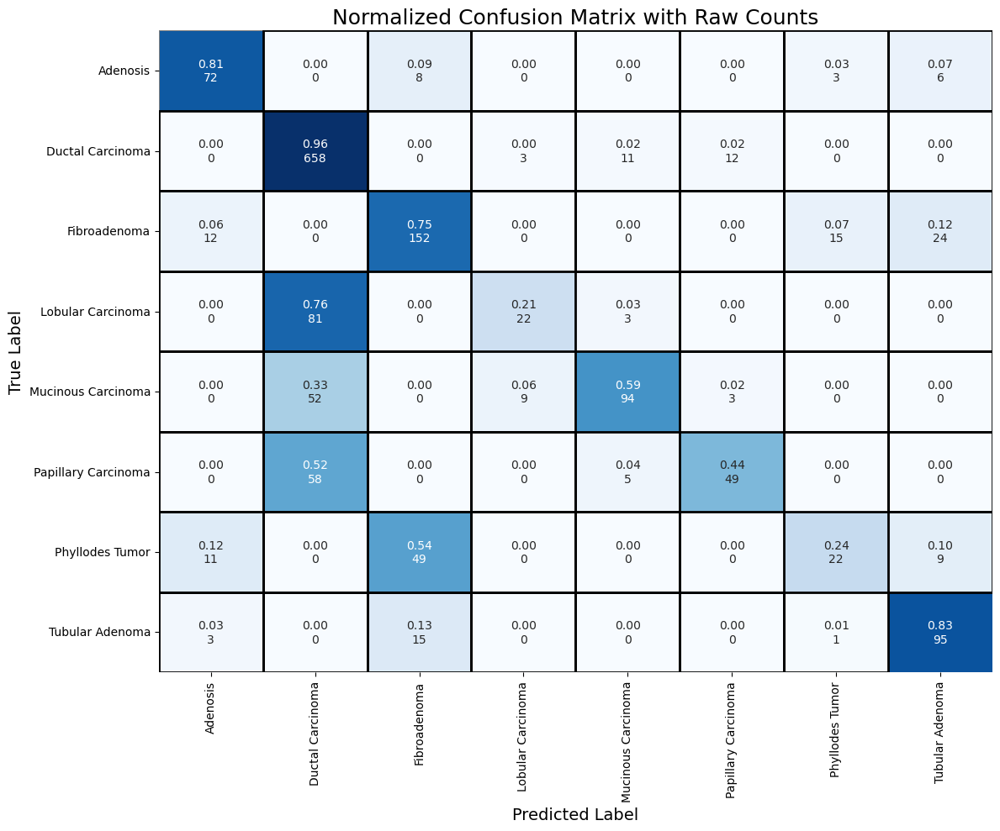

In [52]:
plot_confusion_heatmap(Y_true_classes, Y_pred_classes, enc.classes_)

Our model exhibits a tendency to overpredict Ductal Carcinoma, as evident in its predictions for Lobular Carcinoma, Mucinous Carcinoma, and Papillary Carcinoma, where these classes are often misclassified as Ductal Carcinoma. This indicates a need to improve differentiation among these four classes.

This issue may stem from the limited number of samples in the minority classes. To address this, upsampling the underrepresented classes could now derive in an effective approach. Alternatively, exploring image transformations that enhance the distinguishing features between these classes might be beneficial. However, this would likely require either prior medical expertise or extensive experimentation, beyond the few attempts conducted so far.

In [ ]:
Y_true_class_names = enc.inverse_transform(Y_true_classes)
Counter(Y_true_class_names)

Counter({'Ductal Carcinoma': 684,
         'Fibroadenoma': 203,
         'Mucinous Carcinoma': 158,
         'Tubular Adenoma': 114,
         'Papillary Carcinoma': 112,
         'Lobular Carcinoma': 106,
         'Phyllodes Tumor': 91,
         'Adenosis': 89})

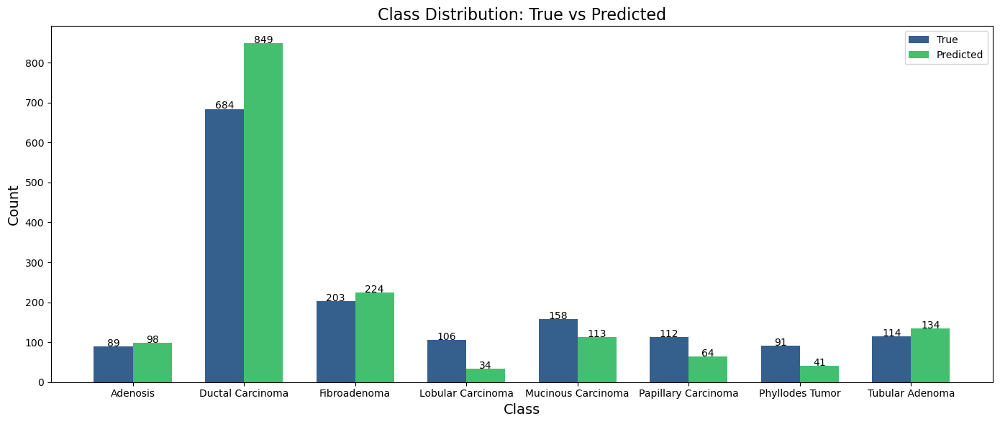

In [83]:
plot_class_distribution(Y_true_classes, Y_pred_classes, enc.classes_)

As previsouly mentioned there is an overpredict of class Ductal Carcinoma

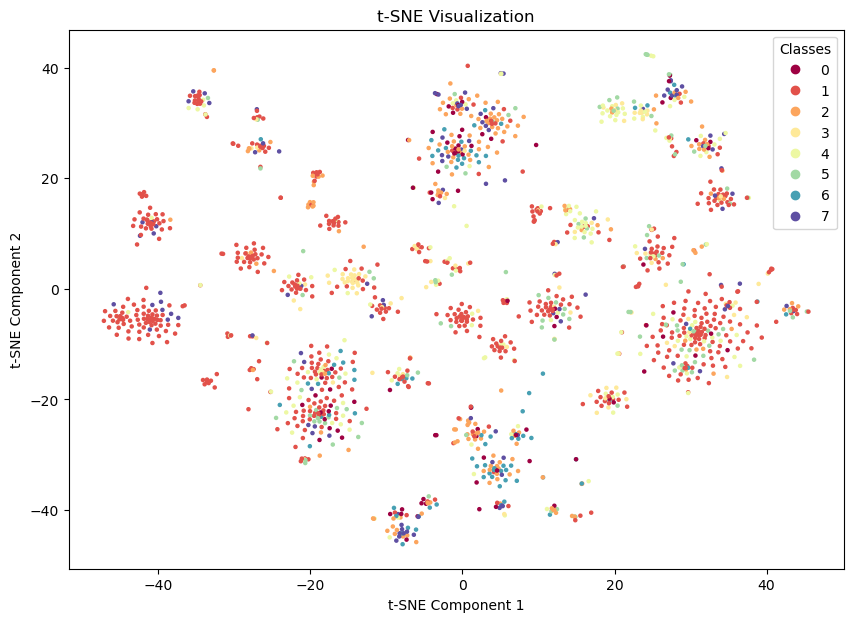

In [31]:
X_test_reshaped = X_test.reshape(X_test.shape[0], -1)
tsne = TSNE(n_components=2, perplexity=2, random_state=42)

# Fit tsne to the data
X_tsne = tsne.fit_transform(X_test_reshaped)

# Plot t-SNE visualization
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=Y_true_classes, cmap='Spectral', s=5)
plt.legend(*scatter.legend_elements(), title="Classes")
plt.title('t-SNE Visualization')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

 There are no visible clusters of classes.

##### 3rd Approach - Multi Input with ResNet50

Let's try a different transfer learner to check if there are any positive improvements.

In [15]:
image_input = Input(shape=(224, 224, 3), name="image_input")


base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=image_input)

for layer in base_model.layers[:-12]:
    layer.trainable = False

for layer in base_model.layers[-12:]:
    layer.trainable = True


x = Flatten(name='flatten')(base_model.output)  
x = Dense(1024, activation='relu')(x)  
x = Dropout(0.5)(x)  
x = Dense(1024, activation='relu')(x) 
x = Dropout(0.5)(x)  


############################

binary_input = Input(shape=(1,), name='binary_input')
y = Dense(1024, activation='relu')(binary_input)

############################

combined = concatenate([x, y])
z = Dense(1024, activation='relu')(combined)
z = Dense(1024, activation='relu')(z)


multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)
model = Model(inputs=[image_input, binary_input], outputs=multiclass_output)

In [16]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])
model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [17]:
history=model.fit([X_train, Y_train_binary], Y_train_multiclass, epochs=6, batch_size=16, validation_data=([X_val, Y_val_binary], Y_val_multiclass), verbose=1, callbacks=callbacks)

Epoch 1/6
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.8497 - precision: 0.5225 - recall: 0.2324
Epoch 1: val_loss improved from inf to 1.16094, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 948s 3s/step - loss: 1.8486 - precision: 0.5228 - recall: 0.2327 - val_loss: 1.1609 - val_precision: 0.6461 - val_recall: 0.4532
Epoch 2/6
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - loss: 1.1525 - precision: 0.6362 - recall: 0.4512
Epoch 2: val_loss improved from 1.16094 to 1.15241, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 838s 3s/step - loss: 1.1525 - precision: 0.6362 - recall: 0.4512 - val_loss: 1.1524 - val_precision: 0.6472 - val_recall: 0.4505
Epoch 3/6
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 1.1476 - precision: 0.6253 - recall: 0.4344
Epoch 3: val_loss improved from 1.15241 to 1.09796, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 797s 3s/step - loss: 1.1476 - precision: 0.6253 - recall: 0.4345 - val_los

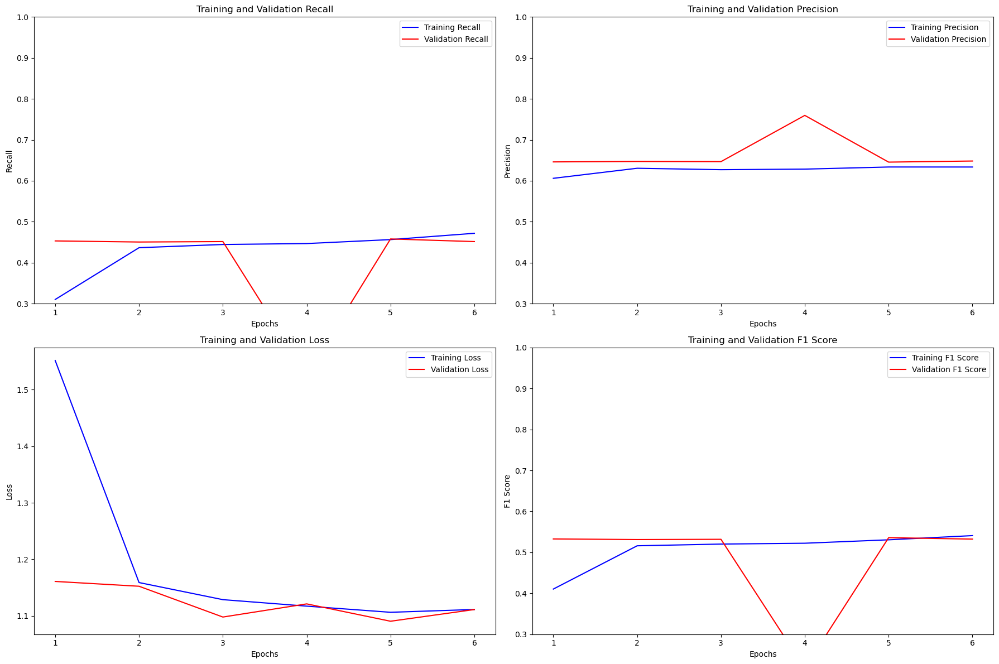

In [19]:
compute_and_plot_metrics(history.history, y_min=0.3)

Worst results, probably this would need more dense layers to converge to better results but as it takes aroudn 11min per epoch, we will leave this be, as DenseNet121 with the same architeture leads to better results.

##### Hyperband Tuning Multi Input with DenseNet121

We will try diferent hyperparameters for learning rate and unfreeze layers, and try diferent optimizers on top of the best approach so far - Multi Input with DenseNet121.

In [5]:
def build_model(hp):    
    # Image input
    image_input = Input(shape=(224, 224, 3), name="image_input")
    
    # Binary input
    binary_input = Input(shape=(1,), name="binary_input")
    

    # Load Base Model (DenseNet121)
    base_model = DenseNet121(
        weights='imagenet',
        include_top=False,
        input_tensor=image_input)

    
    # Freeze all layers except the last 'unfreeze_layers' layers
    unfreeze_layers = hp.Int('unfreeze_layers', min_value=12, max_value=36, step=24)
    
    for layer in base_model.layers[:-unfreeze_layers]:
        layer.trainable = False
    
    for layer in base_model.layers[-unfreeze_layers:]:
        layer.trainable = True
    
    
    x = Flatten(name='flatten')(base_model.output)  
    x = Dense(1024, activation='relu')(x)  
    x = Dropout(0.5)(x)  
    x = Dense(1024, activation='relu')(x) 
    x = Dropout(0.5)(x)  

 ############################   
    y = Dense(1024, activation='relu')(binary_input)
    
 ############################
    
    combined = concatenate([x, y])
    
  
    z = Dense(1024, activation='relu')(combined)
    z = Dense(1024, activation='relu')(z)

    
    multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)

    model = Model(inputs=[image_input, binary_input],outputs=multiclass_output)
    
    
    # Choose optimizer and learning rate as hyperparameters
    optimizer_choice = hp.Choice('optimizer', values=['adam', 'rmsprop'])
    
    if optimizer_choice == 'adam':
        optimizer = Adam(
        learning_rate=hp.Choice('learning_rate', values=[1e-5, 1e-4]))

    else:
        optimizer = tf.keras.optimizers.RMSprop(
        learning_rate=hp.Choice('learning_rate', values=[1e-5, 1e-4]))

    # Compiling the model
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['precision', 'recall'])
    
    return model

In [6]:
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=8,
    factor=4,
    directory='hyperband_dir',
    project_name='dense_net121_multi_input_tuning',
    overwrite=True)

#callback
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2)

In [7]:
tuner.search_space_summary()

Search space summary
Default search space size: 3
unfreeze_layers (Int)
{'default': None, 'conditions': [], 'min_value': 12, 'max_value': 36, 'step': 24, 'sampling': 'linear'}
optimizer (Choice)
{'default': 'adam', 'conditions': [], 'values': ['adam', 'rmsprop'], 'ordered': False}
learning_rate (Choice)
{'default': 1e-05, 'conditions': [], 'values': [1e-05, 0.0001], 'ordered': True}


In [8]:
tuner.search(
    [X_train, Y_train_binary],
    Y_train_multiclass,
    epochs=7,
    validation_data=([X_val, Y_val_binary], Y_val_multiclass),
    callbacks=[stop_early],
    verbose=1, batch_size=16)

Trial 10 Complete [01h 23m 11s]
val_loss: 0.6327718496322632

Best val_loss So Far: 0.6327718496322632
Total elapsed time: 06h 44m 07s


In [ ]:
# Get the optimal hyperparameters
best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best Hyperparameters:")
print(f"Unfreeze Layers: {best_hp.get('unfreeze_layers')}")
print(f"Optimizer: {best_hp.get('optimizer')}")
print(f"Learning Rate: {best_hp.get('learning_rate')}")

Best Hyperparameters:
Unfreeze Layers: 12
Optimizer: adam
Learning Rate: 0.0001


Of the 8 model combinatons, the one that had best val_loss was the one that we tested previosly. Of course we could add more hyperparameters to test but with only 10 trials it took around 400 minutes to run, with our computational resources we will leave the tuning like this and set as final model [this](#2nd-approach---multi-input-with-densenet121) one.

#### 4.2.4.4. Giving just the image as Input

So far we have been using the true labels for benign/malignant. In a real case scenario the images would be inputed without that information. Therefore we will use our final binary model to make the predictions for the binary label and use that information to the feed the global model.

##### Training

In [2]:
load=load_model('Best models\\final_binary.keras')

In [3]:
arrays = np.load('images/data_arrays.npz')
X_train_full = arrays['arr_0']
X_test = arrays['arr_1']
Y_binary_train = arrays['arr_2']
Y_binary_test = arrays['arr_3']
Y_multiclass_train = arrays['arr_4']
Y_multiclass_test = arrays['arr_5']

In [4]:
enc = LabelEncoder()
Y_multiclass_train = enc.fit_transform(Y_multiclass_train)
Y_multiclass_test = enc.transform(Y_multiclass_test)
Y_multiclass_train = to_categorical(Y_multiclass_train)
Y_multiclass_test = to_categorical(Y_multiclass_test)

In [5]:
# Perform train-validation split with stratification based on the combined labels
X_train, X_val, Y_train_binary, Y_val_binary, Y_train_multiclass, Y_val_multiclass = train_test_split(
    X_train_full,
    Y_binary_train,
    Y_multiclass_train,
    test_size=0.3,
    random_state=42,
    stratify=Y_multiclass_train,  
    shuffle=True)

In [6]:
def binary_predict(x): # Loads the images to the binary model and returns the predictions
    return load(x)

In [7]:
image_input = Input(shape=(224, 224, 3), name="image_input")

base_model = DenseNet121(weights='imagenet', include_top=False, input_tensor=image_input)

for layer in base_model.layers[:-12]:
    layer.trainable = False

for layer in base_model.layers[-12:]:
    layer.trainable = True


x = Flatten(name='flatten')(base_model.output)  
x = Dense(1024, activation='relu')(x)  
x = Dropout(0.5)(x)  
x = Dense(1024, activation='relu')(x) 
x = Dropout(0.5)(x)  


############################

binary_input = Lambda(binary_predict)(image_input) # Lambda must be used to be able to run the binary model predictions here
y = Dense(1024, activation='relu')(binary_input)

############################

combined = concatenate([x, y])
z = Dense(1024, activation='relu')(combined)
z = Dense(1024, activation='relu')(z)


multiclass_output = Dense(8, activation='softmax', name='multiclass_output')(z)
model = Model(inputs=image_input, outputs=multiclass_output)

In [8]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',  
              metrics=['precision', 'recall'])
model_checkpoint = ModelCheckpoint('best_model_by_loss.keras', monitor='val_loss',save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, mode='min', verbose=1)
callbacks = [early_stopping, model_checkpoint]

In [21]:
history=model.fit(X_train, Y_train_multiclass, epochs=10, batch_size=16, validation_data=(X_val, Y_val_multiclass), verbose=1, callbacks=callbacks)

Epoch 1/10
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - loss: 2.1590 - precision: 0.4631 - recall: 0.2238
Epoch 1: val_loss improved from inf to 1.27687, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 208s 716ms/step - loss: 2.1578 - precision: 0.4635 - recall: 0.2239 - val_loss: 1.2769 - val_precision: 0.6980 - val_recall: 0.4205
Epoch 2/10
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 556ms/step - loss: 1.3189 - precision: 0.6853 - recall: 0.3922
Epoch 2: val_loss improved from 1.27687 to 1.08977, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 194s 712ms/step - loss: 1.3187 - precision: 0.6853 - recall: 0.3923 - val_loss: 1.0898 - val_precision: 0.6849 - val_recall: 0.5094
Epoch 3/10
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 571ms/step - loss: 1.1576 - precision: 0.6981 - recall: 0.4604
Epoch 3: val_loss improved from 1.08977 to 0.99065, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 205s 752ms/step - loss: 1.1576 - precision: 0.6981 - rec

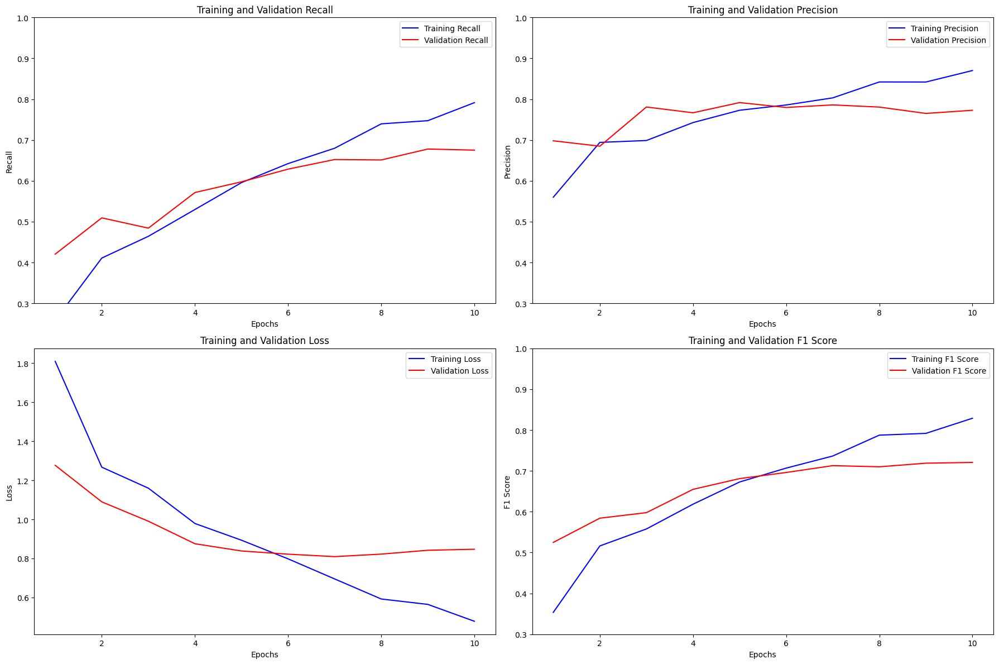

In [22]:
compute_and_plot_metrics(history.history, y_min=0.3)

Let's cut to 7 epochs to avoid the overfitting.

In [9]:
history=model.fit(X_train, Y_train_multiclass, epochs=7, batch_size=16, validation_data=(X_val, Y_val_multiclass), verbose=1, callbacks=callbacks)

Epoch 1/7
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - loss: 2.0865 - precision: 0.4867 - recall: 0.2286
Epoch 1: val_loss improved from inf to 1.22973, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 221s 755ms/step - loss: 2.0853 - precision: 0.4870 - recall: 0.2288 - val_loss: 1.2297 - val_precision: 0.7551 - val_recall: 0.3943
Epoch 2/7
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - loss: 1.3029 - precision: 0.7011 - recall: 0.3988
Epoch 2: val_loss improved from 1.22973 to 1.08684, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 197s 722ms/step - loss: 1.3028 - precision: 0.7011 - recall: 0.3989 - val_loss: 1.0868 - val_precision: 0.7759 - val_recall: 0.3927
Epoch 3/7
273/273 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - loss: 1.1681 - precision: 0.7053 - recall: 0.4446
Epoch 3: val_loss improved from 1.08684 to 1.03688, saving model to best_model_by_loss.keras
273/273 ━━━━━━━━━━━━━━━━━━━━ 203s 744ms/step - loss: 1.1681 - precision: 0.7053 - recall

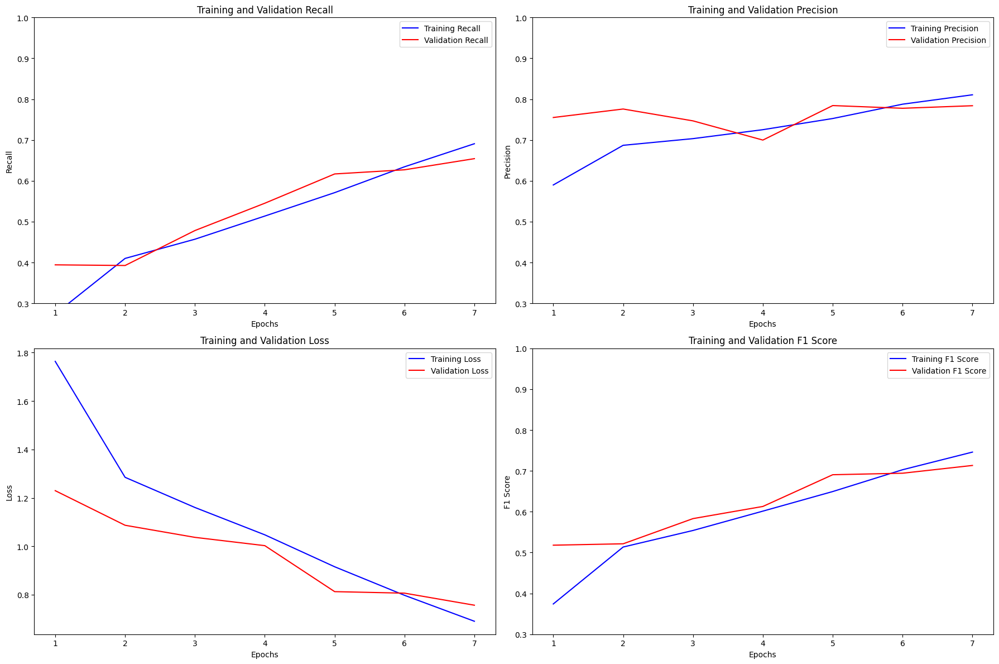

In [11]:
compute_and_plot_metrics(history.history, y_min=0.3)

##### Evaluation

In [18]:
# train
calculate_f1_score(0.8150, 0.6888)

0.7466046016757547

In [10]:
pred_probabilities = model.predict(X_val)
# Convert probabilities to class labels
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_val_multiclass, axis=1)

59/59 ━━━━━━━━━━━━━━━━━━━━ 47s 743ms/step


In [19]:
# validation
calculate_f1_score(0.7840, 0.6544)

0.713361512791991

In [12]:
print(classification_report(Y_true_classes, Y_pred_classes, target_names=enc.classes_))

                     precision    recall  f1-score   support

           Adenosis       0.77      0.64      0.70       107
   Ductal Carcinoma       0.81      0.91      0.86       821
       Fibroadenoma       0.67      0.65      0.66       243
  Lobular Carcinoma       0.55      0.38      0.45       128
 Mucinous Carcinoma       0.59      0.60      0.60       190
Papillary Carcinoma       0.59      0.58      0.58       134
    Phyllodes Tumor       0.49      0.43      0.46       109
    Tubular Adenoma       0.76      0.66      0.71       137

           accuracy                           0.72      1869
          macro avg       0.65      0.61      0.63      1869
       weighted avg       0.71      0.72      0.71      1869



F1 Score Macro Avg: 0.63

In [13]:
pred_probabilities = model.predict(X_test)
# Convert probabilities to class labels
Y_pred_classes = np.argmax(pred_probabilities, axis=1)
Y_true_classes = np.argmax(Y_multiclass_test, axis=1)

49/49 ━━━━━━━━━━━━━━━━━━━━ 35s 705ms/step


In [17]:
test_loss, test_precision, test_recall = model.evaluate(X_test, Y_multiclass_test, verbose=1)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall: {test_recall:.4f}")

49/49 ━━━━━━━━━━━━━━━━━━━━ 43s 872ms/step - loss: 0.8255 - precision: 0.7740 - recall: 0.6551
Test Loss: 0.8586
Test Precision: 0.7607
Test Recall: 0.6371


In [20]:
# validation
calculate_f1_score(0.7607, 0.6371)

0.6934353555587351

In [14]:
print(classification_report(Y_true_classes, Y_pred_classes, target_names=enc.classes_))

                     precision    recall  f1-score   support

           Adenosis       0.75      0.53      0.62        89
   Ductal Carcinoma       0.79      0.88      0.83       684
       Fibroadenoma       0.70      0.66      0.68       203
  Lobular Carcinoma       0.51      0.36      0.42       106
 Mucinous Carcinoma       0.58      0.64      0.61       158
Papillary Carcinoma       0.42      0.50      0.46       112
    Phyllodes Tumor       0.53      0.36      0.43        91
    Tubular Adenoma       0.79      0.61      0.69       114

           accuracy                           0.69      1557
          macro avg       0.63      0.57      0.59      1557
       weighted avg       0.69      0.69      0.69      1557



F1 Score Macro Avg: 0.59

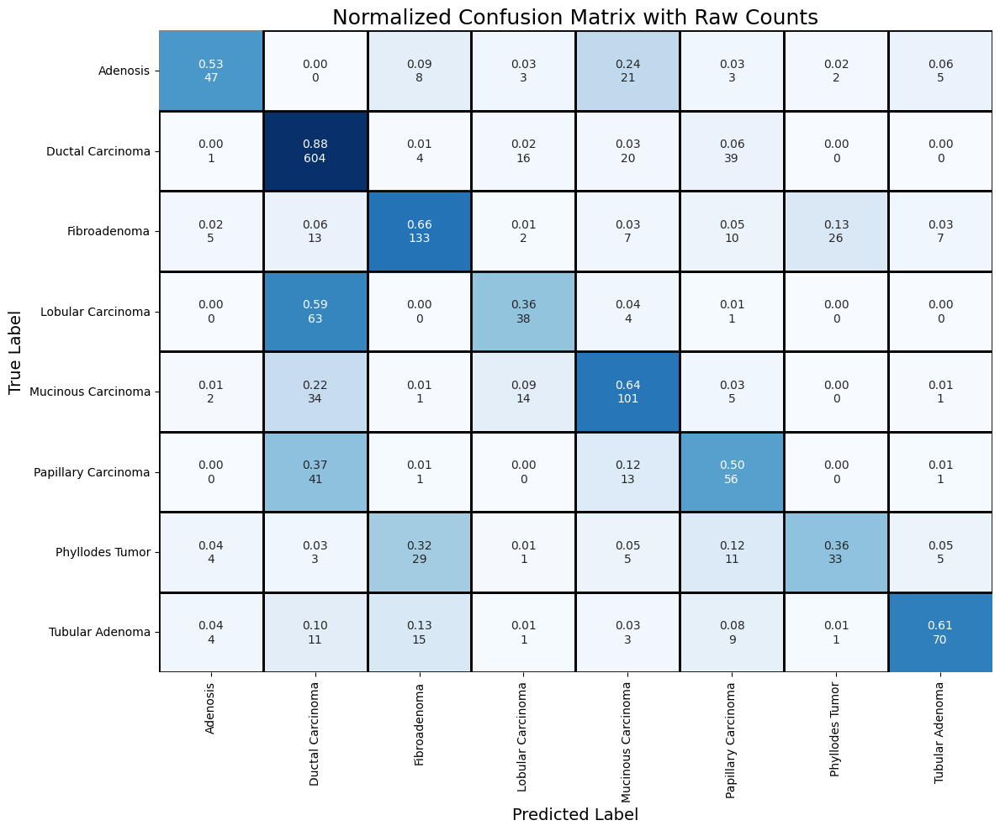

In [15]:
plot_confusion_heatmap(Y_true_classes, Y_pred_classes, enc.classes_)

It is surprising to see that by introducing our final binary model in the predictions of the cancer cell, we don't get a significant drop in its performance as we will not feed the model 100% accurate binary labels. However, on this approach it leads to more overprediction on some classes and some overfit when compared to the training set. On a real life scenario that you would present just an image to the model and using our previous model that was not hypertuned (with space for improvements), this architecture could lead to the same results as using the true labels. Therefore, we will use this as our final model.

# 5. Conclusion about the Project

In simpler problems, where a small architecture can already yield good results (such as in binary classification), it may be worth building our own model. However, for more complex problems, using the right transfer learning model can provide better results more easily. This allows us to focus on experimenting with data augmentation and other techniques within the transfer learning framework, rather than spending time developing small architectures that may not deliver the desired performance.

Considerations:

 Although in the multiclass problem we optimized based on val_loss, our goal was to optimize according to the F1 macro score (to ensure equal treatment of classes). We attempted to implement custom metrics but were unable to do so successfully. As a result, we opted to use val_loss for optimization. However unfortunately, we observed that the F1 weighted average is higher than the macro F1 score. Either way, the best model was based on the best f1 macro score.

What we would like to delve into but didn't got the time was:

- Hypertune the binary problem model, possibly obtaining better results.

For the multiclass problem:

- Using the data augmentation aproach with reduced image size in our best model because this approach got better macro f1 score compared to using the normal dataset.
- Fix the error with the grid search.
- Using a hyperband tunning with more parameters
- Try dynamic class weights based on model performance, or adjusting class weights for classes that were missclassified as the majority class


## 5.1. Final Results

### 5.1.1. Binary Classification Results




| Set   | Loss  | Precision | Recall | F1 Score |
|------------|-------|-----------|--------|----------|
| Train      | 0.1910| 0.9409    | 0.9562 | 0.9485   |
| Validation | 0.2321| 0.9146    | 0.9440 | 0.9291   |
| Test       | 0.1854| 0.9373    | 0.9442 | 0.9407   |

### 5.1.2. Binary Classification Model Summary

[Final Model Hyperlink](#training) 

In [38]:
load.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 74, 74, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     8,389,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │         1,025 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,068,356 (72.74 MB)

 Trainable params: 9,533,953 (36.37 MB)

 Non-trainable params: 448 (1.75 KB)

 Optimizer params: 9,533,955 (36.37 MB)

### 5.1.3. Multiclass Classification Results

[Final Model Hyperlink](#4244-giving-just-the-image-as-input)


| Dataset    | Loss  | Precision | Recall | F1 Score |
|------------|-------|-----------|--------|----------|
| Train      | 0.6875| 0.8150    | 0.6888 | 0.7466   |
| Validation | 0.7567| 0.7840    | 0.6544 | 0.7134   |
| Test       | 0.8586| 0.7607    | 0.6371 | 0.6934   |

F1 Macro Avg: 0.59      

F1 Weighted Avg  0.69     

### 5.1.4. Multiclass Classification Model Summary

In [16]:
model.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_input         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ image_input[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 174,214,106 (664.57 MB)

 Trainable params: 55,793,864 (212.84 MB)

 Non-trainable params: 6,832,512 (26.06 MB)

 Optimizer params: 111,587,730 (425.67 MB)